# ATLAS OmniFold - Stress Test A
In this notebook, we use a single a sample to perform a stress test. First, we split the existing sample in half, and then we inject a nontrivial weighting to one half to change the overall distribution compared to the original. In this example, for a given event $x$ in sample $X$, the stress weights are given by 

$w = w_{MC}(-\min(\mathcal{Z}(X))+\mathcal{Z}(x))^n$,

where $w_{MC}$ is the Monte Carlo event weight and $\mathcal{Z}$ gives the z-score of $x\in X$. We do a basic weight standardization given all stress weights $W$ by doing $\frac{W}{\text{mean}(W)}$. These stress weights are constructed to induce a right shift in the given distribution. Note that a larger value of $n$ induces a more intense right-shift in the stressed distributions.

### Standard Imports

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "3"

In [3]:
from __future__ import absolute_import, division, print_function

from ntupleanalysis import *
import math

import numpy as np
import scipy.stats as stats
from matplotlib import pyplot as plt
from matplotlib.patches import Patch

from sklearn.model_selection import train_test_split
import sklearn.preprocessing as preprocessing

import tensorflow as tf
import tensorflow.keras
import tensorflow.keras.backend as K
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping

In [4]:
plot_setup()

In [5]:
# Global plot settings
import matplotlib.font_manager
plt.rcParams.update({
    "text.usetex": True,
    "pgf.rcfonts": False,
    "font.family": "serif",
    "font.size": 22,
    "xtick.labelsize": 15, 
    "ytick.labelsize": 15, 
    "legend.fontsize":15
})

In [6]:
# Define default plot styles
plot_style_0 = {
    'histtype': 'step',
    'color': 'black',
    'linewidth': 2,
    'linestyle': '--',
    'density': True
}

plot_style_1 = {
    'histtype': 'step',
    'color': 'black',
    'linewidth': 2,
    'density': True
}

plot_style_2 = {'histtype': 'stepfilled', 'alpha': 0.5, 'density': True}

### Utilities

In [7]:
# from NN (DCTR)
def reweight(model, events):
    f = model.predict(events, batch_size=1000)
    weights = f / (1. - f)
    return np.squeeze(weights)

In [8]:
# Binary crossentropy for classifying two samples with weights
# Weights are "hidden" by zipping in y_true (the labels)


def weighted_binary_crossentropy(y_true, y_pred):
    weights = tf.gather(y_true, [1], axis=1)  # event weights
    y_true = tf.gather(y_true, [0], axis=1)  # actual y_true for loss

    # Clip the prediction value to prevent NaN's and Inf's
    epsilon = K.epsilon()
    y_pred = K.clip(y_pred, epsilon, 1. - epsilon)

    t_loss = -weights * ((y_true) * K.log(y_pred) +
                         (1 - y_true) * K.log(1 - y_pred))

    return K.mean(t_loss)

In [9]:
# z-score standardization of data

def standardize(sim_truth, sim_reco, data_reco):
    scaler_truth = preprocessing.StandardScaler()
    scaler_reco = preprocessing.StandardScaler()

    scaler_truth.fit(sim_truth.reshape(-1, 1))
    scaler_reco.fit(np.concatenate((sim_reco, data_reco)).reshape(-1, 1))

    sim_truth_z = np.squeeze(scaler_truth.transform(sim_truth.reshape(-1, 1)))
    sim_reco_z = np.squeeze(scaler_reco.transform(sim_reco.reshape(-1, 1)))
    data_reco_z = np.squeeze(scaler_reco.transform(data_reco.reshape(-1, 1)))

    return sim_truth_z, sim_reco_z, data_reco_z

In [10]:
def get_weights_stress(sim_truth, data_truth, data_weights_MC, degree=2):
    scaler = preprocessing.StandardScaler()
    scaler.fit(
        np.concatenate((sim_truth[sim_truth != -99],
                        data_truth[data_truth != -99])).reshape(-1, 1))

    weight_seed = np.squeeze(scaler.transform(data_truth.reshape(-1, 1)))

    weights_stress = -np.min(weight_seed) + weight_seed
    weights_stress = data_weights_MC * (weights_stress)**degree
    weights_stress = weights_stress / np.mean(weights_stress)

    return weights_stress

In [11]:
plot_dir = './SupportNote/figures/ATLASOmniFold-StressTest/ATLASOmniFold-StressTestA/'

In [12]:
save_label0 = 'ATLASOmniFold-StressTestA'

### Load ROOT files

In [13]:
data_dir = '/clusterfs/ml4hep/bpnachman/slimmedSamplesSystematics/'

In [14]:
Events = uproot.lazy(
    data_dir +
    "ZjetOmnifold_Mar27_PowhegPythia_mc16e_slim_EventWeightSystematics.root:OmniTree"
)

In [15]:
for field in Events.fields:
    print(field)

weight
pass190
truth_pass190
weight_mc
prw
pT_ll
pT_l1
pT_l2
eta_l1
eta_l2
phi_l1
phi_l2
y_ll
pT_trackj1
y_trackj1
phi_trackj1
m_trackj1
tau1_trackj1
tau2_trackj1
tau3_trackj1
pT_trackj2
y_trackj2
phi_trackj2
m_trackj2
tau1_trackj2
tau2_trackj2
tau3_trackj2
truth_pT_ll
truth_pT_l1
truth_pT_l2
truth_eta_l1
truth_eta_l2
truth_phi_l1
truth_phi_l2
truth_y_ll
truth_pT_trackj1
truth_y_trackj1
truth_phi_trackj1
truth_m_trackj1
truth_tau1_trackj1
truth_tau2_trackj1
truth_tau3_trackj1
truth_pT_trackj2
truth_y_trackj2
truth_phi_trackj2
truth_m_trackj2
truth_tau1_trackj2
truth_tau2_trackj2
truth_tau3_trackj2
syst_prwUp
syst_prwDown
mu_recoSF
syst_recoSFUp
syst_recoSFDown
mu_isoSF
syst_isoSFUp
syst_isoSFDown
mu_TTVASF
syst_TTVASFUp
syst_TTVASFDown
singleMuonTrigSF
syst_trigSFUp
syst_trigSFDown
EventNumber
RunNumber
Ntracks
Ntracks_trackj1
Ntracks_trackj2
truth_Ntracks
truth_Ntracks_trackj1
truth_Ntracks_trackj2
pT_tracks
eta_tracks
phi_tracks
trackJetIndex_tracks
truth_pT_tracks
truth_eta_tracks
t

### Unpack data

In [16]:
# Event selection

mypass = (Events['pass190'].to_numpy().astype(bool)) | (
    Events['truth_pass190'].to_numpy().astype(bool))
mycut_truth = np.invert(
    Events['truth_pass190'].to_numpy().astype(bool))[mypass]
mycut_reco = np.invert(
    Events['pass190'].to_numpy().astype(bool))[mypass]

In [17]:
# Load Monte Carlo Event Weights
truth_weights_MC = np.array(Events['weight_mc'][mypass].to_list())
reco_weights_MC = np.array(Events['weight'][mypass].to_list())

# standardize
truth_weights_MC = truth_weights_MC / np.mean(truth_weights_MC)
reco_weights_MC = reco_weights_MC / np.mean(reco_weights_MC)

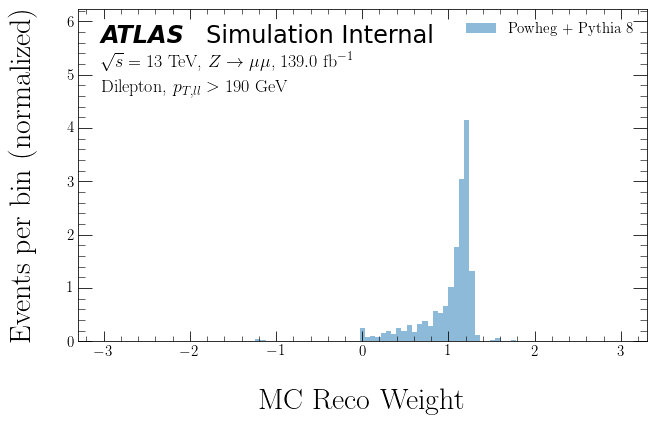

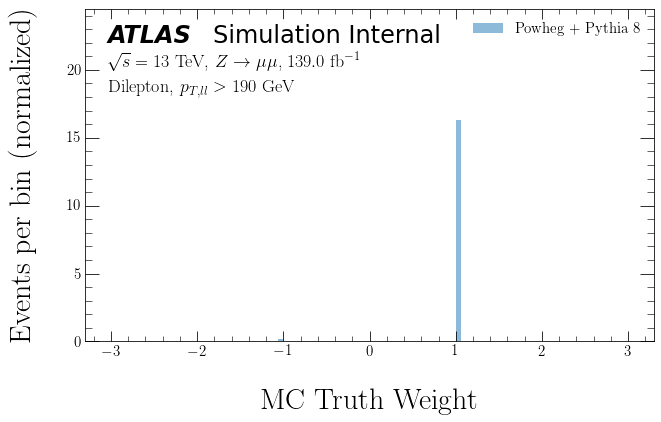

In [18]:
bins = np.linspace(-3, 3, 100)

plt.figure(figsize=(10, 6))
hW_reco, _, _ = plt.hist(reco_weights_MC,
                             bins=bins,
                             label=r'Powheg + Pythia 8',
                             **plot_style_2)
plt.xlabel('MC Reco Weight')
plt.ylabel('Events per bin (normalized)')
plt.ylim(top=1.5 * np.max(hW_reco))
plt.legend()
draw_atlas_text()
plt.show()

plt.figure(figsize=(10, 6))
hW_truth, _, _ = plt.hist(truth_weights_MC,
                              bins=bins,
                              label=r'Powheg + Pythia 8',
                              **plot_style_2)
plt.xlabel('MC Truth Weight')
plt.ylabel('Events per bin (normalized)')
plt.ylim(top=1.5 * np.max(hW_truth))
plt.legend()
draw_atlas_text()
plt.show()

In [19]:
file_labels = [
    'Ntracks_trackj1', 'Ntracks_trackj2', 'm_trackj1', 'm_trackj2',
    'pT_trackj1', 'pT_trackj2', 'y_trackj1', 'y_trackj2', 'phi_trackj1',
    'phi_trackj2', 'tau1_trackj1', 'tau1_trackj2', 'tau2_trackj1',
    'tau2_trackj2', 'tau3_trackj1', 'tau3_trackj2', 'pT_ll', 'y_ll', 'pT_l1',
    'pT_l2', 'eta_l1', 'eta_l2', 'phi_l1', 'phi_l2'
]

plot_labels = [
    '$N_{j_1}$', '$N_{j_2}$', '$m_{j_1}$ [GeV]', '$m_{j_2}$ [GeV]',
    '$p_{T,j_1}$ [GeV]', '$p_{T,j_2}$ [GeV]', '$y_{j_1}$', '$y_{j_2}$',
    '$\phi_{j_1}$', '$\phi_{j_2}$', r'$\tau_{1,j_1}$', r'$\tau_{1,j_2}$',
    r'$\tau_{2,j_1}$', r'$\tau_{2,j_2}$', r'$\tau_{3,j_1}$', r'$\tau_{3,j_2}$',
    '$p_{T,ll}$ [GeV]', '$y_{ll}$', '$p_{T,l_1}$ [GeV]', '$p_{T,l_2}$ [GeV]',
    '$\eta_{l_1}$', '$\eta_{l_2}$', '$\phi_{l_1}$', '$\phi_{l_2}$'
]

In [20]:
IBU_hists = uproot.open('/clusterfs/ml4hep/adisurtya/ATLASOmniFold/unfoldingPlotsJune14.root')

In [21]:
bins = []
for label in file_labels:
    bins += [IBU_hists['PowPy8_2018_'+label+'_Truth'].to_numpy()[1]]

In [22]:
labels_and_bins = zip(file_labels, plot_labels, bins)

obs = []

for file_label, plot_label, plot_bins in labels_and_bins:
    obs += [{
        'file_label': file_label,
        'plot_label': plot_label,
        'bins': plot_bins
    }]

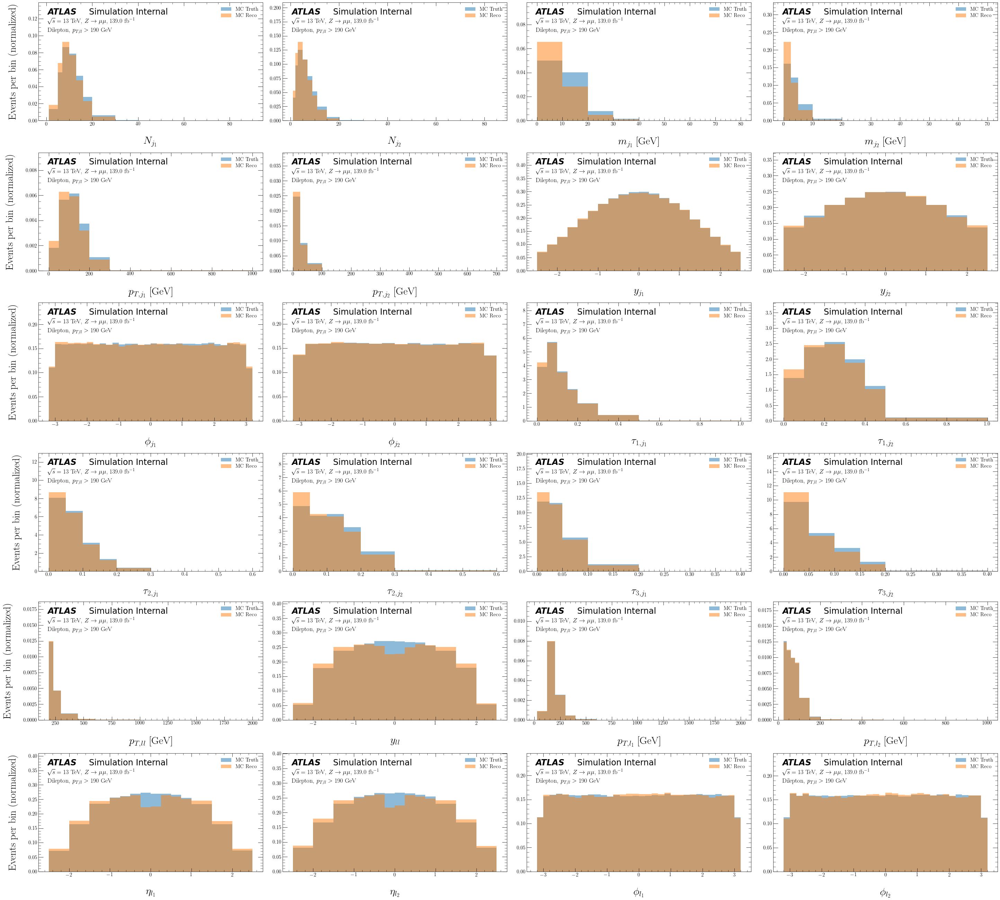

In [23]:
# Preview Observables

fig, ax = plt.subplots(6, 4, figsize=(40, 36), constrained_layout=True)
ax = np.ndarray.flatten(ax)

for i in range(len(obs)):
    bins = obs[i]['bins']
    hT, _, _ = ax[i].hist(
        Events['truth_' + obs[i]['file_label']][
            Events['truth_pass190'].to_numpy().astype(bool)],
        weights=Events['weight_mc'][
            Events['truth_pass190'].to_numpy().astype(bool)],
        bins=bins,
        label="MC Truth",
        **plot_style_2)
    hR, _, _ = ax[i].hist(Events[obs[i]['file_label']][
        Events['pass190'].to_numpy().astype(bool)],
                          weights=Events['weight'][
                              Events['pass190'].to_numpy().astype(bool)],
                          bins=bins,
                          label="MC Reco",
                          **plot_style_2)
    ax[i].set_xlabel(obs[i]['plot_label'])
    draw_atlas_text(ax=ax[i])
    if i % 4 == 0:
        ax[i].set_ylabel("Events per bin (normalized)")
    ax[i].legend()
    ax[i].set_ylim([0, 1.5 * max(max(hT), max(hR))])

### Define UniFold Algorithm

In [24]:
"""    Arguments:
                            
        iterations: number of iterations (integer)
        
        sim_truth: MC Truth observable as Numpy array
                    
        sim_reco: MC Reco observable as Numpy array
                    
        data_reco: Data Reco observable 
                            to be unfolded as Numpy arrays
                            
        sim_truth_weights_MC: (optional) initial MC generator weights for truth simulation sample
        
        sim_reco_weights_MC: (optional) initial MC generator weights for reco simulation sample
        
        data_reco_weights_MC: (optional) initial MC generator weights for reco "data" sample
        
        verbose: (optional) (integer) 0 supresses all output; 1 is normal output
        
        Returns:
        
        weights: A Numpy array of weights to reweight distribution of 
                    sim_truth to the unfolded distribution of data_reco
                    (MC weights still need to be applied)
        
        model: The model used to calculate those weights
"""


def unifold(iterations,
            sim_truth,
            sim_reco,
            data_reco,
            sim_truth_weights_MC=None,
            sim_reco_weights_MC=None,
            data_reco_weights_MC=None,
            verbose=0):

    if sim_truth_weights_MC is None:
        sim_truth_weights_MC = np.ones(len(sim_truth))

    if sim_reco_weights_MC is None:
        sim_reco_weights_MC = np.ones(len(sim_reco))

    if data_reco_weights_MC is None:
        data_reco_weights_MC = np.ones(len(data_reco))

    # initialize training data and weights
    labels_sim = np.zeros(len(sim_reco))
    labels_data = np.ones(len(data_reco))

    xvals_1 = np.concatenate((sim_reco, data_reco))
    yvals_1 = np.concatenate((labels_sim, labels_data))

    xvals_2 = np.concatenate((sim_truth, sim_truth))
    yvals_2 = np.concatenate((labels_sim, (labels_sim + 1.)))

    weights = np.empty(shape=(iterations, 2, len(sim_truth)))
    # shape = (iteration, step, event)

    weights_pull = np.ones_like(sim_truth_weights_MC)
    weights_push = np.ones_like(sim_reco_weights_MC)

    # initialize model
    inputs = Input((1, ))
    hidden_layer_1 = Dense(50, activation='relu')(inputs)
    hidden_layer_2 = Dense(50, activation='relu')(hidden_layer_1)
    hidden_layer_3 = Dense(50, activation='relu')(hidden_layer_2)
    outputs = Dense(1, activation='sigmoid')(hidden_layer_3)

    model = Model(inputs=inputs, outputs=outputs)

    earlystopping = EarlyStopping(patience=10,
                                  verbose=verbose,
                                  restore_best_weights=True)

    for i in range(iterations):
        if verbose == 1:
            print("\nITERATION: {}\n".format(i + 1))

        # STEP 1: classify MC Reco (which is reweighted by weights_push) to Data Reco
        # this reweights reweighted MC Reco --> Data Reco
        if verbose == 1:
            print("STEP 1\n")

        # iterative weights for MC Reco, initial weights for Data Reco
        weights_1 = np.concatenate(
            (weights_push * sim_reco_weights_MC, data_reco_weights_MC))
        
        X_train_1, X_test_1, Y_train_1, Y_test_1, w_train_1, w_test_1 = train_test_split(
            xvals_1, yvals_1, weights_1)

        # zip ("hide") the weights with the labels
        Y_train_1 = np.stack((Y_train_1, w_train_1), axis=1)
        Y_test_1 = np.stack((Y_test_1, w_test_1), axis=1)
        
        # compile and train model
        model.compile(loss=weighted_binary_crossentropy,
                      optimizer='Adam',
                      metrics=['accuracy'])
        model.fit(X_train_1,
                  Y_train_1,
                  epochs=200,
                  batch_size=10000,
                  validation_data=(X_test_1, Y_test_1),
                  callbacks=[earlystopping],
                  verbose=verbose)

        # calculate, normalize, and clip weights
        weights_pull = weights_push * reweight(model, sim_reco)
        weights_pull[np.argwhere(
            np.isnan(weights_pull))] = sim_reco_weights_MC[np.argwhere(
                np.isnan(weights_pull))]
        weights_pull = np.clip(weights_pull, -1e3, 1e3)
        weights_pull /= np.mean(weights_pull)
        weights_pull = np.clip(weights_pull, -10, 10)
        weights[i, :1, :] = weights_pull

        # STEP 2: classify nominal MC Truth to reweighted (by weights_pull) MC Truth
        # this reweights nominal MC Truth --> reweighted MC Truth
        if verbose == 1:
            print("\nSTEP 2\n")

        # MC weights for MC Truth, pulled weights for (reweighted) MC Truth
        weights_2 = np.concatenate(
            (sim_truth_weights_MC, weights_pull * sim_truth_weights_MC))

        X_train_2, X_test_2, Y_train_2, Y_test_2, w_train_2, w_test_2 = train_test_split(
            xvals_2, yvals_2, weights_2)

        # zip ("hide") the weights with the labels
        Y_train_2 = np.stack((Y_train_2, w_train_2), axis=1)
        Y_test_2 = np.stack((Y_test_2, w_test_2), axis=1)

        # compile and train model
        model.compile(loss=weighted_binary_crossentropy,
                      optimizer='Adam',
                      metrics=['accuracy'])
        model.fit(X_train_2,
                  Y_train_2,
                  epochs=200,
                  batch_size=10000,
                  validation_data=(X_test_2, Y_test_2),
                  callbacks=[earlystopping],
                  verbose=verbose)

        # calculate, normalize, and clip weights
        weights_push = reweight(model, sim_truth)
        weights_push[np.argwhere(
            np.isnan(weights_push))] = sim_truth_weights_MC[np.argwhere(
                np.isnan(weights_push))]
        weights_push = np.clip(weights_push, -1e3, 1e3)
        weights_push /= np.mean(weights_push)
        weights_push = np.clip(weights_push, -10, 10)
        weights[i, 1:2, :] = weights_push

    return weights, model

### Define MultiFold Algorithm

In [25]:
# Input multiple observables as tuple or list (i.e. sim_truth = (obs_1, obs_2, ...))
"""    Arguments:

        iterations: number of iterations (integer)
        
        sim_truth: tuple or list of MC Truth 
                    observables as Numpy arrays
                    
        sim_reco: tuple or list of MC Reco 
                    observables as Numpy arrays
                    
        data_reco: tuple or list of Data Reco 
                    observables to be unfolded 
                    as Numpy arrays
        
        sim_truth_weights_MC: (optional) initial MC generator weights for truth simulation sample
        
        sim_reco_weights_MC: (optional) initial MC generator weights for reco simulation sample
        
        data_reco_weights_MC: (optional) initial MC generator weights for reco "data" sample
        
        verbose: (optional) (integer) 0 supresses all output; 1 is normal output
        
        Returns:
        
        weights: A Numpy array of weights to reweight distribution of 
                    sim_truth to the unfolded distribution of data_reco
                    (MC weights still need to be applied)
        
        model: The model used to calculate those weights
"""


def multifold(iterations,
              sim_truth,
              sim_reco,
              data_reco,
              sim_truth_weights_MC=None,
              sim_reco_weights_MC=None,
              data_reco_weights_MC=None,
              verbose=0):

    # format observables
    num_observables = len(sim_truth)

    sim_truth = np.stack(sim_truth, axis=1)
    sim_reco = np.stack(sim_reco, axis=1)
    data_reco = np.stack(data_reco, axis=1)

    if sim_truth_weights_MC is None:
        sim_truth_weights_MC = np.ones(len(sim_truth))

    if sim_reco_weights_MC is None:
        sim_reco_weights_MC = np.ones(len(sim_reco))

    if data_reco_weights_MC is None:
        data_reco_weights_MC = np.ones(len(data_reco))
        
    # initialize training data and weights
    labels_sim = np.zeros(len(sim_reco))
    labels_data = np.ones(len(data_reco))

    xvals_1 = np.concatenate((sim_reco, data_reco))
    yvals_1 = np.concatenate((labels_sim, labels_data))

    xvals_2 = np.concatenate((sim_truth, sim_truth))
    yvals_2 = np.concatenate((labels_sim, (labels_sim + 1.)))

    weights = np.empty(shape=(iterations, 2, len(sim_truth)))
    # shape = (iteration, step, event)

    weights_pull = np.ones_like(sim_truth_weights_MC)
    weights_push = np.ones_like(sim_reco_weights_MC)

    # initialize model
    inputs = Input((num_observables, ))
    hidden_layer_1 = Dense(50, activation='relu')(inputs)
    hidden_layer_2 = Dense(50, activation='relu')(hidden_layer_1)
    hidden_layer_3 = Dense(50, activation='relu')(hidden_layer_2)
    outputs = Dense(1, activation='sigmoid')(hidden_layer_3)

    model = Model(inputs=inputs, outputs=outputs)

    earlystopping = EarlyStopping(patience=10,
                                  verbose=verbose,
                                  restore_best_weights=True)

    for i in range(iterations):
        if verbose == 1:
            print("\nITERATION: {}\n".format(i + 1))

        # STEP 1: classify MC Reco (which is reweighted by weights_push) to Data Reco
        # weights reweighted MC Reco --> Data Reco
        if verbose == 1:
            print("STEP 1\n")

        # pushed weights for MC Reco, MC weights for Data Reco
        weights_1 = np.concatenate(
            (weights_push * sim_reco_weights_MC, data_reco_weights_MC))

        X_train_1, X_test_1, Y_train_1, Y_test_1, w_train_1, w_test_1 = train_test_split(
            xvals_1, yvals_1, weights_1)

        # zip ("hide") the weights with the labels
        Y_train_1 = np.stack((Y_train_1, w_train_1), axis=1)
        Y_test_1 = np.stack((Y_test_1, w_test_1), axis=1)

        # compile and train model
        model.compile(loss=weighted_binary_crossentropy,
                      optimizer='Adam',
                      metrics=['accuracy'])
        model.fit(X_train_1,
                  Y_train_1,
                  epochs=200,
                  batch_size=10000,
                  validation_data=(X_test_1, Y_test_1),
                  callbacks=[earlystopping],
                  verbose=verbose)

        # calculate, normalize, and clip weights
        weights_pull = weights_push * reweight(model, sim_reco)
        weights_pull[np.argwhere(
            np.isnan(weights_pull))] = sim_reco_weights_MC[np.argwhere(
                np.isnan(weights_pull))]
        weights_pull = np.clip(weights_pull, -1e3, 1e3)
        weights_pull /= np.mean(weights_pull)
        weights_pull = np.clip(weights_pull, -10, 10)
        weights[i, :1, :] = weights_pull

        # STEP 2: classify MC Truth to reweighted MC Truth (which is reweighted by weights_pull)
        # weights MC Truth --> reweighted MC Truth
        if verbose == 1:
            print("\nSTEP 2\n")

        # MC weights for MC Truth, pulled weights for (reweighted) MC Truth
        weights_2 = np.concatenate(
            (sim_truth_weights_MC, weights_pull * sim_truth_weights_MC))

        X_train_2, X_test_2, Y_train_2, Y_test_2, w_train_2, w_test_2 = train_test_split(
            xvals_2, yvals_2, weights_2)

        # zip ("hide") the weights with the labels
        Y_train_2 = np.stack((Y_train_2, w_train_2), axis=1)
        Y_test_2 = np.stack((Y_test_2, w_test_2), axis=1)

        # compile and train model
        model.compile(loss=weighted_binary_crossentropy,
                      optimizer='Adam',
                      metrics=['accuracy'])
        model.fit(X_train_2,
                  Y_train_2,
                  epochs=200,
                  batch_size=10000,
                  validation_data=(X_test_2, Y_test_2),
                  callbacks=[earlystopping],
                  verbose=verbose)

        # calculate, normalize, and clip weights
        weights_push = reweight(model, sim_truth)
        weights_push[np.argwhere(
            np.isnan(weights_push))] = sim_truth_weights_MC[np.argwhere(
                np.isnan(weights_push))]
        weights_push = np.clip(weights_push, -1e3, 1e3)
        weights_push /= np.mean(weights_push)
        weights_push = np.clip(weights_push, -10, 10)
        weights[i, 1:2, :] = weights_push

    return weights, model

### Plotting

In [26]:
def plot_distributions(sim_truth,
                       sim_reco,
                       data_reco,
                       bins,
                       x_label,
                       sim_truth_weights_MC=None,
                       sim_reco_weights_MC=None,
                       data_truth_weights_MC=None,
                       data_reco_weights_MC=None,
                       data_truth=None,
                       save_label=None):

    fig, ax = plt.subplots(1,
                           2,
                           figsize=(20, 6),
                           constrained_layout=True,
                           sharey=True)

    hT0, _, _ = ax[0].hist(sim_truth,
                           weights=sim_truth_weights_MC,
                           bins=bins,
                           label='MC Truth',
                           **plot_style_2,
                           color='C0')
    hR0, _, _ = ax[0].hist(sim_reco,
                           weights=sim_reco_weights_MC,
                           bins=bins,
                           label='MC Reco',
                           **plot_style_2,
                           color='C1')
    ax[0].set_xlabel(x_label)
    ax[0].set_ylabel('Events per bin (normalized)')
    legend = ax[0].legend(title='Simulation', loc='upper right', frameon=False)
    plt.setp(legend.get_title(), multialignment='center')
    draw_atlas_text(ax=ax[0])

    hT1, _, _ = ax[1].hist(data_truth,
                           weights=data_truth_weights_MC,
                           bins=bins,
                           label='"Data" Truth',
                           **plot_style_2,
                           color='C2')
    hR1, _, _ = ax[1].hist(data_reco,
                           weights=data_reco_weights_MC,
                           bins=bins,
                           label='"Data" Reco',
                           **plot_style_2,
                           color='k')
    ax[1].set_xlabel(x_label)
    ax[1].set_ylim([0, 1.5 * np.max((hT0, hR0, hT1, hR1))])
    legend = ax[1].legend(title='"Data"', loc='upper right', frameon=False)
    plt.setp(legend.get_title(), multialignment='center')
    draw_atlas_text(ax=ax[1])
    if save_label is not None:
        fig.savefig(save_label + '-Distributions.pdf',
                    bbox_inches='tight',
                    backend='pgf')
    fig.show()

In [27]:
def plot_results(sim_truth,
                 sim_reco,
                 data_reco,
                 weights,
                 bins,
                 x_label,
                 flavor_label='OmniFold',
                 sim_truth_weights_MC=None,
                 sim_reco_weights_MC=None,
                 data_truth_weights_MC=None,
                 data_reco_weights_MC=None,
                 data_truth=None,
                 save_label=None):

    if sim_truth_weights_MC is None:
        sim_truth_weights_MC = np.ones(len(sim_truth))
    if sim_reco_weights_MC is None:
        sim_reco_weights_MC = np.ones(len(sim_reco))

    if data_truth_weights_MC is None:
        data_truth_weights_MC = np.ones(len(data_truth))
    if data_reco_weights_MC is None:
        data_reco_weights_MC = np.ones(len(data_reco))

    for i in range(len(weights)):
        print("ITERATION {}:".format(i + 1))

        fig, ax = plt.subplots(1, 2, figsize=(20, 6), constrained_layout=True)

        if i == 0:
            weights_init = sim_reco_weights_MC
            label0 = ''
            label1 = ', iter-{}'.format(i + 1)
        else:
            weights_init = sim_reco_weights_MC * weights[i - 1, 1, :]
            label0 = ', iter-{}'.format(i)
            label1 = ', iter-{}'.format(i + 1)

        hR0, _, _ = ax[0].hist(sim_reco,
                               weights=weights_init,
                               bins=bins,
                               label='MC Reco' + label0 + '\n' +
                               r'(wgt.$=\nu_{{{}}}$)'.format(i),
                               **plot_style_2,
                               color='C1')

        hR1, _, _ = ax[0].hist(sim_reco,
                               weights=sim_reco_weights_MC * weights[i, 0, :],
                               bins=bins,
                               label='MC Reco' + label1 + '\n' +
                               r'(wgt.$=\omega_{{{}}}$)'.format(i + 1),
                               **plot_style_1)
        hR2, _, _ = ax[0].hist(data_reco,
                               weights=data_reco_weights_MC,
                               bins=bins,
                               label='"Data" Reco (Target)',
                               **plot_style_2,
                               color='k')
        ax[0].set_xlabel(x_label)
        ax[0].set_ylabel("Events per bin (normalized)")
        ax[0].set_ylim([0, 1.5 * np.max(np.concatenate((hR0, hR1, hR2)))])
        draw_atlas_text(ax=ax[0])
        ax[0].legend()
        hT0, _, _ = ax[1].hist(sim_truth,
                               weights=sim_truth_weights_MC,
                               bins=bins,
                               label=r'MC Truth',
                               **plot_style_2)

        hT1, _, _ = ax[1].hist(sim_truth,
                               weights=sim_truth_weights_MC * weights[i, 1, :],
                               bins=bins,
                               label=flavor_label + 'ed "Data"' + label1 +
                               '\n' + r'(wgt.$=\nu_{}$)'.format(i + 1),
                               **plot_style_1)
        if data_truth is not None:
            hT2, _, _ = ax[1].hist(data_truth,
                                   weights=data_truth_weights_MC,
                                   bins=bins,
                                   label='"Data" Truth (Target)',
                                   **plot_style_2,
                                   color='C2')
        ax[1].legend()
        ax[1].set_xlabel(x_label)
        ax[1].set_ylim([0, 1.5 * np.max(np.concatenate((hT0, hT1, hT2)))])
        draw_atlas_text(ax=ax[1])
        fig.show()
        if save_label is not None:
            fig.savefig(save_label + '-Iteration{:02}.pdf'.format(i + 1),
                        bbox_inches='tight',
                        backend='pgf')
        plt.show()

In [28]:
def plot_weights_stress(weights_stress,
                        data_truth,
                        data_reco,
                        x_label,
                        save_label=None):

    cut = np.invert((data_truth == -99) | (data_reco == -99))
    plt.figure(figsize=(10, 6))
    weights_stress_plot = weights_stress[cut][:1000]
    data_truth_plot = data_truth[cut][:1000]
    data_reco_plot = data_reco[cut][:1000]

    plt.plot(data_reco_plot, weights_stress_plot, 'x', alpha=0.25, color='k')
    plt.plot(data_truth_plot, weights_stress_plot, 'x', alpha=0.25, color='C2')

    plt.xlim(
        np.min((np.percentile(data_reco_plot,
                              1), np.percentile(data_truth_plot, 1))),
        np.max((np.percentile(data_reco_plot,
                              99), np.percentile(data_truth_plot, 99))))
    plt.xlabel(x_label)

    lims = plt.gca().get_xlim()
    i = np.where((data_reco_plot > lims[0]) & (data_reco_plot < lims[1]))[0]
    j = np.where((data_truth_plot > lims[0]) & (data_truth_plot < lims[1]))[0]

    plt.ylim(
        min(np.percentile(weights_stress_plot[i], 1),
            np.percentile(weights_stress_plot[j], 1)),
        1.5 * max(np.percentile(weights_stress_plot[i], 99),
                  np.percentile(weights_stress_plot[j], 99)))

    plt.ylabel('Stress Weight')
    handles = [Patch(facecolor='C2'), Patch(facecolor='k')]
    labels = ['"Data" Truth', '"Data" Reco']
    plt.legend(handles, labels, loc='upper right')
    draw_atlas_text()
    if save_label is not None:
        plt.savefig(save_label + '-StressWeights.pdf',
                    bbox_inches='tight',
                    backend='pgf')
    plt.show()

In [29]:
def plot_weights_stress_hist(weights_stress, save_label=None):
    plt.figure(figsize=(10, 6))
    hW, _, _ = plt.hist(weights_stress,
                        bins=np.linspace(np.percentile(weights_stress, 10),
                                         np.percentile(weights_stress, 90),
                                         100),
                        **plot_style_2)
    plt.xlabel('Stress Weight')
    plt.ylabel("Events per bin (normalized)")
    plt.ylim(top=1.5 * np.max(hW))
    draw_atlas_text()
    if save_label is not None:
        plt.savefig(save_label + '-StressWeightsHist.pdf', bbox_inches='tight', backend='pgf')
    plt.show()

# UniFold

To show unfolding of individual observables ("UniFold"), we will unfold the following observables for the leading track jet: the jet mass $m_{j_1}$, the number of constituents (tracks) $N_{j_1}$, the transverse momentum $p_{T,j_1}$, the rapidity $y_{j_1}$, and the $n$-subjettiness $\tau_{1, j_1}$.

## Unfold $N_{j_1}$

In [30]:
K.clear_session()

In [31]:
obs_index = 0  # index for this observable

bins = obs[obs_index]['bins']
x_label = obs[obs_index]['plot_label']
file_label = obs[obs_index]['file_label']
save_label = plot_dir + 'UniFold/' + file_label + '/' + save_label0 + '-UniFold-' + file_label

### Setup Datasets

In [32]:
truth = np.array(Events['truth_' +
                                   file_label][mypass].to_list())
truth[mycut_truth] = -99
reco = np.array(Events[file_label][mypass].to_list())
reco[mycut_reco] = -99

In [33]:
sim_truth, data_truth, sim_reco, data_reco, sim_truth_weights_MC, data_truth_weights_MC, sim_reco_weights_MC, data_reco_weights_MC = train_test_split(
    truth,
    reco,
    truth_weights_MC,
    reco_weights_MC,
    test_size=0.5)

In [34]:
weights_stress = get_weights_stress(sim_truth, data_truth, data_truth_weights_MC)

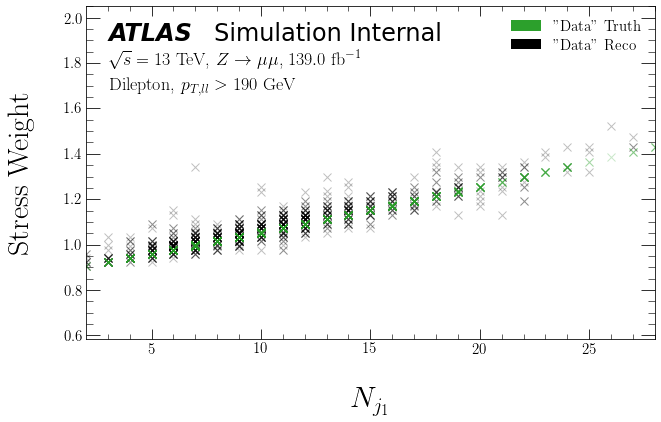

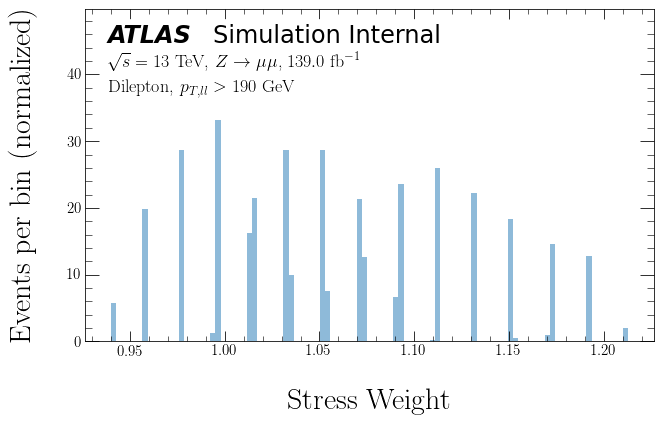

In [35]:
plot_weights_stress(weights_stress=weights_stress,
                    data_truth=data_truth,
                    data_reco=data_reco,
                    x_label=x_label,
                    save_label=save_label)

plot_weights_stress_hist(weights_stress=weights_stress,
                    save_label=save_label)

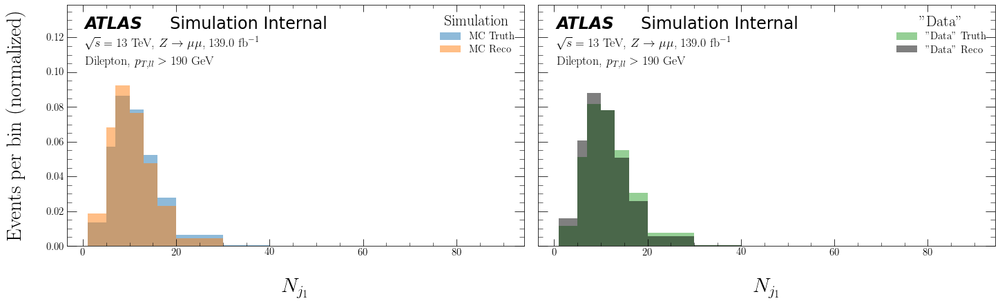

In [36]:
plot_distributions(sim_truth=sim_truth,
                   sim_reco=sim_reco,
                   sim_truth_weights_MC=sim_truth_weights_MC,
                   sim_reco_weights_MC=sim_reco_weights_MC,
                   data_truth=data_truth,
                   data_reco=data_reco,
                   data_truth_weights_MC=weights_stress,
                   data_reco_weights_MC=weights_stress,
                   bins=bins,
                   x_label=x_label,
                   save_label=save_label)

### Unfold 

In [37]:
# z-score standardization of data

sim_truth_z, sim_reco_z, data_reco_z = standardize(sim_truth, sim_reco,
                                                   data_reco)

In [38]:
weights, _ = unifold(iterations=10,
                     sim_truth=sim_truth_z,
                     sim_reco=sim_reco_z,
                     sim_truth_weights_MC=sim_truth_weights_MC,
                     sim_reco_weights_MC=sim_reco_weights_MC,
                     data_reco=data_reco_z,
                     data_reco_weights_MC=weights_stress,
                     verbose=1)


ITERATION: 1

STEP 1

Epoch 1/200
32/32 [==============================] - 0s 9ms/step - loss: 0.6928 - accuracy: 0.2592 - val_loss: 0.6928 - val_accuracy: 0.2634
Epoch 2/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6923 - accuracy: 0.2601 - val_loss: 0.6924 - val_accuracy: 0.2619
Epoch 3/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6921 - accuracy: 0.2595 - val_loss: 0.6923 - val_accuracy: 0.2614
Epoch 4/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6921 - accuracy: 0.2600 - val_loss: 0.6923 - val_accuracy: 0.2614
Epoch 5/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6920 - accuracy: 0.2600 - val_loss: 0.6924 - val_accuracy: 0.2603
Epoch 6/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6920 - accuracy: 0.2600 - val_loss: 0.6923 - val_accuracy: 0.2601
Epoch 7/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6921 - accuracy: 0.2602 - val_loss: 0.6924 - val_accurac

Epoch 4/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6921 - accuracy: 0.2500 - val_loss: 0.6924 - val_accuracy: 0.2501
Epoch 5/200
32/32 [==============================] - 0s 3ms/step - loss: 0.6921 - accuracy: 0.2500 - val_loss: 0.6925 - val_accuracy: 0.2501
Epoch 6/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6921 - accuracy: 0.2497 - val_loss: 0.6924 - val_accuracy: 0.2501
Epoch 7/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6921 - accuracy: 0.2499 - val_loss: 0.6924 - val_accuracy: 0.2501
Epoch 8/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6921 - accuracy: 0.2498 - val_loss: 0.6924 - val_accuracy: 0.2501
Epoch 9/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6921 - accuracy: 0.2498 - val_loss: 0.6924 - val_accuracy: 0.2501
Epoch 10/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6921 - accuracy: 0.2499 - val_loss: 0.6924 - val_accuracy: 0.2506
Epoch 11/200

Epoch 2/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6934 - accuracy: 0.2644 - val_loss: 0.6926 - val_accuracy: 0.2638
Epoch 3/200
32/32 [==============================] - 0s 3ms/step - loss: 0.6934 - accuracy: 0.2639 - val_loss: 0.6926 - val_accuracy: 0.2639
Epoch 4/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6934 - accuracy: 0.2645 - val_loss: 0.6926 - val_accuracy: 0.2640
Epoch 5/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6934 - accuracy: 0.2643 - val_loss: 0.6926 - val_accuracy: 0.2640
Epoch 6/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6934 - accuracy: 0.2646 - val_loss: 0.6926 - val_accuracy: 0.2640
Epoch 7/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6934 - accuracy: 0.2645 - val_loss: 0.6926 - val_accuracy: 0.2640
Epoch 8/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6934 - accuracy: 0.2645 - val_loss: 0.6926 - val_accuracy: 0.2640
Epoch 9/200
3

#### Results

ITERATION 1:


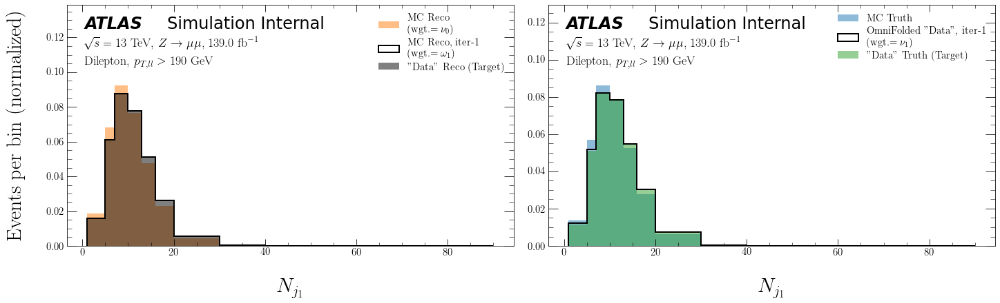

ITERATION 2:


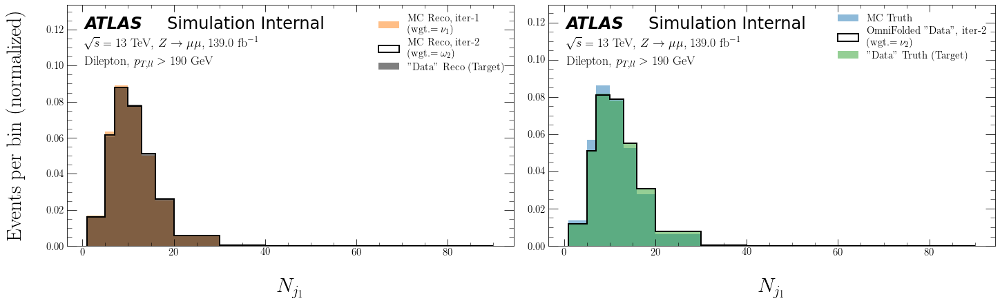

ITERATION 3:


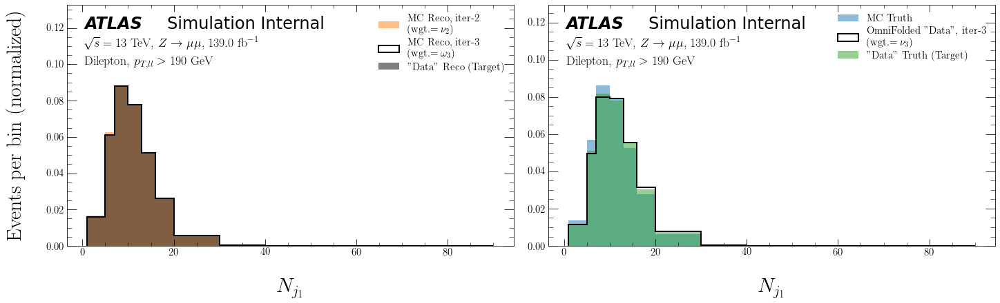

ITERATION 4:


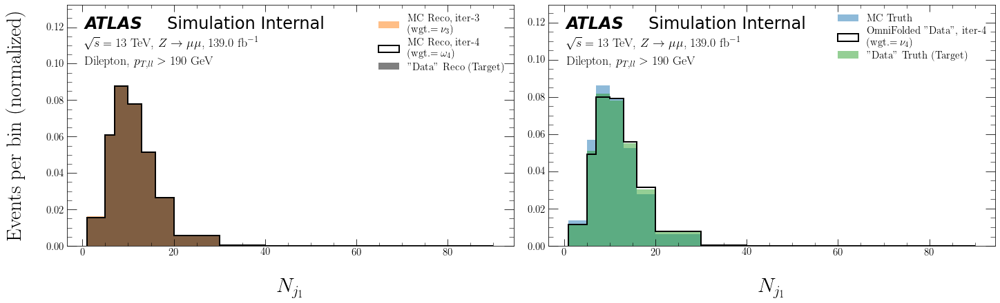

ITERATION 5:


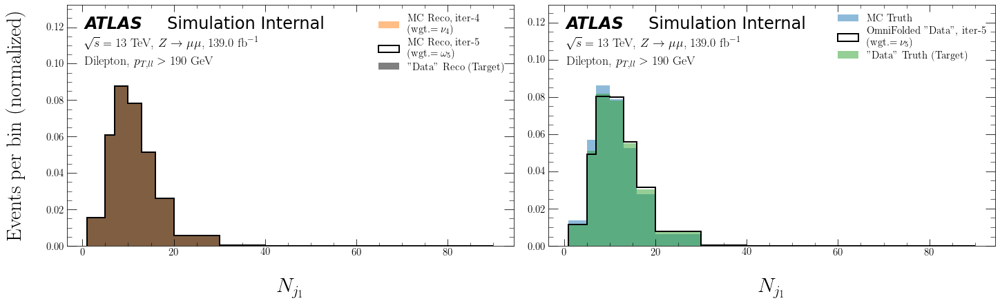

ITERATION 6:


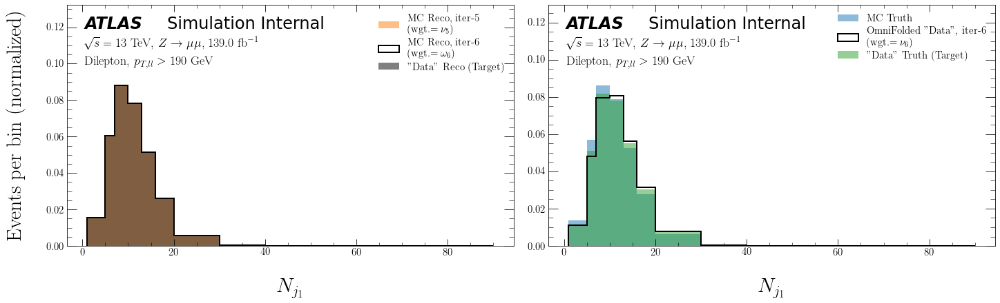

ITERATION 7:


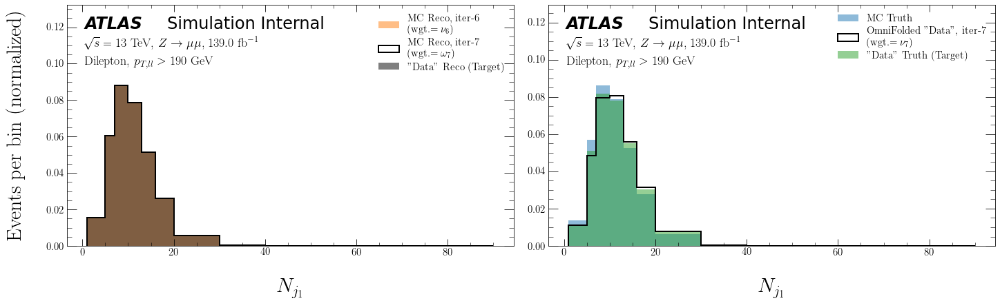

ITERATION 8:


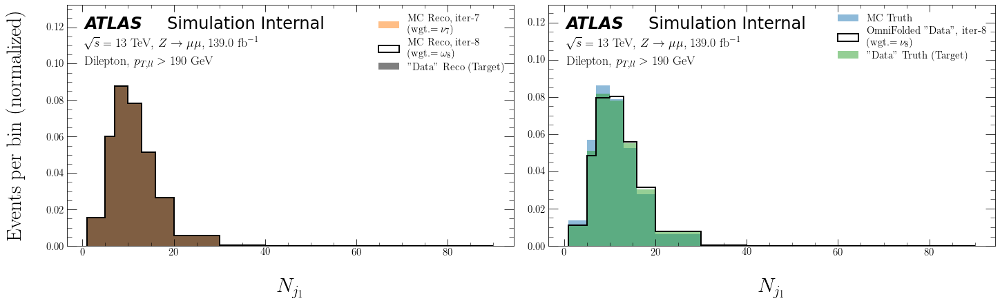

ITERATION 9:


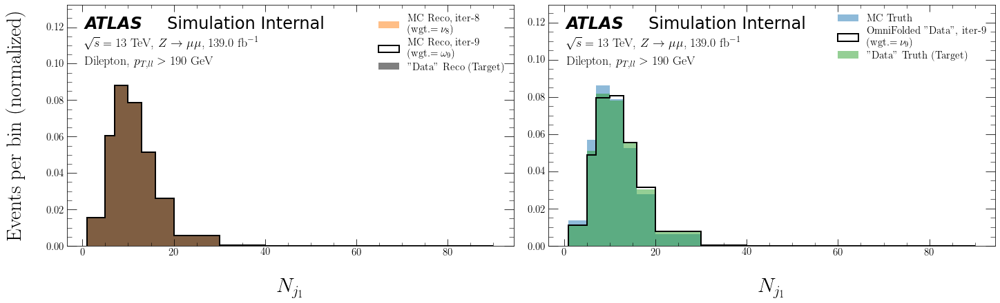

ITERATION 10:


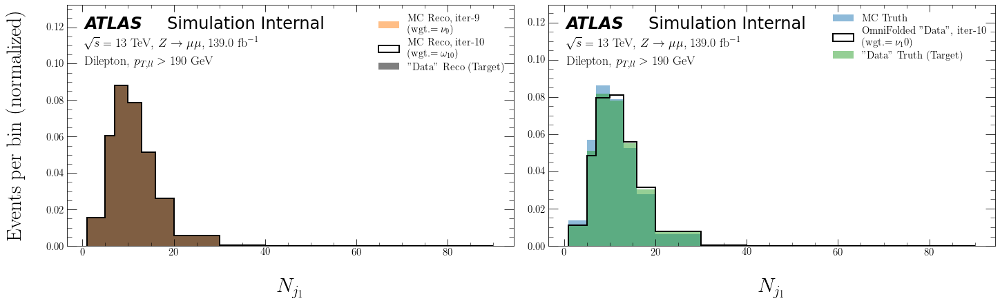

In [39]:
plot_results(sim_truth=sim_truth,
             sim_reco=sim_reco,
             sim_truth_weights_MC=sim_truth_weights_MC,
             sim_reco_weights_MC=sim_reco_weights_MC,
             data_truth=data_truth,
             data_reco=data_reco,
             data_truth_weights_MC=weights_stress,
             data_reco_weights_MC=weights_stress,
             weights=weights,
             bins=bins,
             x_label=x_label,
             save_label=save_label)

## Unfold $m_{j_1}$

In [40]:
K.clear_session()

In [41]:
obs_index = 2  # index for this observable

bins = obs[obs_index]['bins']
x_label = obs[obs_index]['plot_label']
file_label = obs[obs_index]['file_label']
save_label = plot_dir + 'UniFold/' + file_label + '/' + save_label0 + '-UniFold-' + file_label

### Setup Datasets

In [42]:
truth = np.array(Events['truth_' +
                                   file_label][mypass].to_list())
truth[mycut_truth] = -99
reco = np.array(Events[file_label][mypass].to_list())
reco[mycut_reco] = -99

In [43]:
sim_truth, data_truth, sim_reco, data_reco, sim_truth_weights_MC, data_truth_weights_MC, sim_reco_weights_MC, data_reco_weights_MC = train_test_split(
    truth,
    reco,
    truth_weights_MC,
    reco_weights_MC,
    test_size=0.5)

In [44]:
weights_stress = get_weights_stress(sim_truth, data_truth, data_truth_weights_MC)

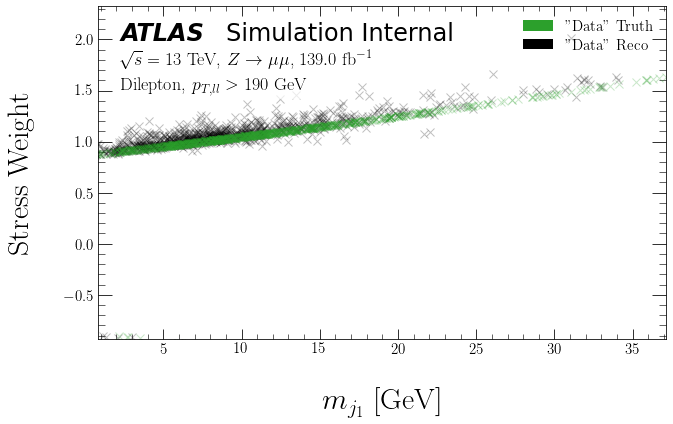

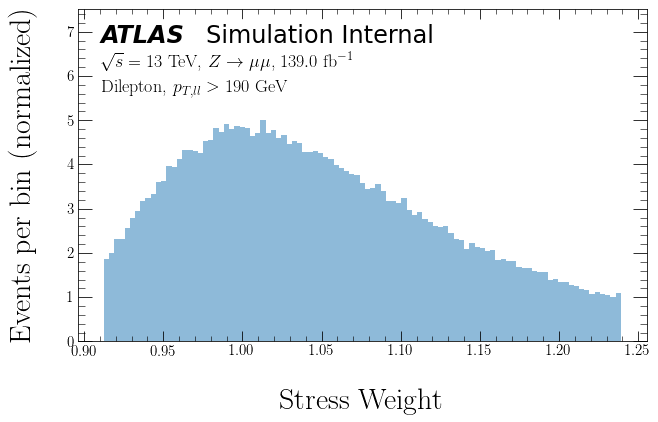

In [45]:
plot_weights_stress(weights_stress=weights_stress,
                    data_truth=data_truth,
                    data_reco=data_reco,
                    x_label=x_label,
                    save_label=save_label)

plot_weights_stress_hist(weights_stress=weights_stress,
                    save_label=save_label)

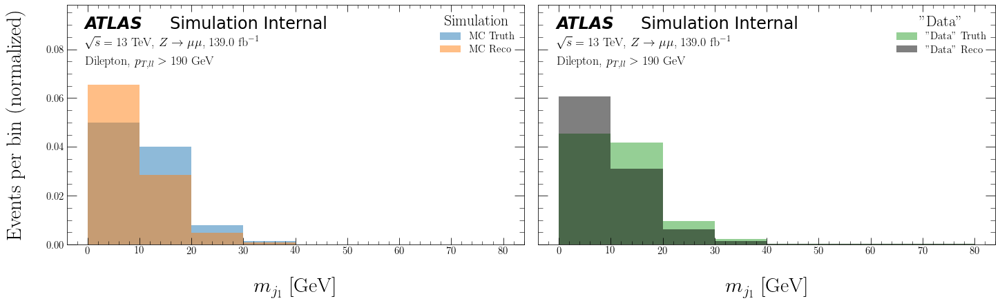

In [46]:
plot_distributions(sim_truth=sim_truth,
                   sim_reco=sim_reco,
                   sim_truth_weights_MC=sim_truth_weights_MC,
                   sim_reco_weights_MC=sim_reco_weights_MC,
                   data_truth=data_truth,
                   data_reco=data_reco,
                   data_truth_weights_MC=weights_stress,
                   data_reco_weights_MC=weights_stress,
                   bins=bins,
                   x_label=x_label,
                   save_label=save_label)

### Unfold 

In [47]:
# z-score standardization of data

sim_truth_z, sim_reco_z, data_reco_z = standardize(sim_truth, sim_reco,
                                                   data_reco)

In [48]:
weights, _ = unifold(iterations=10,
                     sim_truth=sim_truth_z,
                     sim_reco=sim_reco_z,
                     sim_truth_weights_MC=sim_truth_weights_MC,
                     sim_reco_weights_MC=sim_reco_weights_MC,
                     data_reco=data_reco_z,
                     data_reco_weights_MC=weights_stress,
                     verbose=1)


ITERATION: 1

STEP 1

Epoch 1/200
32/32 [==============================] - 0s 7ms/step - loss: 0.6928 - accuracy: 0.2542 - val_loss: 0.6938 - val_accuracy: 0.2640
Epoch 2/200
32/32 [==============================] - 0s 3ms/step - loss: 0.6918 - accuracy: 0.2605 - val_loss: 0.6928 - val_accuracy: 0.2628
Epoch 3/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6912 - accuracy: 0.2604 - val_loss: 0.6924 - val_accuracy: 0.2617
Epoch 4/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6910 - accuracy: 0.2607 - val_loss: 0.6924 - val_accuracy: 0.2631
Epoch 5/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6910 - accuracy: 0.2604 - val_loss: 0.6923 - val_accuracy: 0.2622
Epoch 6/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6910 - accuracy: 0.2604 - val_loss: 0.6923 - val_accuracy: 0.2634
Epoch 7/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6910 - accuracy: 0.2608 - val_loss: 0.6924 - val_accurac

32/32 [==============================] - 0s 5ms/step - loss: 0.6926 - accuracy: 0.2623 - val_loss: 0.6941 - val_accuracy: 0.2590
Epoch 7/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6926 - accuracy: 0.2622 - val_loss: 0.6941 - val_accuracy: 0.2638
Epoch 8/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6926 - accuracy: 0.2614 - val_loss: 0.6941 - val_accuracy: 0.2644
Epoch 9/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6926 - accuracy: 0.2627 - val_loss: 0.6941 - val_accuracy: 0.2646
Epoch 10/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6926 - accuracy: 0.2627 - val_loss: 0.6941 - val_accuracy: 0.2594
Epoch 11/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6926 - accuracy: 0.2615 - val_loss: 0.6941 - val_accuracy: 0.2615
Epoch 00011: early stopping

STEP 2

Epoch 1/200
32/32 [==============================] - 0s 6ms/step - loss: 0.6907 - accuracy: 0.2503 - val_loss: 0.6909 - val_acc

Epoch 9/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6932 - accuracy: 0.2630 - val_loss: 0.6927 - val_accuracy: 0.2649
Epoch 10/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6932 - accuracy: 0.2633 - val_loss: 0.6928 - val_accuracy: 0.2649
Epoch 11/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6932 - accuracy: 0.2642 - val_loss: 0.6927 - val_accuracy: 0.2557
Epoch 12/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6932 - accuracy: 0.2616 - val_loss: 0.6928 - val_accuracy: 0.2649
Epoch 13/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6932 - accuracy: 0.2625 - val_loss: 0.6928 - val_accuracy: 0.2649
Epoch 14/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6932 - accuracy: 0.2626 - val_loss: 0.6928 - val_accuracy: 0.2649
Epoch 15/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6932 - accuracy: 0.2612 - val_loss: 0.6928 - val_accuracy: 0.2649
Epoch 1

Epoch 1/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6936 - accuracy: 0.2607 - val_loss: 0.6937 - val_accuracy: 0.2641
Epoch 2/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6929 - accuracy: 0.2640 - val_loss: 0.6936 - val_accuracy: 0.2641
Epoch 3/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6929 - accuracy: 0.2654 - val_loss: 0.6936 - val_accuracy: 0.2642
Epoch 4/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6929 - accuracy: 0.2654 - val_loss: 0.6936 - val_accuracy: 0.2641
Epoch 5/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6929 - accuracy: 0.2654 - val_loss: 0.6936 - val_accuracy: 0.2641
Epoch 6/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6929 - accuracy: 0.2653 - val_loss: 0.6936 - val_accuracy: 0.2640
Epoch 7/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6929 - accuracy: 0.2653 - val_loss: 0.6936 - val_accuracy: 0.2643
Epoch 8/200
3

#### Results

ITERATION 1:


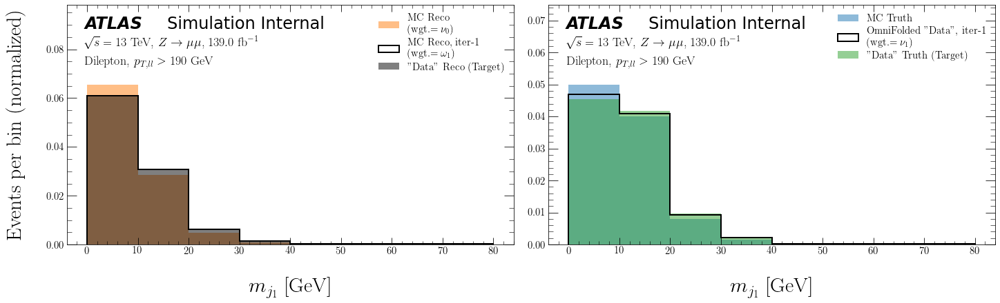

ITERATION 2:


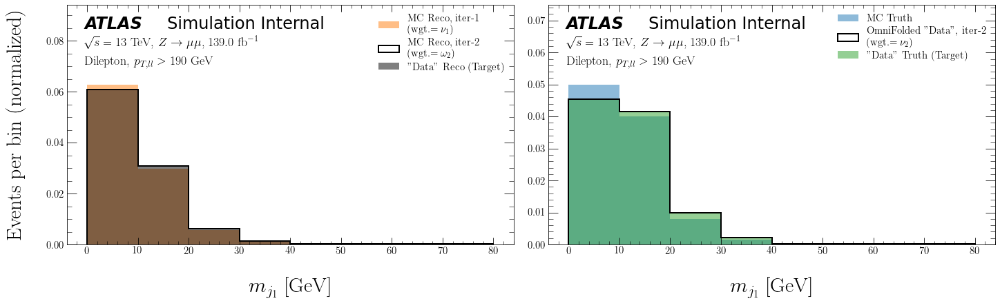

ITERATION 3:


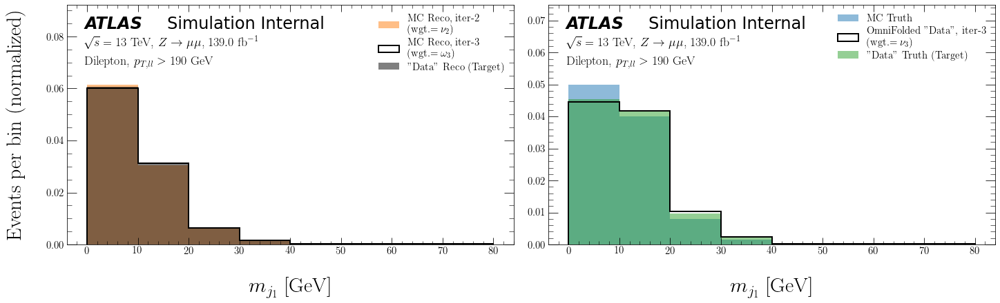

ITERATION 4:


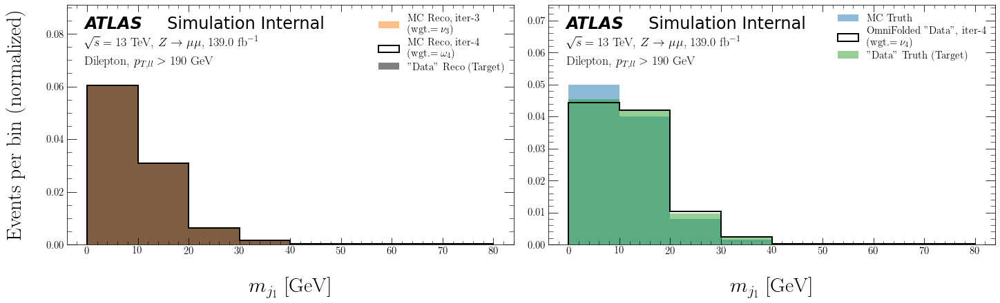

ITERATION 5:


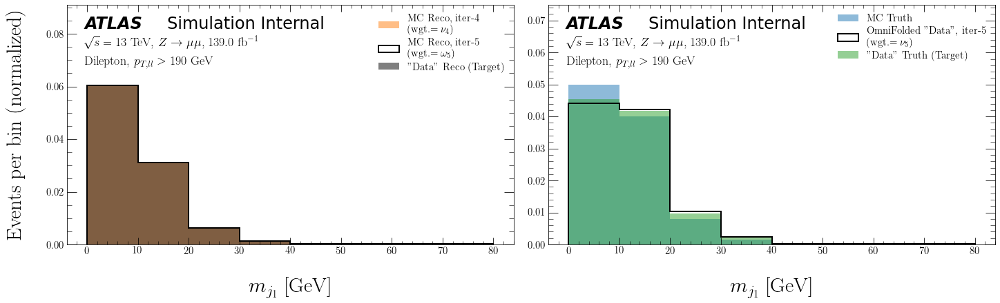

ITERATION 6:


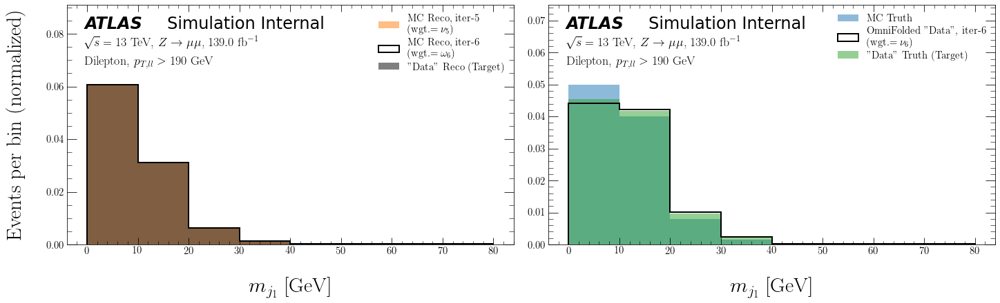

ITERATION 7:


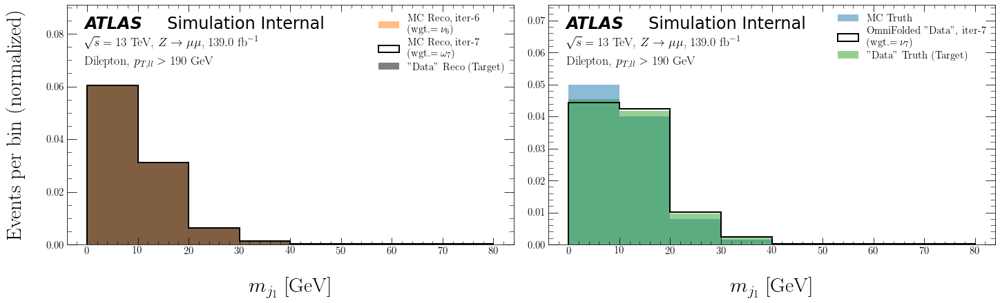

ITERATION 8:


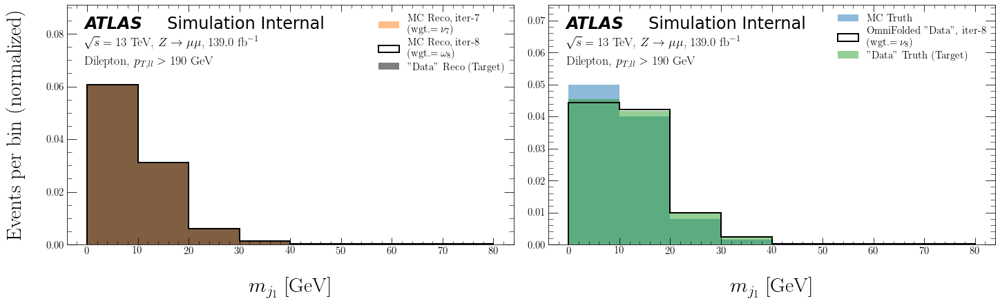

ITERATION 9:


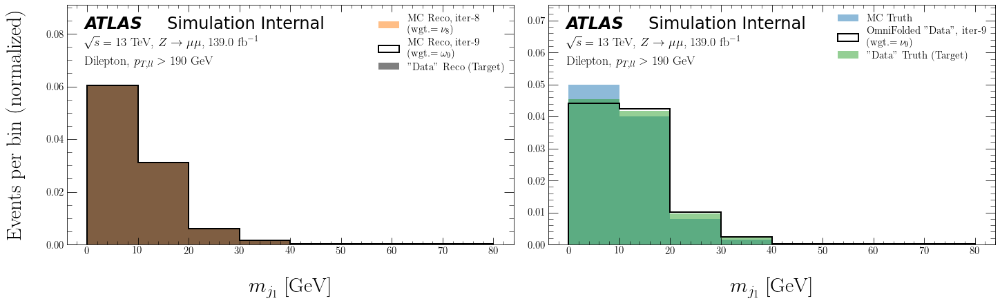

ITERATION 10:


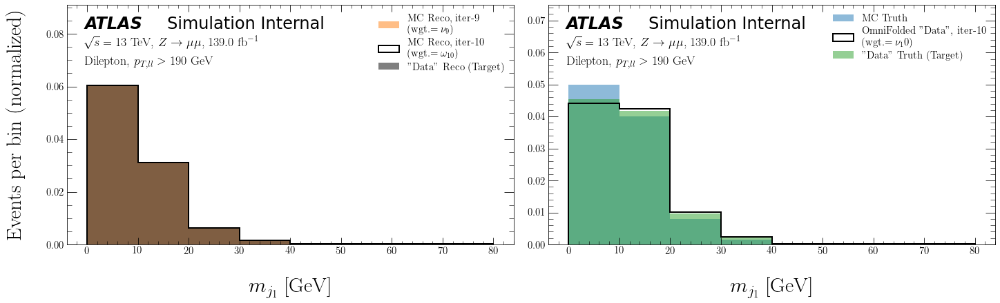

In [49]:
plot_results(sim_truth=sim_truth,
             sim_reco=sim_reco,
             sim_truth_weights_MC=sim_truth_weights_MC,
             sim_reco_weights_MC=sim_reco_weights_MC,
             data_truth=data_truth,
             data_reco=data_reco,
             data_truth_weights_MC=weights_stress,
             data_reco_weights_MC=weights_stress,
             weights=weights,
             bins=bins,
             x_label=x_label,
             save_label=save_label)

## Unfold $p_{T, j_1}$

In [50]:
K.clear_session()

In [51]:
obs_index = 4  # index for this observable

bins = obs[obs_index]['bins']
x_label = obs[obs_index]['plot_label']
file_label = obs[obs_index]['file_label']
save_label = plot_dir + 'UniFold/' + file_label + '/' + save_label0 + '-UniFold-' + file_label

### Setup Datasets

In [52]:
truth = np.array(Events['truth_' +
                                   file_label][mypass].to_list())
truth[mycut_truth] = -99
reco = np.array(Events[file_label][mypass].to_list())
reco[mycut_reco] = -99

In [53]:
sim_truth, data_truth, sim_reco, data_reco, sim_truth_weights_MC, data_truth_weights_MC, sim_reco_weights_MC, data_reco_weights_MC = train_test_split(
    truth,
    reco,
    truth_weights_MC,
    reco_weights_MC,
    test_size=0.5)

In [54]:
weights_stress = get_weights_stress(sim_truth, data_truth, data_truth_weights_MC)

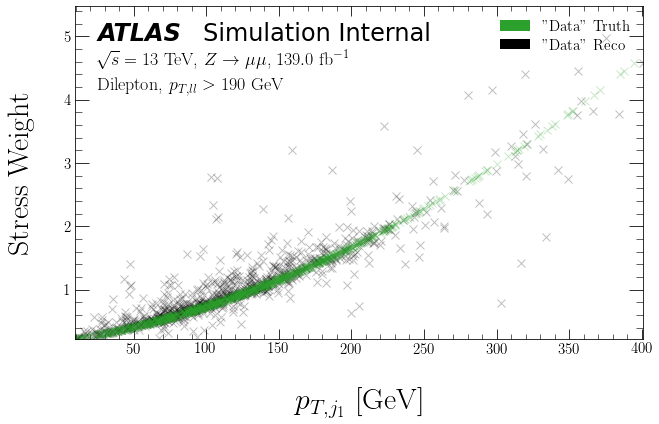

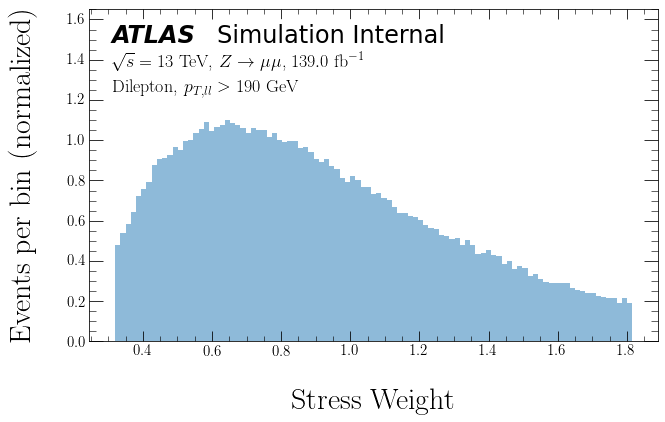

In [55]:
plot_weights_stress(weights_stress=weights_stress,
                    data_truth=data_truth,
                    data_reco=data_reco,
                    x_label=x_label,
                    save_label=save_label)

plot_weights_stress_hist(weights_stress=weights_stress,
                    save_label=save_label)

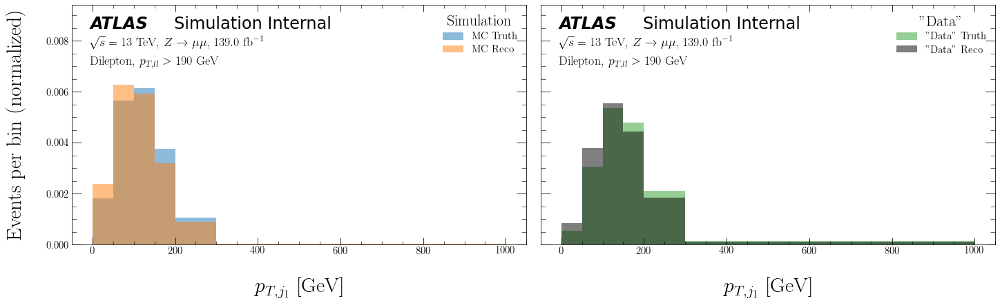

In [56]:
plot_distributions(sim_truth=sim_truth,
                   sim_reco=sim_reco,
                   sim_truth_weights_MC=sim_truth_weights_MC,
                   sim_reco_weights_MC=sim_reco_weights_MC,
                   data_truth=data_truth,
                   data_reco=data_reco,
                   data_truth_weights_MC=weights_stress,
                   data_reco_weights_MC=weights_stress,
                   bins=bins,
                   x_label=x_label,
                   save_label=save_label)

### Unfold 

In [57]:
# z-score standardization of data

sim_truth_z, sim_reco_z, data_reco_z = standardize(sim_truth, sim_reco,
                                                   data_reco)

In [58]:
weights, _ = unifold(iterations=10,
                     sim_truth=sim_truth_z,
                     sim_reco=sim_reco_z,
                     sim_truth_weights_MC=sim_truth_weights_MC,
                     sim_reco_weights_MC=sim_reco_weights_MC,
                     data_reco=data_reco_z,
                     data_reco_weights_MC=weights_stress,
                     verbose=1)


ITERATION: 1

STEP 1

Epoch 1/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6907 - accuracy: 0.2603 - val_loss: 0.6861 - val_accuracy: 0.2626
Epoch 2/200
32/32 [==============================] - 0s 3ms/step - loss: 0.6814 - accuracy: 0.2630 - val_loss: 0.6751 - val_accuracy: 0.2613
Epoch 3/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6711 - accuracy: 0.2629 - val_loss: 0.6687 - val_accuracy: 0.2619
Epoch 4/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6661 - accuracy: 0.2631 - val_loss: 0.6647 - val_accuracy: 0.2621
Epoch 5/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6626 - accuracy: 0.2629 - val_loss: 0.6629 - val_accuracy: 0.2618
Epoch 6/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6614 - accuracy: 0.2628 - val_loss: 0.6617 - val_accuracy: 0.2618
Epoch 7/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6607 - accuracy: 0.2628 - val_loss: 0.6619 - val_accurac

32/32 [==============================] - 0s 5ms/step - loss: 0.6898 - accuracy: 0.2622 - val_loss: 0.6887 - val_accuracy: 0.2616
Epoch 44/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6895 - accuracy: 0.2625 - val_loss: 0.6886 - val_accuracy: 0.2628
Epoch 45/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6895 - accuracy: 0.2624 - val_loss: 0.6884 - val_accuracy: 0.2635
Epoch 46/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6894 - accuracy: 0.2616 - val_loss: 0.6885 - val_accuracy: 0.2642
Epoch 47/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6895 - accuracy: 0.2621 - val_loss: 0.6886 - val_accuracy: 0.2645
Epoch 48/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6895 - accuracy: 0.2618 - val_loss: 0.6883 - val_accuracy: 0.2622
Epoch 49/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6895 - accuracy: 0.2619 - val_loss: 0.6888 - val_accuracy: 0.2605
Epoch 50/200
32/32 

32/32 [==============================] - 0s 4ms/step - loss: 0.6467 - accuracy: 0.2498 - val_loss: 0.6453 - val_accuracy: 0.2499
Epoch 16/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6468 - accuracy: 0.2500 - val_loss: 0.6453 - val_accuracy: 0.2500
Epoch 17/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6467 - accuracy: 0.2499 - val_loss: 0.6451 - val_accuracy: 0.2501
Epoch 18/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6467 - accuracy: 0.2499 - val_loss: 0.6453 - val_accuracy: 0.2499
Epoch 19/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6467 - accuracy: 0.2499 - val_loss: 0.6452 - val_accuracy: 0.2502
Epoch 20/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6467 - accuracy: 0.2499 - val_loss: 0.6451 - val_accuracy: 0.2501
Epoch 21/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6466 - accuracy: 0.2500 - val_loss: 0.6455 - val_accuracy: 0.2498
Epoch 22/200
32/32 

32/32 [==============================] - 0s 5ms/step - loss: 0.6923 - accuracy: 0.2568 - val_loss: 0.6904 - val_accuracy: 0.2650
Epoch 16/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6922 - accuracy: 0.2593 - val_loss: 0.6906 - val_accuracy: 0.2590
Epoch 17/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6922 - accuracy: 0.2582 - val_loss: 0.6905 - val_accuracy: 0.2652
Epoch 18/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6923 - accuracy: 0.2584 - val_loss: 0.6904 - val_accuracy: 0.2610
Epoch 19/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6922 - accuracy: 0.2582 - val_loss: 0.6905 - val_accuracy: 0.2576
Epoch 00019: early stopping

STEP 2

Epoch 1/200
32/32 [==============================] - 0s 8ms/step - loss: 0.6476 - accuracy: 0.2498 - val_loss: 0.6433 - val_accuracy: 0.2512
Epoch 2/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6437 - accuracy: 0.2496 - val_loss: 0.6432 - val_a

32/32 [==============================] - 0s 4ms/step - loss: 0.6433 - accuracy: 0.2497 - val_loss: 0.6428 - val_accuracy: 0.2508
Epoch 10/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6433 - accuracy: 0.2497 - val_loss: 0.6428 - val_accuracy: 0.2507
Epoch 11/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6433 - accuracy: 0.2498 - val_loss: 0.6428 - val_accuracy: 0.2508
Epoch 12/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6433 - accuracy: 0.2498 - val_loss: 0.6429 - val_accuracy: 0.2508
Epoch 13/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6433 - accuracy: 0.2498 - val_loss: 0.6428 - val_accuracy: 0.2508
Epoch 14/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6432 - accuracy: 0.2497 - val_loss: 0.6428 - val_accuracy: 0.2509
Epoch 15/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6433 - accuracy: 0.2498 - val_loss: 0.6428 - val_accuracy: 0.2507
Epoch 16/200
32/32 

32/32 [==============================] - 0s 4ms/step - loss: 0.6436 - accuracy: 0.2501 - val_loss: 0.6433 - val_accuracy: 0.2495
Epoch 31/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6436 - accuracy: 0.2502 - val_loss: 0.6433 - val_accuracy: 0.2498
Epoch 32/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6436 - accuracy: 0.2501 - val_loss: 0.6433 - val_accuracy: 0.2496
Epoch 33/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6436 - accuracy: 0.2501 - val_loss: 0.6433 - val_accuracy: 0.2498
Epoch 34/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6437 - accuracy: 0.2502 - val_loss: 0.6434 - val_accuracy: 0.2498
Epoch 35/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6436 - accuracy: 0.2501 - val_loss: 0.6434 - val_accuracy: 0.2497
Epoch 00035: early stopping


#### Results

ITERATION 1:


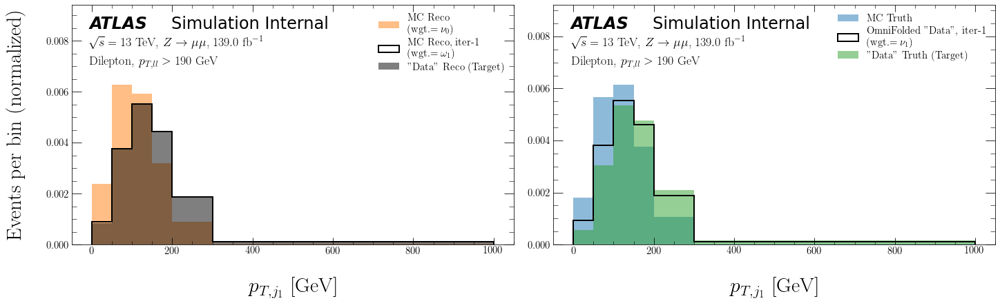

ITERATION 2:


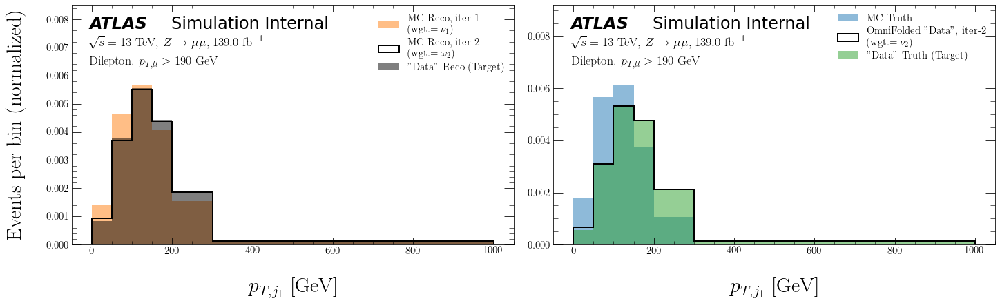

ITERATION 3:


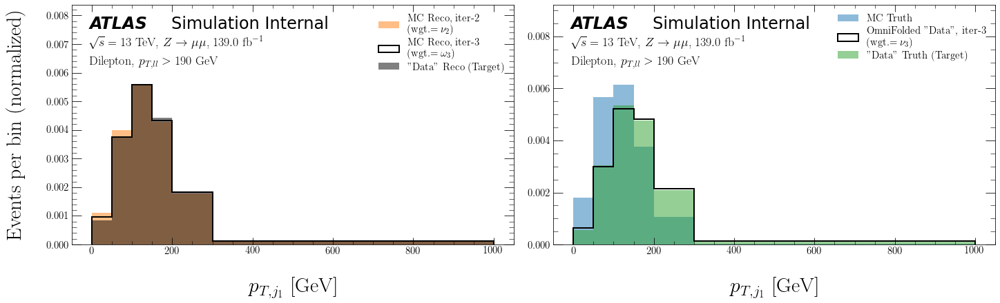

ITERATION 4:


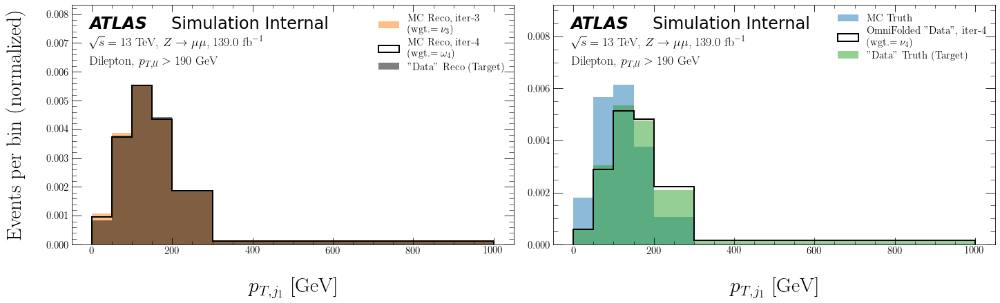

ITERATION 5:


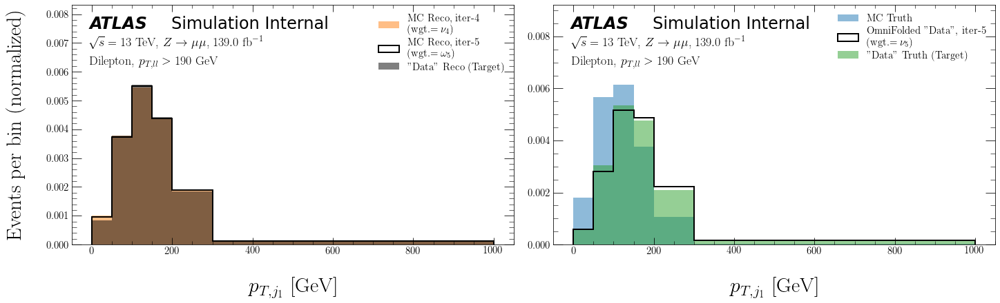

ITERATION 6:


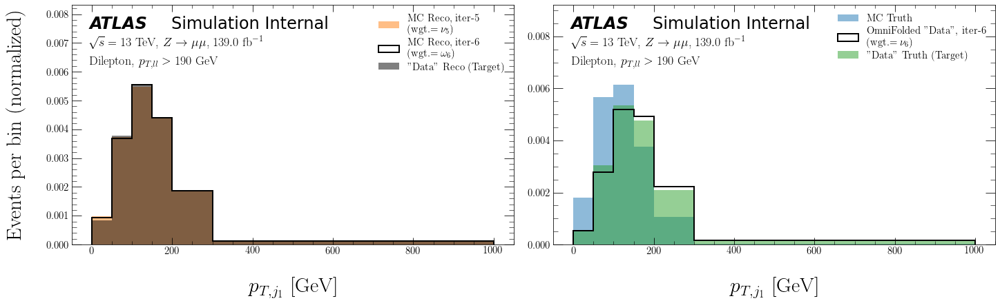

ITERATION 7:


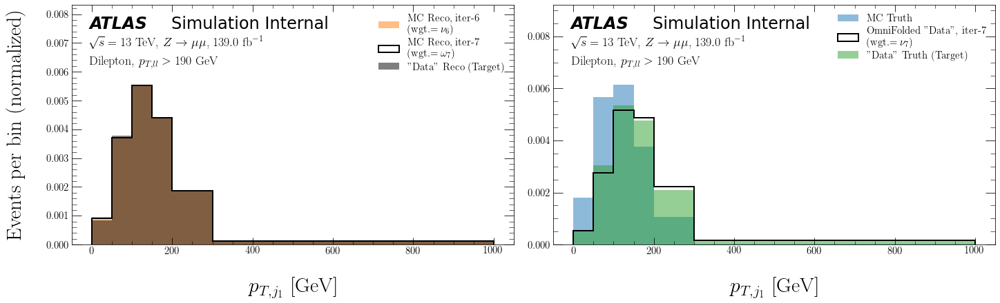

ITERATION 8:


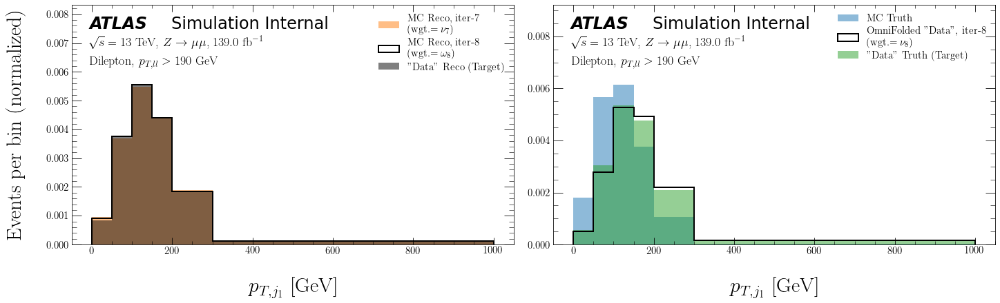

ITERATION 9:


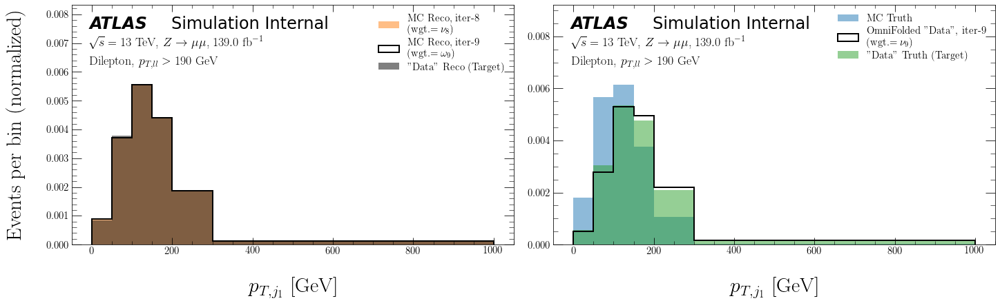

ITERATION 10:


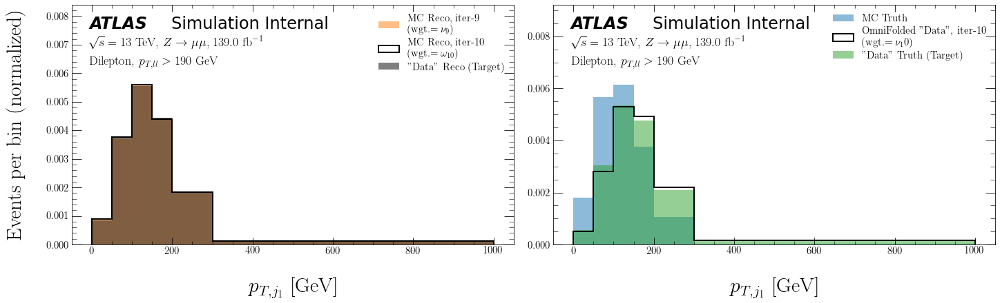

In [59]:
plot_results(sim_truth=sim_truth,
             sim_reco=sim_reco,
             sim_truth_weights_MC=sim_truth_weights_MC,
             sim_reco_weights_MC=sim_reco_weights_MC,
             data_truth=data_truth,
             data_reco=data_reco,
             data_truth_weights_MC=weights_stress,
             data_reco_weights_MC=weights_stress,
             weights=weights,
             bins=bins,
             x_label=x_label,
             save_label=save_label)

## Unfold $y_{j_1}$

In [60]:
K.clear_session()

In [61]:
obs_index = 6  # index for this observable

bins = obs[obs_index]['bins']
x_label = obs[obs_index]['plot_label']
file_label = obs[obs_index]['file_label']
save_label = plot_dir + 'UniFold/' + file_label + '/' + save_label0 + '-UniFold-' + file_label

### Setup Datasets

In [62]:
truth = np.array(Events['truth_' +
                                   file_label][mypass].to_list())
truth[mycut_truth] = -99
reco = np.array(Events[file_label][mypass].to_list())
reco[mycut_reco] = -99

In [63]:
sim_truth, data_truth, sim_reco, data_reco, sim_truth_weights_MC, data_truth_weights_MC, sim_reco_weights_MC, data_reco_weights_MC = train_test_split(
    truth,
    reco,
    truth_weights_MC,
    reco_weights_MC,
    test_size=0.5)

In [64]:
weights_stress = get_weights_stress(sim_truth, data_truth, data_truth_weights_MC)

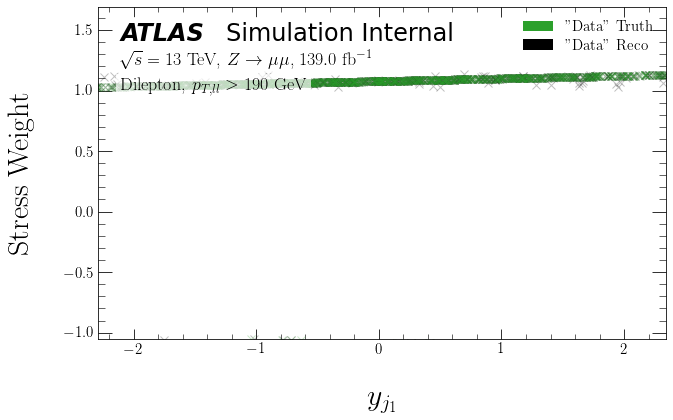

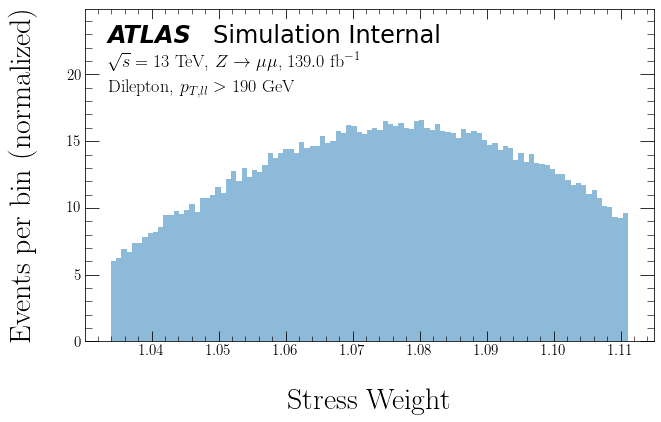

In [65]:
plot_weights_stress(weights_stress=weights_stress,
                    data_truth=data_truth,
                    data_reco=data_reco,
                    x_label=x_label,
                    save_label=save_label)

plot_weights_stress_hist(weights_stress=weights_stress,
                    save_label=save_label)

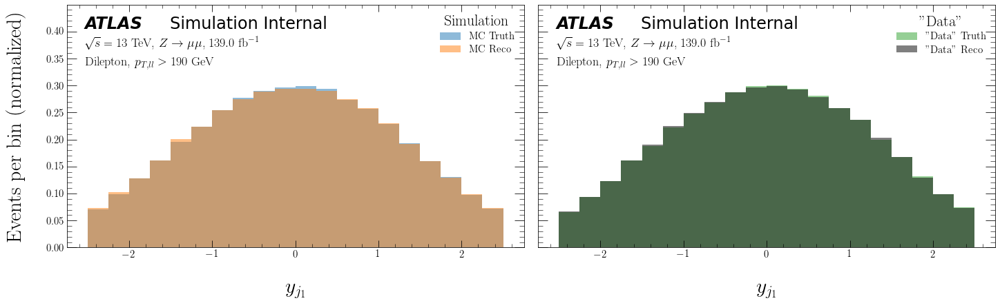

In [66]:
plot_distributions(sim_truth=sim_truth,
                   sim_reco=sim_reco,
                   sim_truth_weights_MC=sim_truth_weights_MC,
                   sim_reco_weights_MC=sim_reco_weights_MC,
                   data_truth=data_truth,
                   data_reco=data_reco,
                   data_truth_weights_MC=weights_stress,
                   data_reco_weights_MC=weights_stress,
                   bins=bins,
                   x_label=x_label,
                   save_label=save_label)

### Unfold 

In [67]:
# z-score standardization of data

sim_truth_z, sim_reco_z, data_reco_z = standardize(sim_truth, sim_reco,
                                                   data_reco)

In [68]:
weights, _ = unifold(iterations=10,
                     sim_truth=sim_truth_z,
                     sim_reco=sim_reco_z,
                     sim_truth_weights_MC=sim_truth_weights_MC,
                     sim_reco_weights_MC=sim_reco_weights_MC,
                     data_reco=data_reco_z,
                     data_reco_weights_MC=weights_stress,
                     verbose=1)


ITERATION: 1

STEP 1

Epoch 1/200
32/32 [==============================] - 0s 6ms/step - loss: 0.6930 - accuracy: 0.2639 - val_loss: 0.6935 - val_accuracy: 0.2649
Epoch 2/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6928 - accuracy: 0.2650 - val_loss: 0.6934 - val_accuracy: 0.2649
Epoch 3/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6928 - accuracy: 0.2652 - val_loss: 0.6934 - val_accuracy: 0.2649
Epoch 4/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6928 - accuracy: 0.2643 - val_loss: 0.6934 - val_accuracy: 0.2506
Epoch 5/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6928 - accuracy: 0.2632 - val_loss: 0.6934 - val_accuracy: 0.2649
Epoch 6/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6928 - accuracy: 0.2652 - val_loss: 0.6934 - val_accuracy: 0.2647
Epoch 7/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6928 - accuracy: 0.2652 - val_loss: 0.6934 - val_accurac

32/32 [==============================] - 0s 4ms/step - loss: 0.6932 - accuracy: 0.2500 - val_loss: 0.6924 - val_accuracy: 0.2488
Epoch 19/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6932 - accuracy: 0.2499 - val_loss: 0.6924 - val_accuracy: 0.2487
Epoch 20/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6932 - accuracy: 0.2505 - val_loss: 0.6924 - val_accuracy: 0.2500
Epoch 00020: early stopping

ITERATION: 3

STEP 1

Epoch 1/200
32/32 [==============================] - 0s 6ms/step - loss: 0.6928 - accuracy: 0.2560 - val_loss: 0.6936 - val_accuracy: 0.2644
Epoch 2/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6927 - accuracy: 0.2654 - val_loss: 0.6936 - val_accuracy: 0.2644
Epoch 3/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6927 - accuracy: 0.2654 - val_loss: 0.6936 - val_accuracy: 0.2644
Epoch 4/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6927 - accuracy: 0.2653 - val_loss: 0.

32/32 [==============================] - 0s 4ms/step - loss: 0.6929 - accuracy: 0.2646 - val_loss: 0.6929 - val_accuracy: 0.2641
Epoch 4/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6929 - accuracy: 0.2655 - val_loss: 0.6929 - val_accuracy: 0.2641
Epoch 5/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6929 - accuracy: 0.2655 - val_loss: 0.6929 - val_accuracy: 0.2641
Epoch 6/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6929 - accuracy: 0.2655 - val_loss: 0.6929 - val_accuracy: 0.2641
Epoch 7/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6929 - accuracy: 0.2655 - val_loss: 0.6929 - val_accuracy: 0.2641
Epoch 8/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6929 - accuracy: 0.2655 - val_loss: 0.6929 - val_accuracy: 0.2641
Epoch 9/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6929 - accuracy: 0.2655 - val_loss: 0.6929 - val_accuracy: 0.2640
Epoch 10/200
32/32 [=====

32/32 [==============================] - 0s 4ms/step - loss: 0.6930 - accuracy: 0.2502 - val_loss: 0.6928 - val_accuracy: 0.2497
Epoch 16/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6930 - accuracy: 0.2502 - val_loss: 0.6928 - val_accuracy: 0.2495
Epoch 17/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6930 - accuracy: 0.2499 - val_loss: 0.6928 - val_accuracy: 0.2490
Epoch 18/200
32/32 [==============================] - 0s 3ms/step - loss: 0.6930 - accuracy: 0.2500 - val_loss: 0.6928 - val_accuracy: 0.2494
Epoch 19/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6930 - accuracy: 0.2503 - val_loss: 0.6928 - val_accuracy: 0.2498
Epoch 20/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6930 - accuracy: 0.2501 - val_loss: 0.6928 - val_accuracy: 0.2497
Epoch 21/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6930 - accuracy: 0.2504 - val_loss: 0.6928 - val_accuracy: 0.2498
Epoch 00021: early 

32/32 [==============================] - 0s 5ms/step - loss: 0.6929 - accuracy: 0.2652 - val_loss: 0.6931 - val_accuracy: 0.2649
Epoch 16/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6929 - accuracy: 0.2652 - val_loss: 0.6931 - val_accuracy: 0.2644
Epoch 17/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6929 - accuracy: 0.2651 - val_loss: 0.6931 - val_accuracy: 0.2649
Epoch 18/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6929 - accuracy: 0.2650 - val_loss: 0.6931 - val_accuracy: 0.2649
Epoch 19/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6929 - accuracy: 0.2652 - val_loss: 0.6931 - val_accuracy: 0.2649
Epoch 00019: early stopping

STEP 2

Epoch 1/200
32/32 [==============================] - 0s 7ms/step - loss: 0.6932 - accuracy: 0.2502 - val_loss: 0.6924 - val_accuracy: 0.2497
Epoch 2/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6931 - accuracy: 0.2500 - val_loss: 0.6924 - val_a

Epoch 4/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6927 - accuracy: 0.2654 - val_loss: 0.6937 - val_accuracy: 0.2643
Epoch 5/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6927 - accuracy: 0.2642 - val_loss: 0.6937 - val_accuracy: 0.2643
Epoch 6/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6927 - accuracy: 0.2654 - val_loss: 0.6936 - val_accuracy: 0.2643
Epoch 7/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6927 - accuracy: 0.2654 - val_loss: 0.6936 - val_accuracy: 0.2643
Epoch 8/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6927 - accuracy: 0.2653 - val_loss: 0.6936 - val_accuracy: 0.2643
Epoch 9/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6927 - accuracy: 0.2654 - val_loss: 0.6936 - val_accuracy: 0.2643
Epoch 10/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6927 - accuracy: 0.2654 - val_loss: 0.6936 - val_accuracy: 0.2643
Epoch 11/200

#### Results

ITERATION 1:


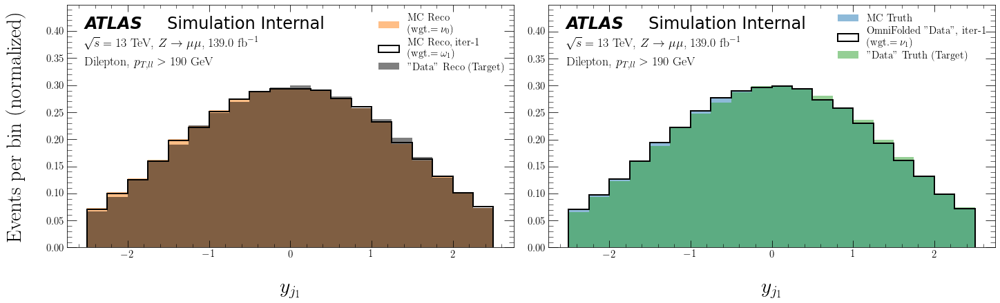

ITERATION 2:


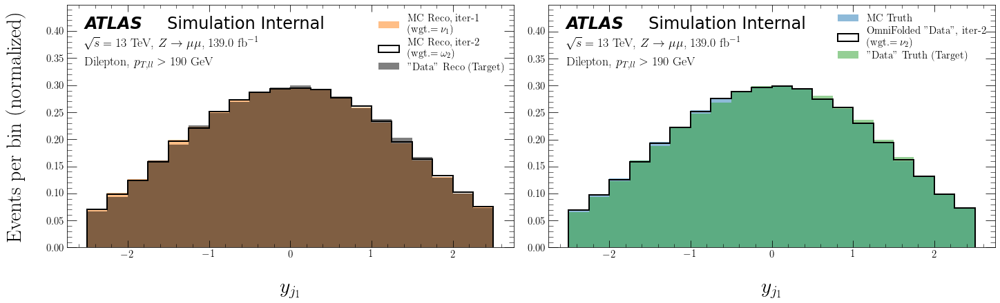

ITERATION 3:


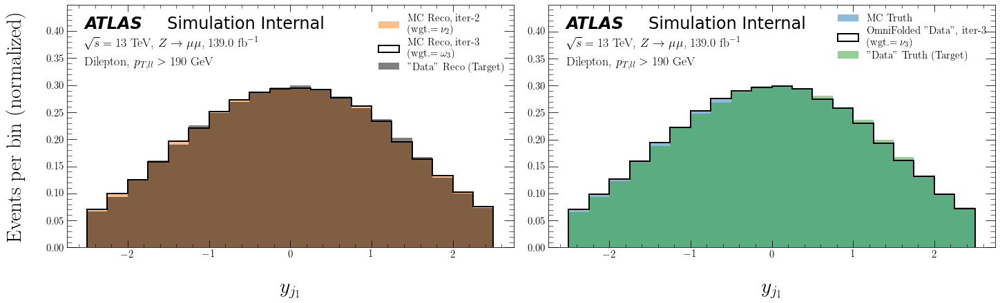

ITERATION 4:


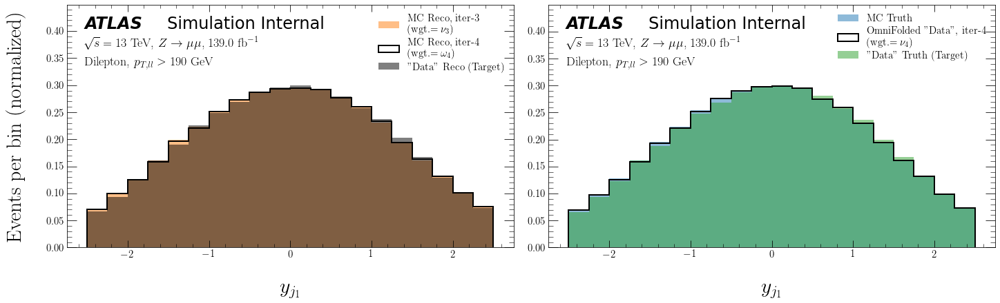

ITERATION 5:


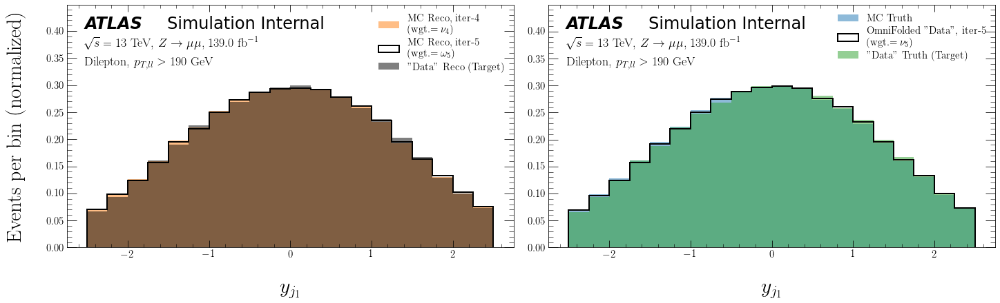

ITERATION 6:


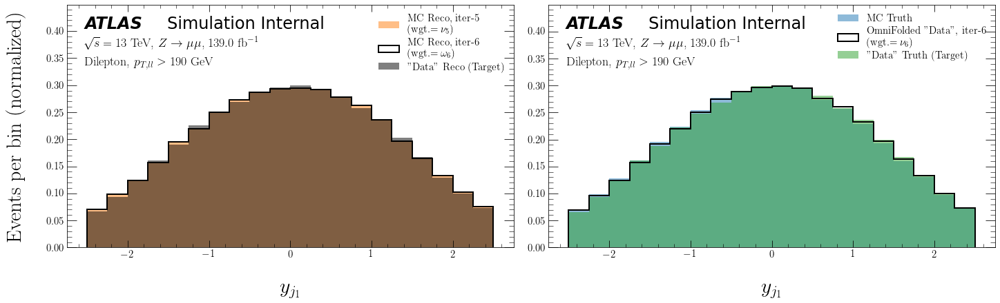

ITERATION 7:


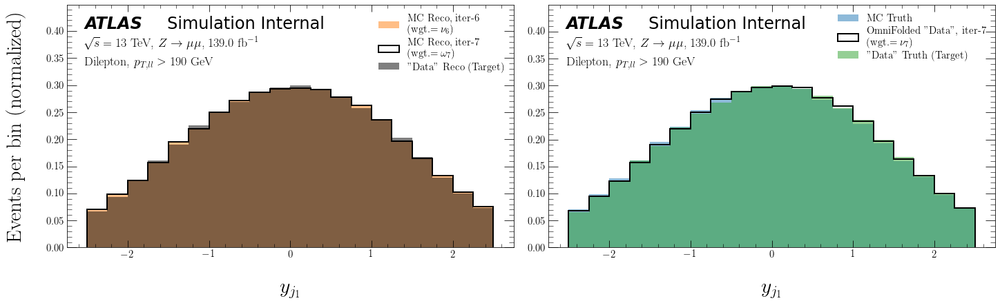

ITERATION 8:


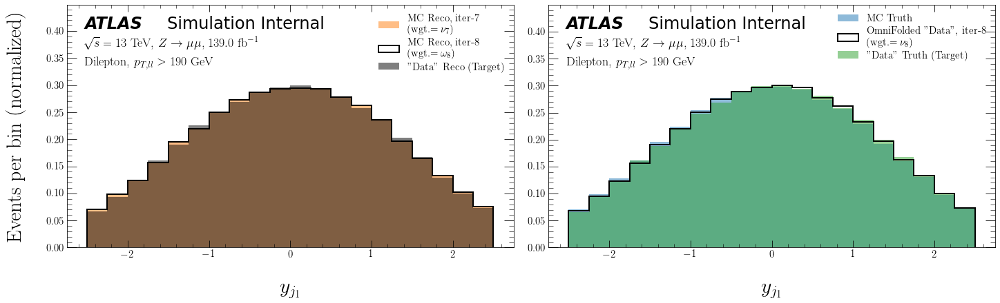

ITERATION 9:


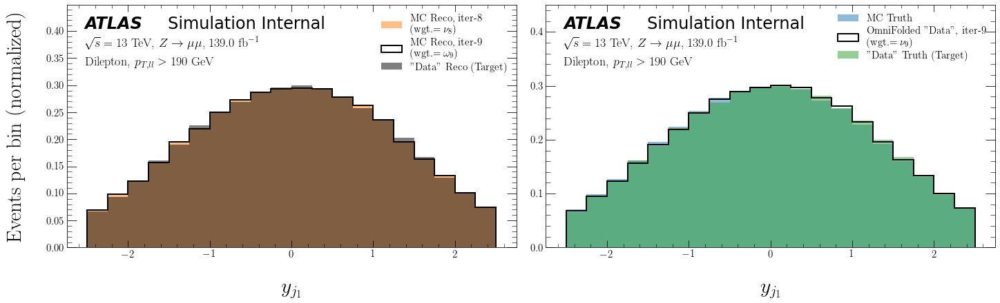

ITERATION 10:


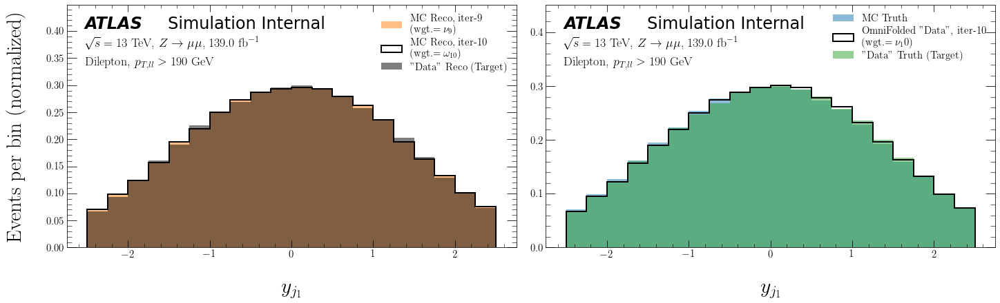

In [69]:
plot_results(sim_truth=sim_truth,
             sim_reco=sim_reco,
             sim_truth_weights_MC=sim_truth_weights_MC,
             sim_reco_weights_MC=sim_reco_weights_MC,
             data_truth=data_truth,
             data_reco=data_reco,
             data_truth_weights_MC=weights_stress,
             data_reco_weights_MC=weights_stress,
             weights=weights,
             bins=bins,
             x_label=x_label,
             save_label=save_label)

## Unfold $\tau _{j_1}$

In [70]:
K.clear_session()

In [71]:
obs_index = 10  # index for this observable

bins = obs[obs_index]['bins']
x_label = obs[obs_index]['plot_label']
file_label = obs[obs_index]['file_label']
save_label = plot_dir + 'UniFold/' + file_label + '/' + save_label0 + '-UniFold-' + file_label

### Setup Datasets

In [72]:
truth = np.array(Events['truth_' +
                                   file_label][mypass].to_list())
truth[mycut_truth] = -99
reco = np.array(Events[file_label][mypass].to_list())
reco[mycut_reco] = -99

In [73]:
sim_truth, data_truth, sim_reco, data_reco, sim_truth_weights_MC, data_truth_weights_MC, sim_reco_weights_MC, data_reco_weights_MC = train_test_split(
    truth,
    reco,
    truth_weights_MC,
    reco_weights_MC,
    test_size=0.5)

In [74]:
weights_stress = get_weights_stress(sim_truth, data_truth, data_truth_weights_MC, degree=10)

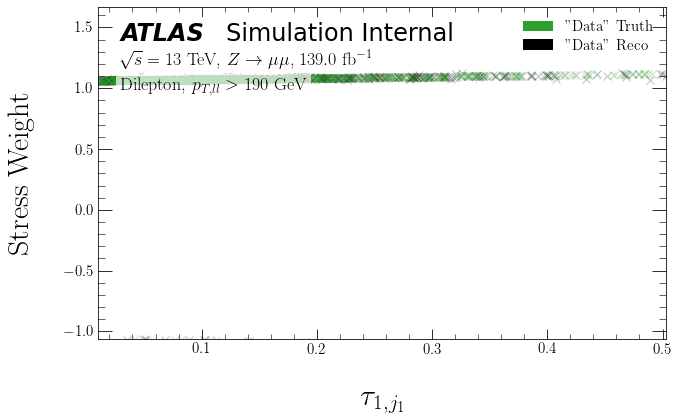

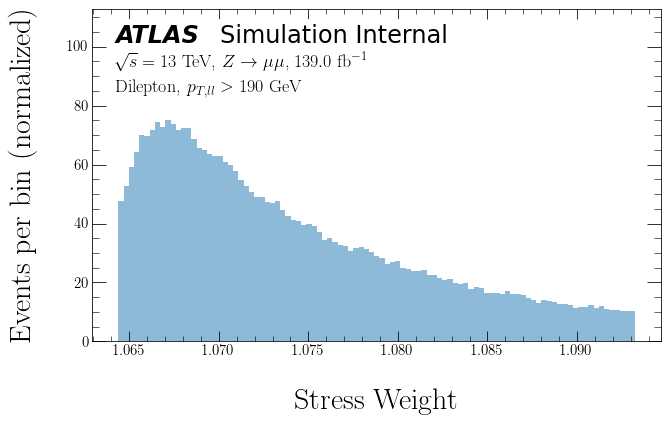

In [75]:
plot_weights_stress(weights_stress=weights_stress,
                    data_truth=data_truth,
                    data_reco=data_reco,
                    x_label=x_label,
                    save_label=save_label)

plot_weights_stress_hist(weights_stress=weights_stress,
                    save_label=save_label)

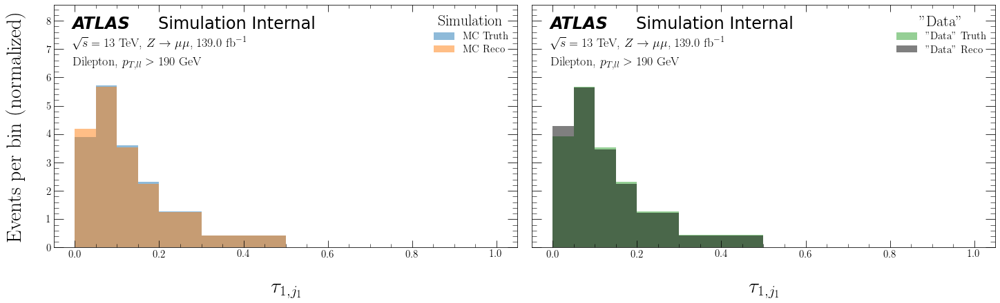

In [76]:
plot_distributions(sim_truth=sim_truth,
                   sim_reco=sim_reco,
                   sim_truth_weights_MC=sim_truth_weights_MC,
                   sim_reco_weights_MC=sim_reco_weights_MC,
                   data_truth=data_truth,
                   data_reco=data_reco,
                   data_truth_weights_MC=weights_stress,
                   data_reco_weights_MC=weights_stress,
                   bins=bins,
                   x_label=x_label,
                   save_label=save_label)

## Unfold 

In [77]:
# z-score standardization of data

sim_truth_z, sim_reco_z, data_reco_z = standardize(sim_truth, sim_reco,
                                                   data_reco)

In [78]:
weights, _ = unifold(iterations=10,
                     sim_truth=sim_truth_z,
                     sim_reco=sim_reco_z,
                     sim_truth_weights_MC=sim_truth_weights_MC,
                     sim_reco_weights_MC=sim_reco_weights_MC,
                     data_reco=data_reco_z,
                     data_reco_weights_MC=weights_stress,
                     verbose=1)


ITERATION: 1

STEP 1

Epoch 1/200
32/32 [==============================] - 0s 9ms/step - loss: 0.6928 - accuracy: 0.2625 - val_loss: 0.6931 - val_accuracy: 0.2650
Epoch 2/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6928 - accuracy: 0.2599 - val_loss: 0.6931 - val_accuracy: 0.2650
Epoch 3/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6928 - accuracy: 0.2642 - val_loss: 0.6931 - val_accuracy: 0.2650
Epoch 4/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6928 - accuracy: 0.2603 - val_loss: 0.6932 - val_accuracy: 0.2496
Epoch 5/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6928 - accuracy: 0.2644 - val_loss: 0.6931 - val_accuracy: 0.2650
Epoch 6/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6928 - accuracy: 0.2648 - val_loss: 0.6931 - val_accuracy: 0.2650
Epoch 7/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6928 - accuracy: 0.2618 - val_loss: 0.6932 - val_accurac

Epoch 5/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6925 - accuracy: 0.2503 - val_loss: 0.6931 - val_accuracy: 0.2490
Epoch 6/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6925 - accuracy: 0.2495 - val_loss: 0.6930 - val_accuracy: 0.2495
Epoch 7/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6925 - accuracy: 0.2503 - val_loss: 0.6931 - val_accuracy: 0.2490
Epoch 8/200
32/32 [==============================] - 0s 3ms/step - loss: 0.6925 - accuracy: 0.2497 - val_loss: 0.6930 - val_accuracy: 0.2505
Epoch 9/200
32/32 [==============================] - 0s 3ms/step - loss: 0.6925 - accuracy: 0.2499 - val_loss: 0.6931 - val_accuracy: 0.2490
Epoch 10/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6925 - accuracy: 0.2498 - val_loss: 0.6930 - val_accuracy: 0.2505
Epoch 11/200
32/32 [==============================] - 0s 3ms/step - loss: 0.6925 - accuracy: 0.2503 - val_loss: 0.6930 - val_accuracy: 0.2490
Epoch 12/20

32/32 [==============================] - 0s 5ms/step - loss: 0.6931 - accuracy: 0.2644 - val_loss: 0.6920 - val_accuracy: 0.2663
Epoch 6/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6931 - accuracy: 0.2644 - val_loss: 0.6920 - val_accuracy: 0.2663
Epoch 7/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6931 - accuracy: 0.2644 - val_loss: 0.6920 - val_accuracy: 0.2663
Epoch 8/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6931 - accuracy: 0.2644 - val_loss: 0.6920 - val_accuracy: 0.2663
Epoch 9/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6931 - accuracy: 0.2644 - val_loss: 0.6920 - val_accuracy: 0.2663
Epoch 10/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6931 - accuracy: 0.2644 - val_loss: 0.6920 - val_accuracy: 0.2663
Epoch 11/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6931 - accuracy: 0.2604 - val_loss: 0.6920 - val_accuracy: 0.2663
Epoch 12/200
32/32 [===

32/32 [==============================] - 0s 4ms/step - loss: 0.6928 - accuracy: 0.2501 - val_loss: 0.6921 - val_accuracy: 0.2503
Epoch 8/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6928 - accuracy: 0.2492 - val_loss: 0.6921 - val_accuracy: 0.2498
Epoch 9/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6928 - accuracy: 0.2501 - val_loss: 0.6921 - val_accuracy: 0.2498
Epoch 10/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6928 - accuracy: 0.2501 - val_loss: 0.6921 - val_accuracy: 0.2498
Epoch 11/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6928 - accuracy: 0.2500 - val_loss: 0.6921 - val_accuracy: 0.2500
Epoch 12/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6928 - accuracy: 0.2490 - val_loss: 0.6921 - val_accuracy: 0.2498
Epoch 13/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6928 - accuracy: 0.2501 - val_loss: 0.6921 - val_accuracy: 0.2498
Epoch 14/200
32/32 [=

32/32 [==============================] - 0s 5ms/step - loss: 0.6930 - accuracy: 0.2649 - val_loss: 0.6923 - val_accuracy: 0.2646
Epoch 6/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6930 - accuracy: 0.2649 - val_loss: 0.6923 - val_accuracy: 0.2646
Epoch 7/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6930 - accuracy: 0.2649 - val_loss: 0.6923 - val_accuracy: 0.2646
Epoch 8/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6930 - accuracy: 0.2649 - val_loss: 0.6923 - val_accuracy: 0.2646
Epoch 9/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6930 - accuracy: 0.2649 - val_loss: 0.6923 - val_accuracy: 0.2646
Epoch 10/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6930 - accuracy: 0.2649 - val_loss: 0.6923 - val_accuracy: 0.2646
Epoch 11/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6930 - accuracy: 0.2649 - val_loss: 0.6923 - val_accuracy: 0.2646
Epoch 00011: early stop

#### Results

ITERATION 1:


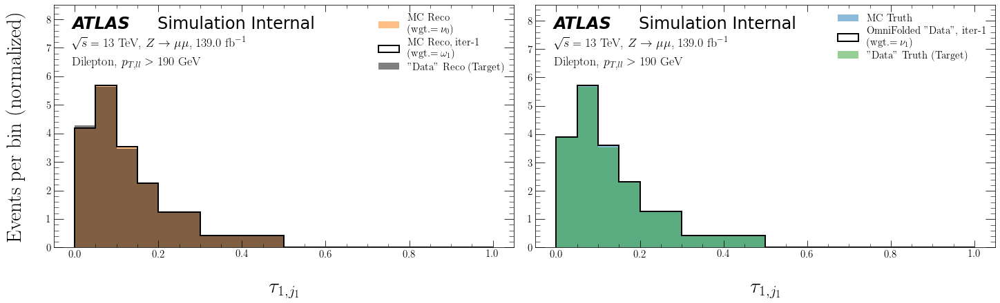

ITERATION 2:


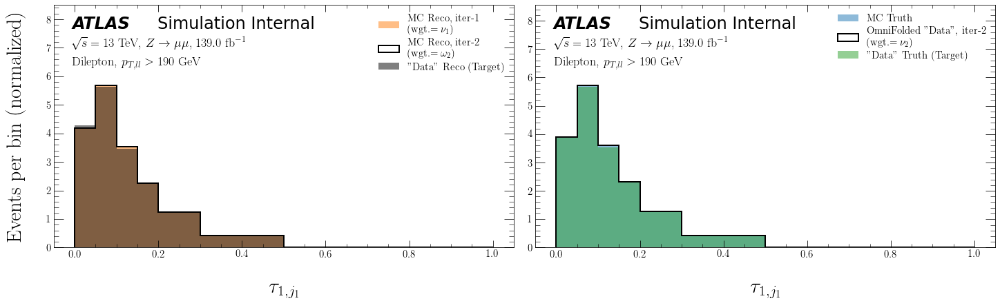

ITERATION 3:


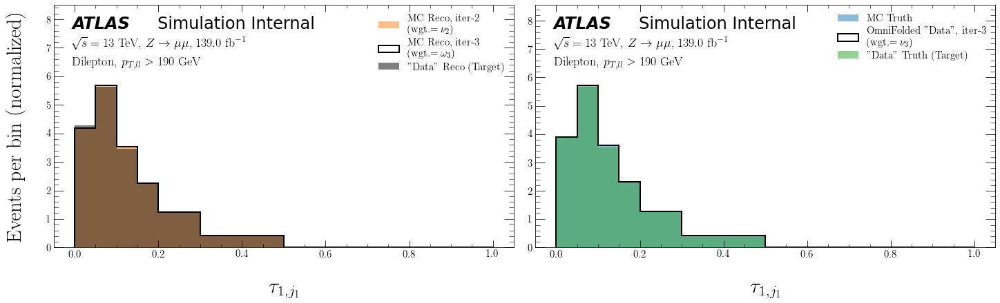

ITERATION 4:


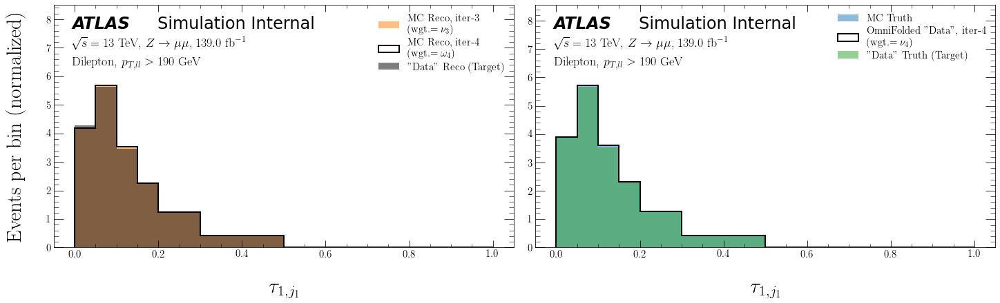

ITERATION 5:


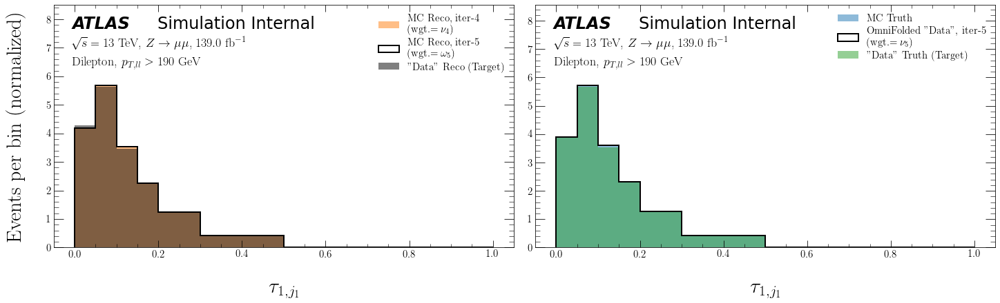

ITERATION 6:


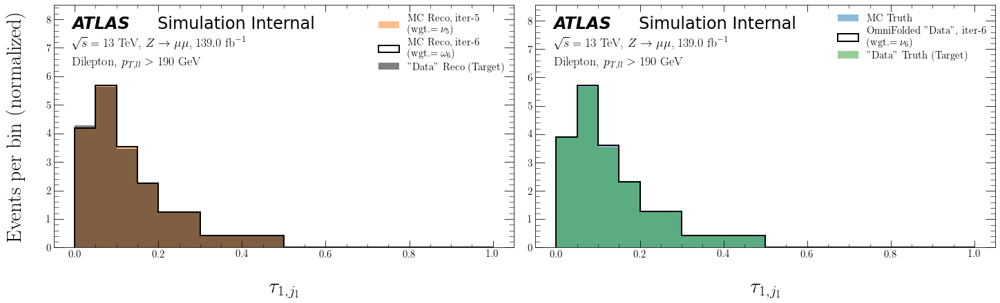

ITERATION 7:


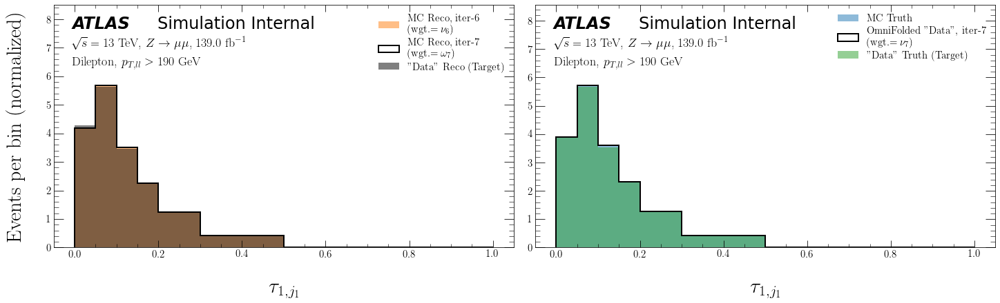

ITERATION 8:


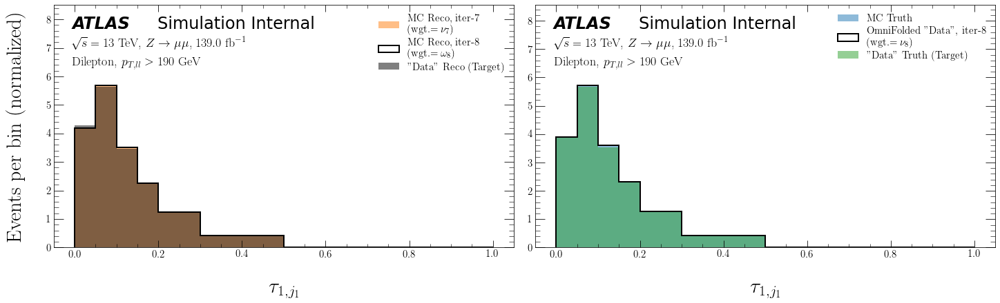

ITERATION 9:


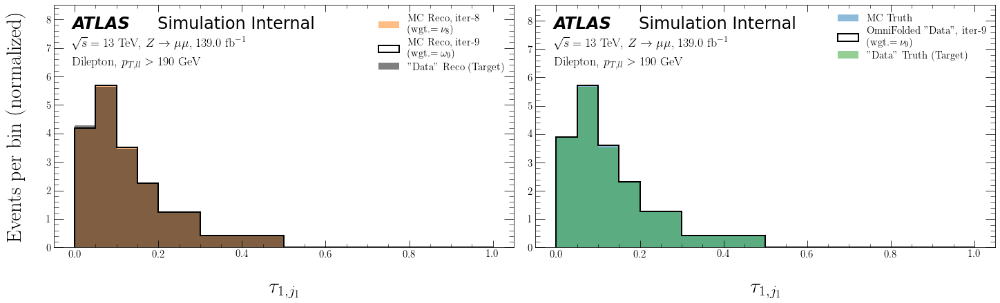

ITERATION 10:


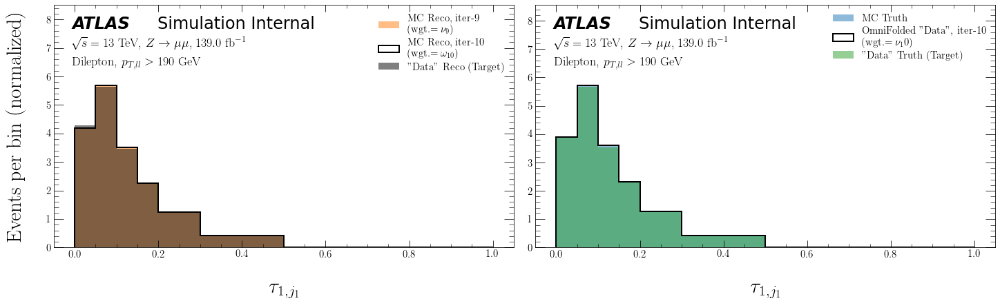

In [79]:
plot_results(sim_truth=sim_truth,
             sim_reco=sim_reco,
             sim_truth_weights_MC=sim_truth_weights_MC,
             sim_reco_weights_MC=sim_reco_weights_MC,
             data_truth=data_truth,
             data_reco=data_reco,
             data_truth_weights_MC=weights_stress,
             data_reco_weights_MC=weights_stress,
             weights=weights,
             bins=bins,
             x_label=x_label,
             save_label=save_label)

# MultiFold

To show unfolding of multiple observables simultaneously ("MultiFold"), we will unfold the following observables together: the leading jet number of constituents (tracks) $N_{j_1}$, the leading jet mass $m_{j_1}$,  the leading jet transverse momentum $p_{T,j_1}$, the leading jet rapidity $y_{j_1}$, the leading jet azimuthal angle $\phi_{j_1}$, the leading jet $n$-subjettiness ($\tau_{1, j_1}$, $\tau_{2, j_1}$, $\tau_{3, j_1}$), the subleading jet number of constituents (tracks) $N_{j_2}$, the subleading jet mass $m_{j_2}$,  the subleading jet transverse momentum $p_{T,j_2}$, the subleading jet rapidity $y_{j_2}$, the subleading jet azimuthal angle $\phi_{j_2}$, the subleading jet $n$-subjettiness ($\tau_{1, j_2}$, $\tau_{2, j_2}$, $\tau_{3, j_2}$), the dilepton transverse momentum $p_{T,ll}$, the dilepton rapidity $y_{ll}$, the leading lepton transverse momentum $p_{T,l_1}$, the leading lepton pseudorapidity $\eta_{l_1}$, the leading lepton azimuthal angle $\phi_{l_1}$, the subleading lepton transverse momentum $p_{T,l_2}$, the subleading lepton pseudorapidity $\eta_{l_2}$, and the subleading lepton azimuthal angle $\phi_{l_2}$ for a total of **24 observables**.

In [80]:
K.clear_session()

## Setup datasets

In [81]:
sim, data = train_test_split(np.arange(np.sum(mypass)), test_size=0.5)

In [82]:
sim_truth = [None] * len(obs)
sim_reco = [None] * len(obs)
data_truth = [None] * len(obs)
data_reco = [None] * len(obs)

In [83]:
for i in range(len(obs)):
    file_label = obs[i]['file_label']
    
    truth = np.array(Events['truth_' +
                                       file_label][mypass].to_list())
    truth[mycut_truth] = -99
    reco = np.array(Events[file_label][mypass].to_list())
    reco[mycut_reco] = -99 

    sim_truth[i] = truth[sim]
    sim_reco[i] = reco[sim]
    data_truth[i] = truth[data]
    data_reco[i] = reco[data]

sim_truth_weights_MC = truth_weights_MC[sim]
sim_reco_weights_MC = reco_weights_MC[sim]
data_truth_weights_MC = truth_weights_MC[data]
data_reco_weights_MC = reco_weights_MC[data]

In [84]:
weights_stress = np.zeros(len(data_truth_weights_MC))

for i in range(len(obs)):
    weights_stress += get_weights_stress(sim_truth[i],
                                         data_truth[i],
                                         data_truth_weights_MC, degree=3)

weights_stress = weights_stress / np.mean(weights_stress)

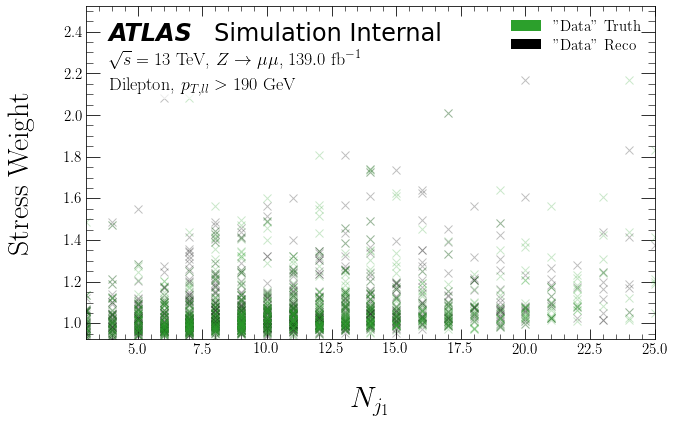

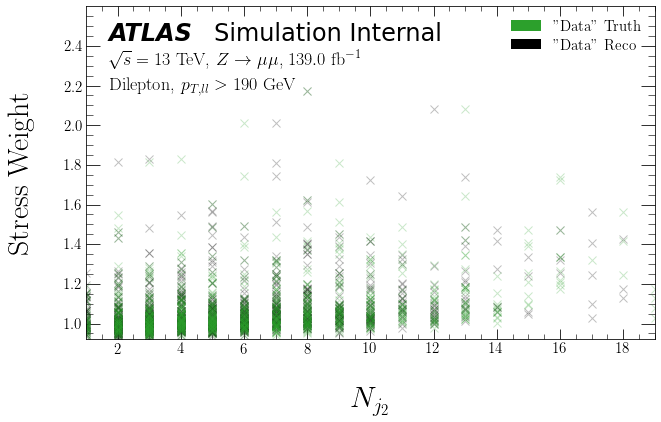

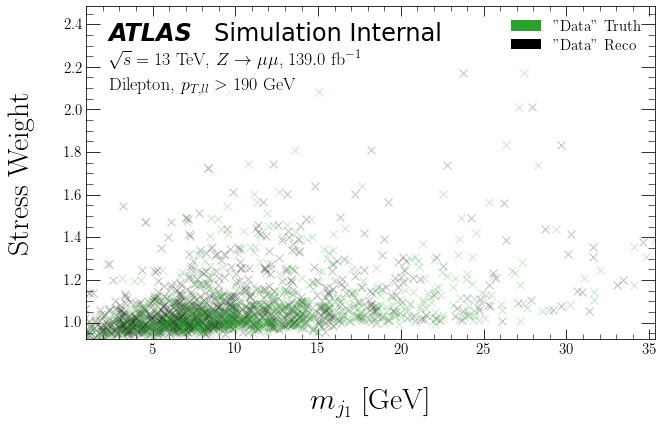

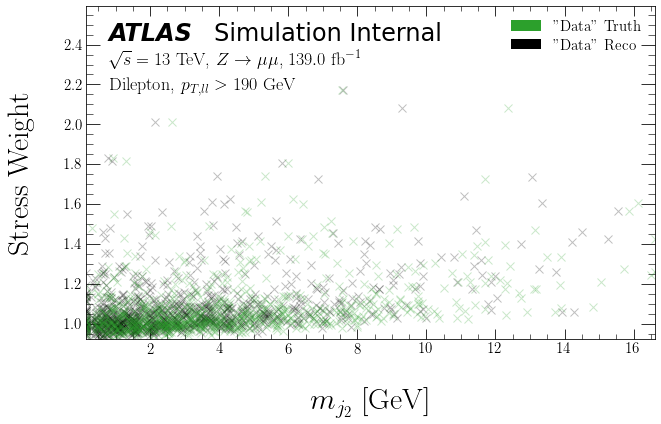

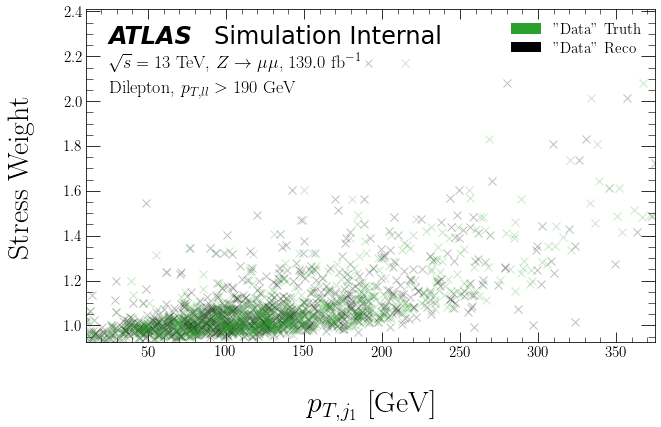

...

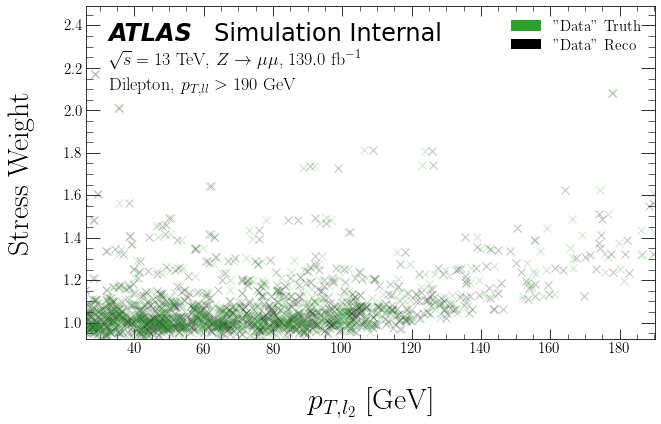

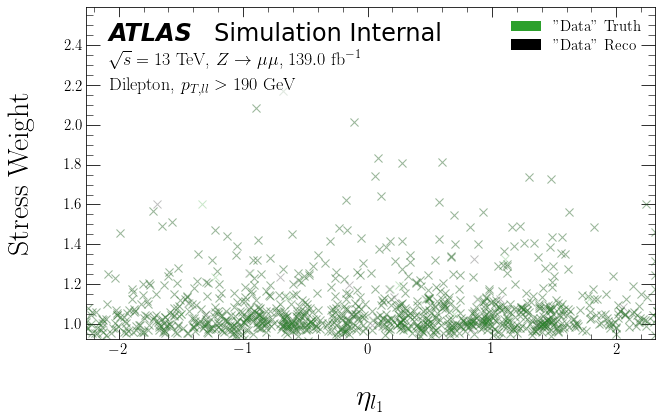

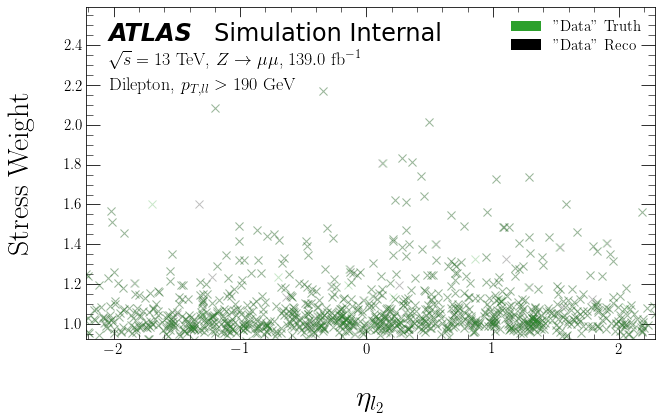

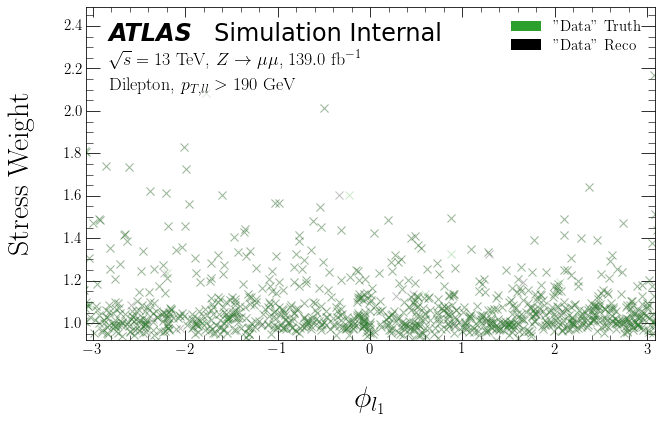

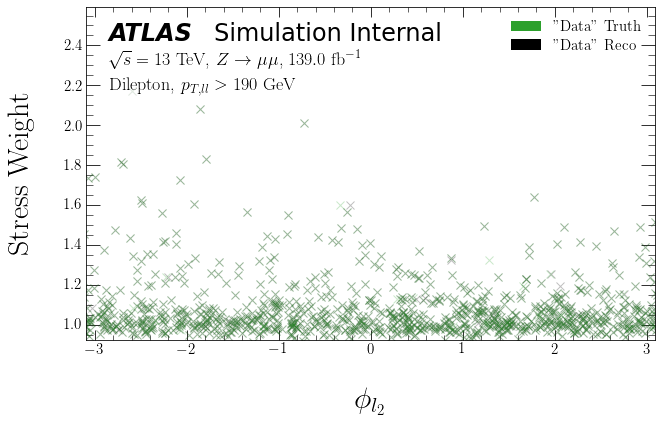

In [85]:
for i in range(len(obs)):
    x_label = obs[i]['plot_label']
    file_label = obs[i]['file_label']
    save_label = plot_dir + 'MultiFold/' + file_label + '/' + save_label0 + '-MultiFold-' + file_label
    plot_weights_stress(weights_stress=weights_stress,
                        data_truth=data_truth[i],
                        data_reco=data_reco[i],
                        x_label=x_label)

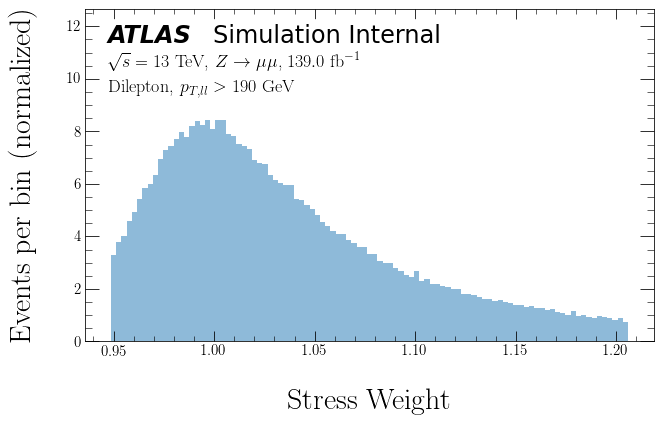

In [86]:
save_label = plot_dir + 'MultiFold/' + save_label0 + '-MultiFold-'

plot_weights_stress_hist(weights_stress=weights_stress,
                    save_label=save_label)

<ipython-input-26-af176f0d0e37>:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1,


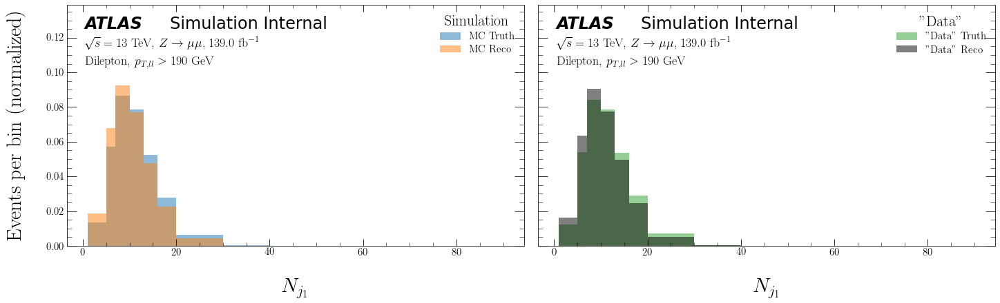

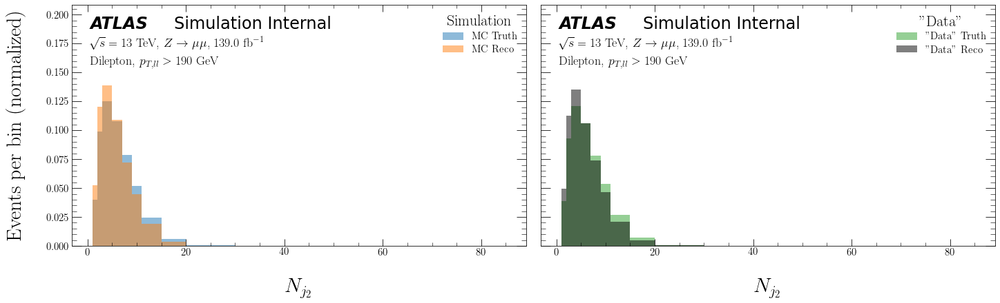

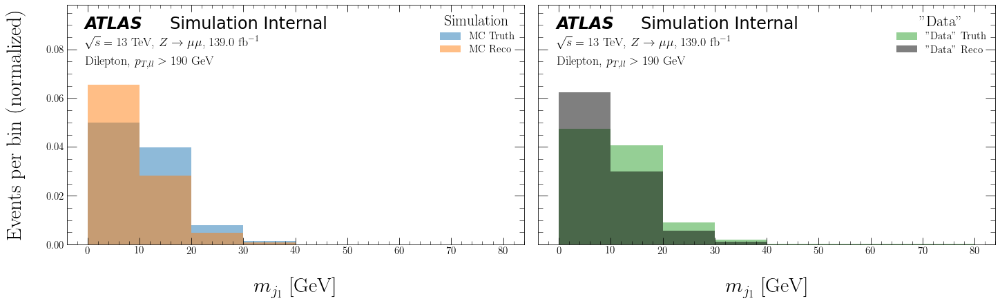

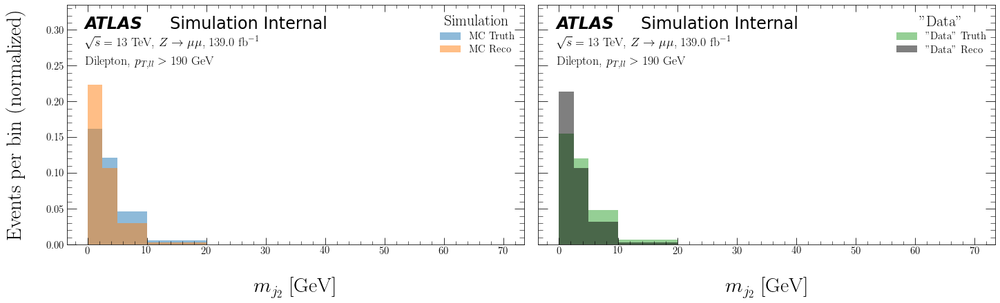

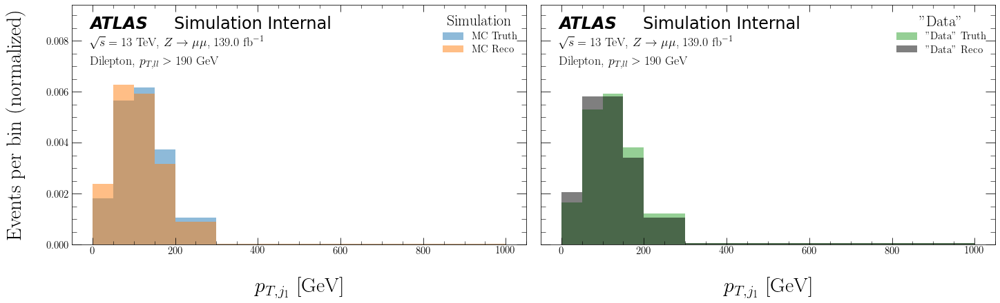

...

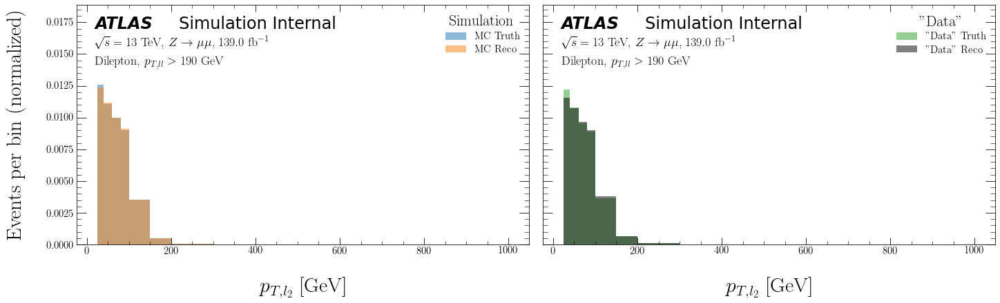

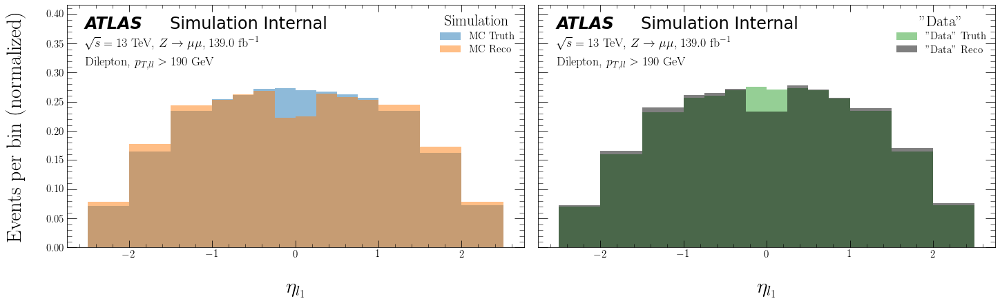

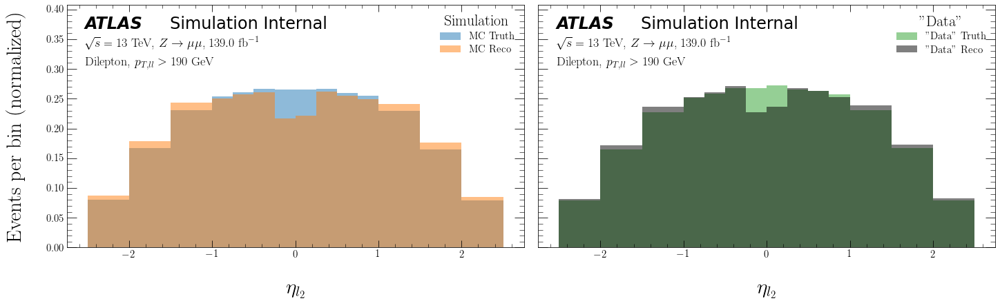

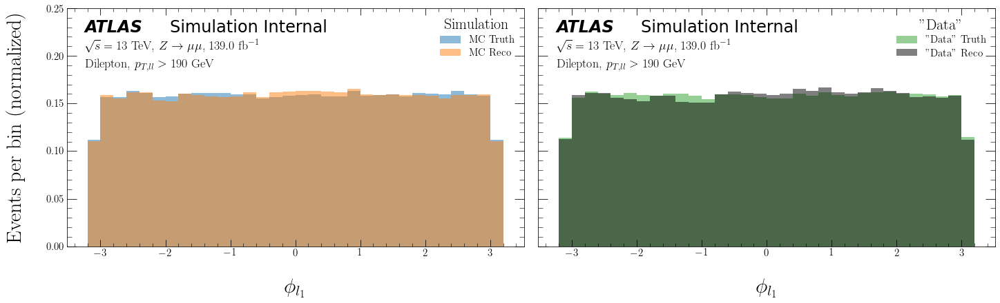

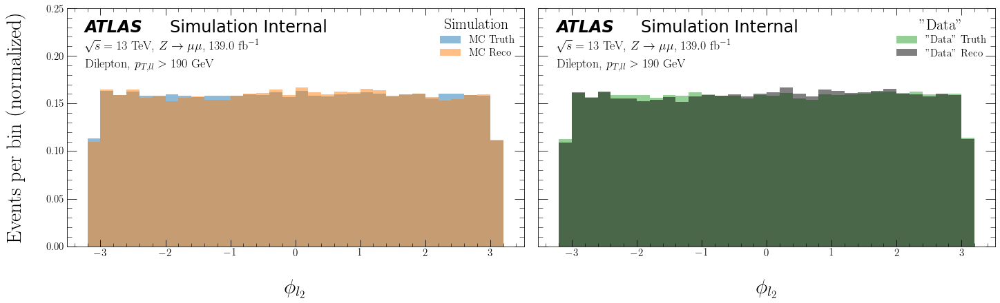

In [87]:
for i in range(len(obs)):
    bins = obs[i]['bins']
    x_label = obs[i]['plot_label']
    file_label = obs[i]['file_label']
    save_label = plot_dir + '/MultiFold/' + file_label + '/' + save_label0 + '-MultiFold-' + file_label
    plot_distributions(sim_truth=sim_truth[i],
                       sim_reco=sim_reco[i],
                       sim_truth_weights_MC=sim_truth_weights_MC,
                       sim_reco_weights_MC=sim_reco_weights_MC,
                       data_truth=data_truth[i],
                       data_reco=data_reco[i],
                       data_truth_weights_MC=weights_stress,
                       data_reco_weights_MC=weights_stress,
                       bins=bins,
                       x_label=x_label,
                       save_label=save_label)

## Unfold 

In [88]:
# z-score standardization of data
sim_truth_z = [None] * len(obs)
sim_reco_z = [None] * len(obs)
data_reco_z = [None] * len(obs)

for i in range(len(obs)):
    sim_truth_z[i], sim_reco_z[i], data_reco_z[i] = standardize(
        sim_truth[i], sim_reco[i], data_reco[i])

In [89]:
weights, _ = multifold(iterations=10,
                       sim_truth=sim_truth_z,
                       sim_reco=sim_reco_z,
                       sim_truth_weights_MC=sim_truth_weights_MC,
                       sim_reco_weights_MC=sim_reco_weights_MC,
                       data_reco=data_reco_z,
                       data_reco_weights_MC=weights_stress,
                       verbose=1)


ITERATION: 1

STEP 1

Epoch 1/200
32/32 [==============================] - 0s 8ms/step - loss: 0.6921 - accuracy: 0.2632 - val_loss: 0.6901 - val_accuracy: 0.2628
Epoch 2/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6899 - accuracy: 0.2631 - val_loss: 0.6896 - val_accuracy: 0.2628
Epoch 3/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6896 - accuracy: 0.2632 - val_loss: 0.6895 - val_accuracy: 0.2626
Epoch 4/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6896 - accuracy: 0.2632 - val_loss: 0.6894 - val_accuracy: 0.2628
Epoch 5/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6895 - accuracy: 0.2634 - val_loss: 0.6896 - val_accuracy: 0.2631
Epoch 6/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6894 - accuracy: 0.2635 - val_loss: 0.6895 - val_accuracy: 0.2630
Epoch 7/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6894 - accuracy: 0.2632 - val_loss: 0.6894 - val_accurac

32/32 [==============================] - 0s 5ms/step - loss: 0.6917 - accuracy: 0.2633 - val_loss: 0.6924 - val_accuracy: 0.2640
Epoch 27/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6918 - accuracy: 0.2629 - val_loss: 0.6926 - val_accuracy: 0.2606
Epoch 28/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6918 - accuracy: 0.2620 - val_loss: 0.6926 - val_accuracy: 0.2617
Epoch 29/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6917 - accuracy: 0.2629 - val_loss: 0.6926 - val_accuracy: 0.2622
Epoch 30/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6917 - accuracy: 0.2627 - val_loss: 0.6926 - val_accuracy: 0.2607
Epoch 31/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6917 - accuracy: 0.2622 - val_loss: 0.6925 - val_accuracy: 0.2618
Epoch 32/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6917 - accuracy: 0.2627 - val_loss: 0.6925 - val_accuracy: 0.2613
Epoch 33/200
32/32 

32/32 [==============================] - 0s 4ms/step - loss: 0.6872 - accuracy: 0.2498 - val_loss: 0.6868 - val_accuracy: 0.2498
Epoch 9/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6871 - accuracy: 0.2501 - val_loss: 0.6868 - val_accuracy: 0.2497
Epoch 10/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6871 - accuracy: 0.2500 - val_loss: 0.6869 - val_accuracy: 0.2495
Epoch 11/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6871 - accuracy: 0.2497 - val_loss: 0.6869 - val_accuracy: 0.2496
Epoch 12/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6871 - accuracy: 0.2498 - val_loss: 0.6869 - val_accuracy: 0.2495
Epoch 00012: early stopping

ITERATION: 5

STEP 1

Epoch 1/200
32/32 [==============================] - 0s 6ms/step - loss: 0.6935 - accuracy: 0.2590 - val_loss: 0.6932 - val_accuracy: 0.2548
Epoch 2/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6930 - accuracy: 0.2638 - val_loss: 0

Epoch 8/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6862 - accuracy: 0.2500 - val_loss: 0.6864 - val_accuracy: 0.2493
Epoch 9/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6862 - accuracy: 0.2499 - val_loss: 0.6865 - val_accuracy: 0.2497
Epoch 10/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6862 - accuracy: 0.2500 - val_loss: 0.6865 - val_accuracy: 0.2494
Epoch 11/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6861 - accuracy: 0.2501 - val_loss: 0.6866 - val_accuracy: 0.2491
Epoch 00011: early stopping

ITERATION: 7

STEP 1

Epoch 1/200
32/32 [==============================] - 0s 9ms/step - loss: 0.6931 - accuracy: 0.2602 - val_loss: 0.6935 - val_accuracy: 0.2635
Epoch 2/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6925 - accuracy: 0.2618 - val_loss: 0.6934 - val_accuracy: 0.2627
Epoch 3/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6925 - accuracy: 0.2615 - 

Epoch 11/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6858 - accuracy: 0.2502 - val_loss: 0.6877 - val_accuracy: 0.2493
Epoch 12/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6857 - accuracy: 0.2504 - val_loss: 0.6877 - val_accuracy: 0.2492
Epoch 13/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6857 - accuracy: 0.2501 - val_loss: 0.6877 - val_accuracy: 0.2492
Epoch 00013: early stopping

ITERATION: 9

STEP 1

Epoch 1/200
32/32 [==============================] - 0s 6ms/step - loss: 0.6929 - accuracy: 0.2605 - val_loss: 0.6938 - val_accuracy: 0.2623
Epoch 2/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6924 - accuracy: 0.2628 - val_loss: 0.6937 - val_accuracy: 0.2613
Epoch 3/200
32/32 [==============================] - 0s 4ms/step - loss: 0.6924 - accuracy: 0.2625 - val_loss: 0.6939 - val_accuracy: 0.2617
Epoch 4/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6923 - accuracy: 0.2625 -

Epoch 11/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6857 - accuracy: 0.2502 - val_loss: 0.6859 - val_accuracy: 0.2489
Epoch 12/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6857 - accuracy: 0.2504 - val_loss: 0.6860 - val_accuracy: 0.2489
Epoch 00012: early stopping


### Results

Ntracks_trackj1 Results

ITERATION 1:


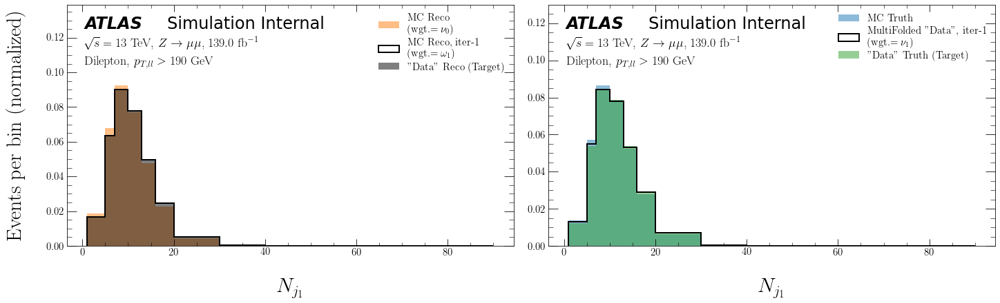

ITERATION 2:


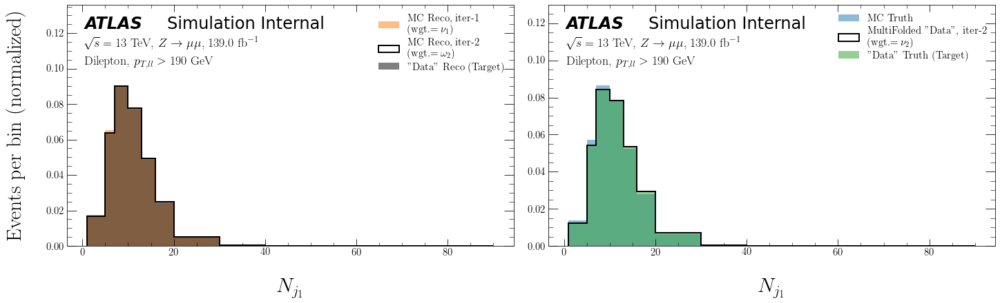

ITERATION 3:


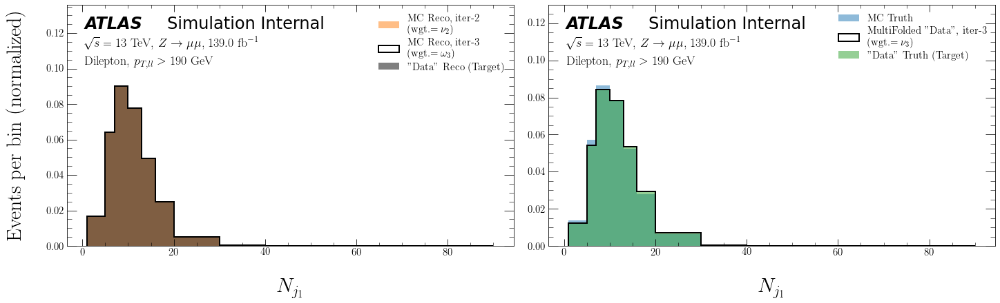

ITERATION 4:


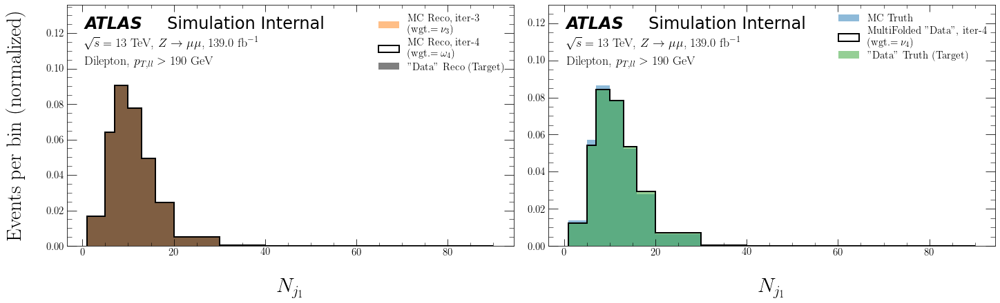

ITERATION 5:


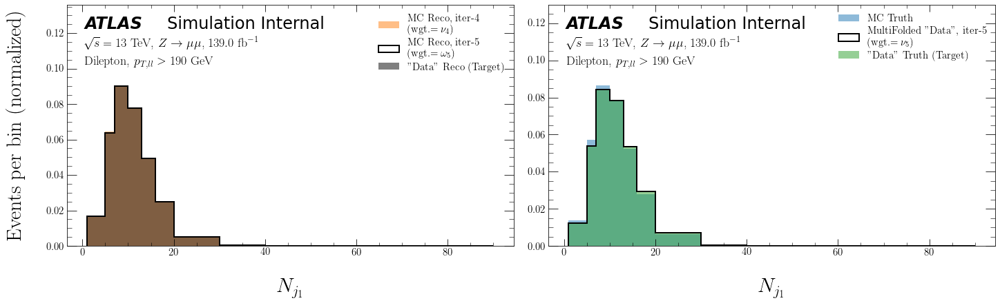

ITERATION 6:


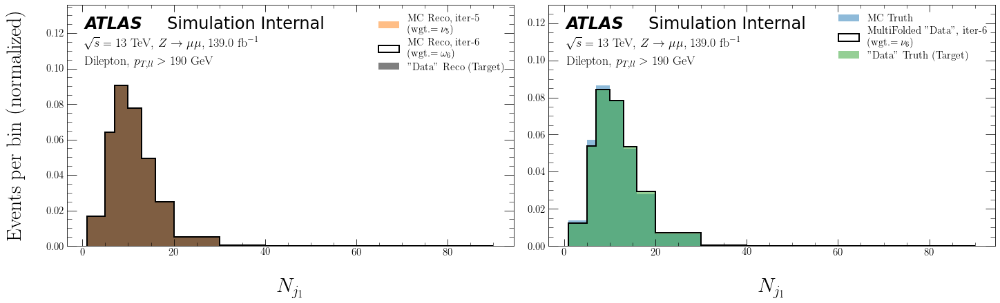

ITERATION 7:


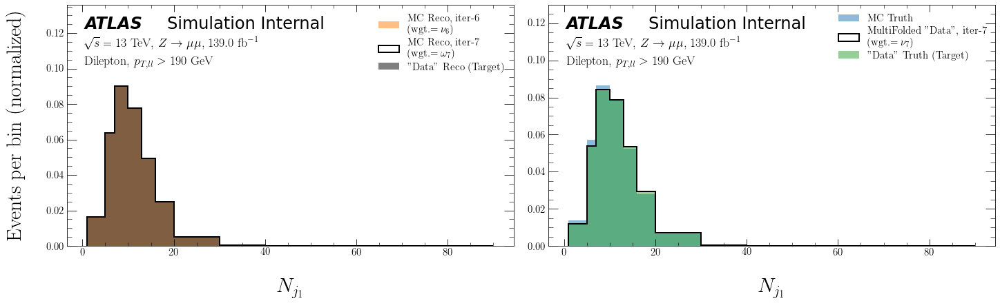

ITERATION 8:


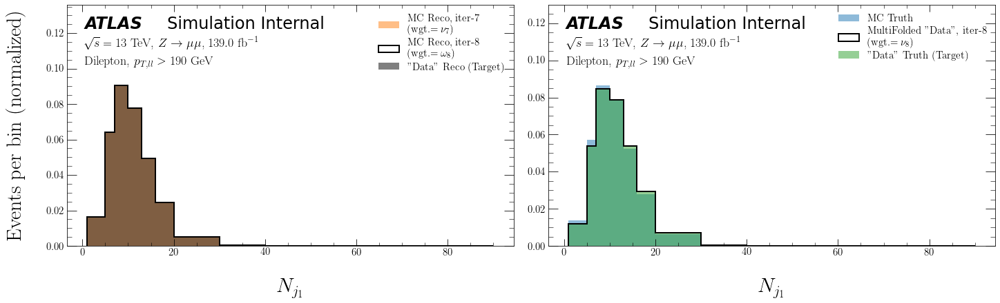

ITERATION 9:


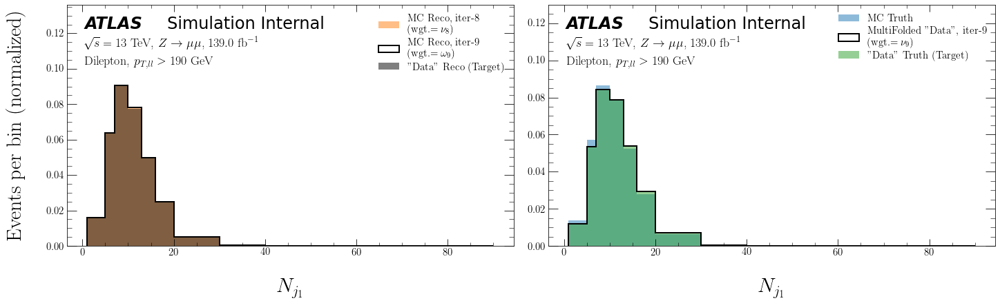

ITERATION 10:


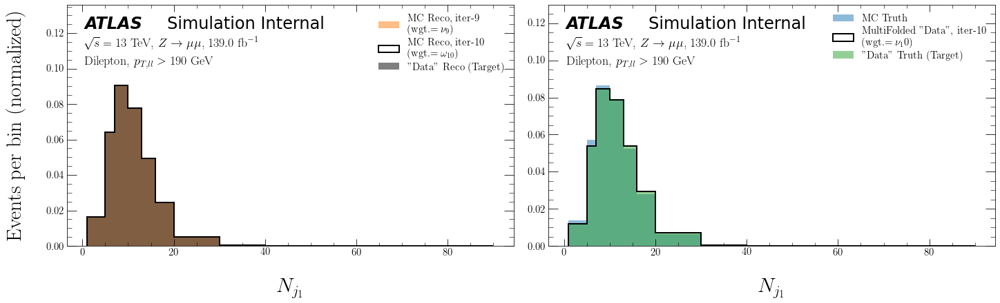

Ntracks_trackj2 Results

ITERATION 1:


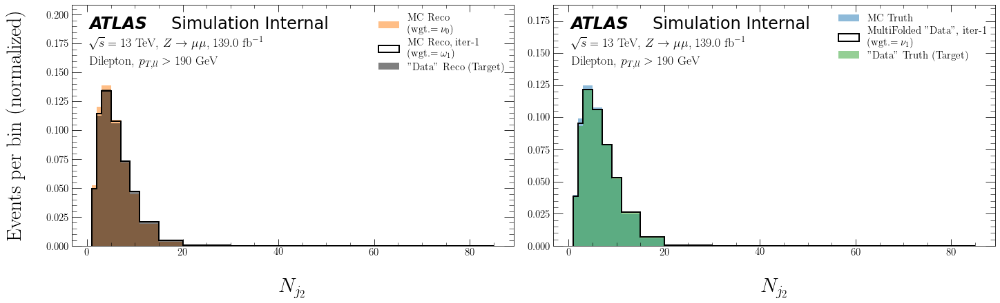

ITERATION 2:


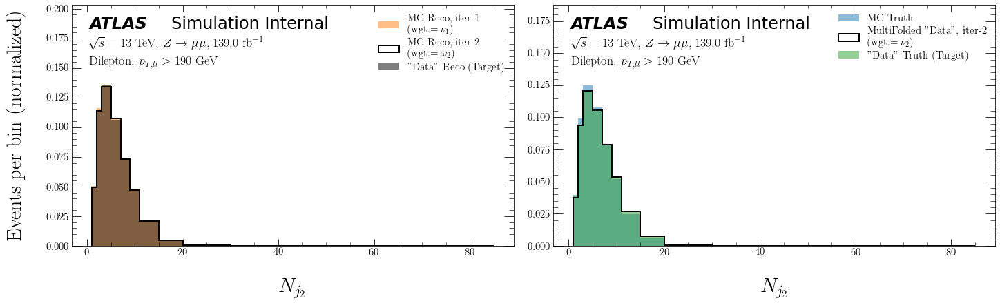

ITERATION 3:


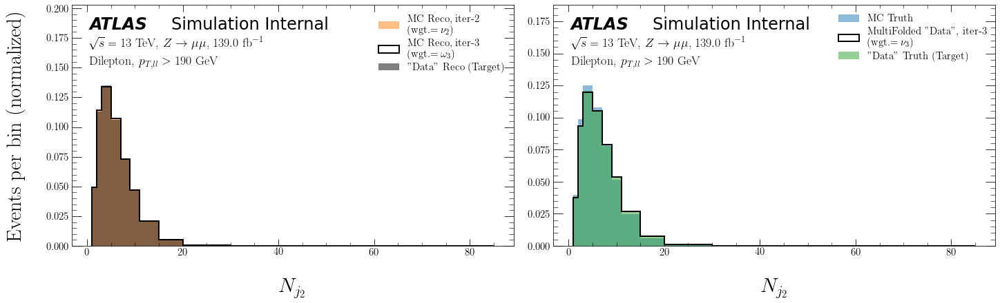

ITERATION 4:


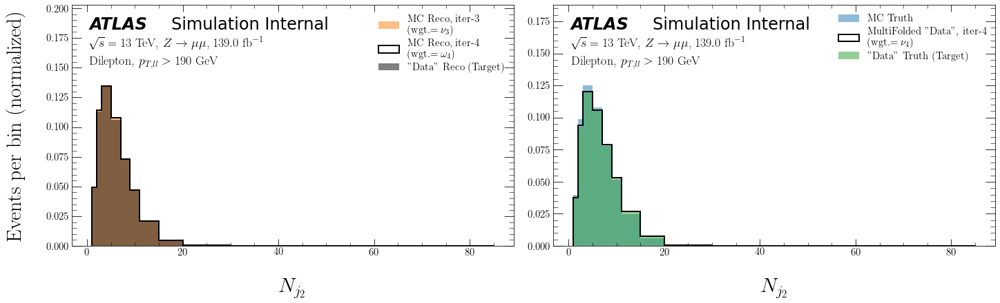

ITERATION 5:


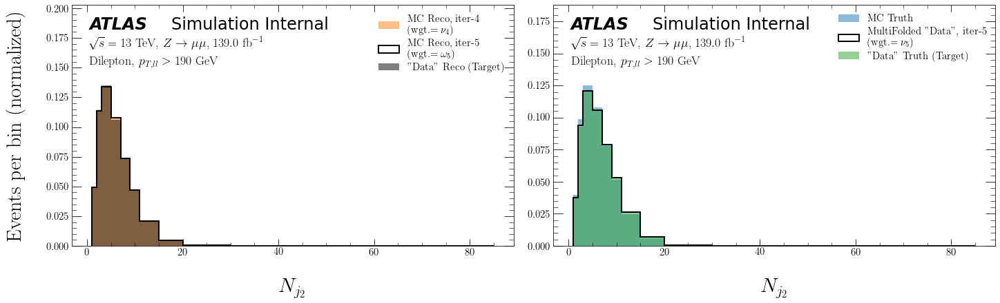

ITERATION 6:


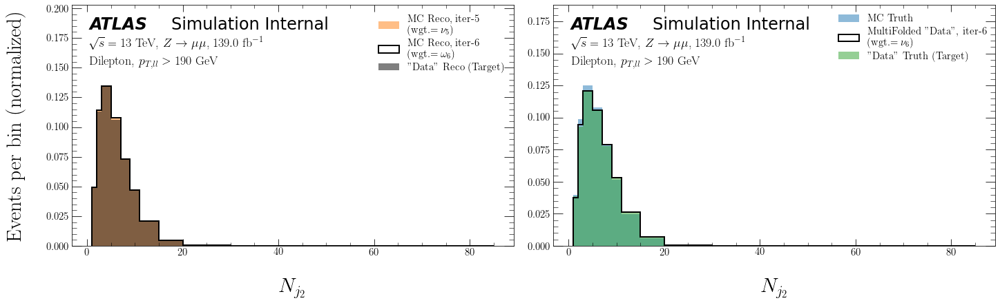

ITERATION 7:


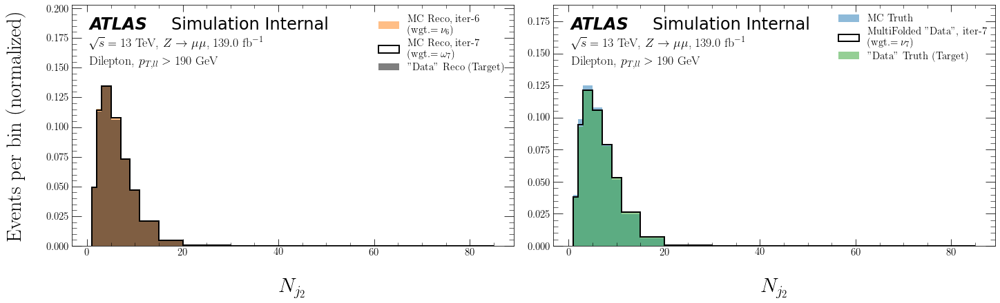

ITERATION 8:


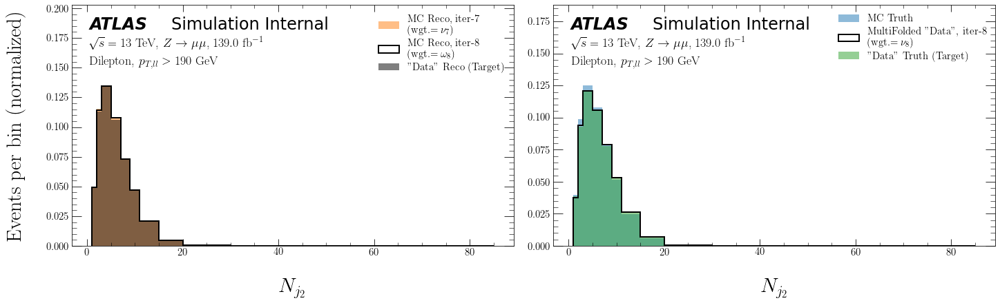

ITERATION 9:


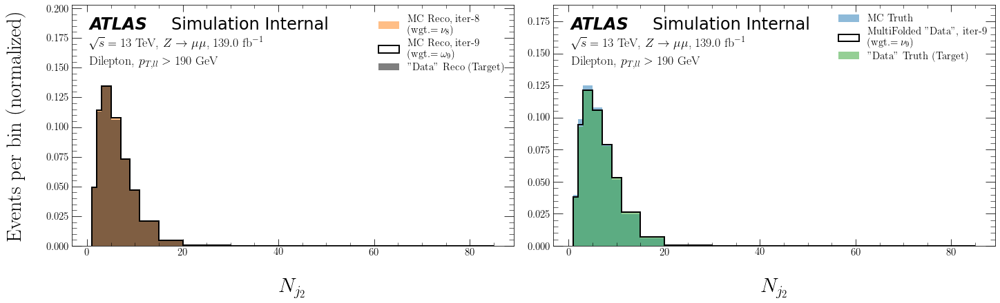

ITERATION 10:


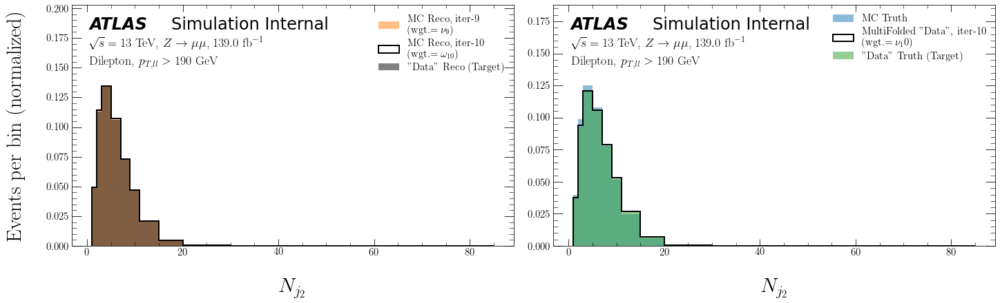

m_trackj1 Results

ITERATION 1:


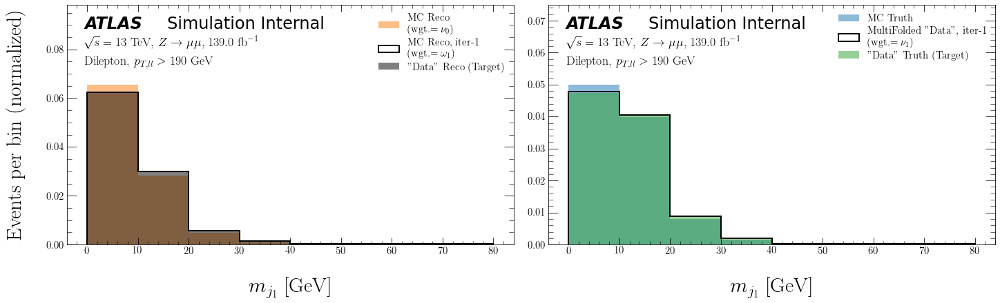

ITERATION 2:


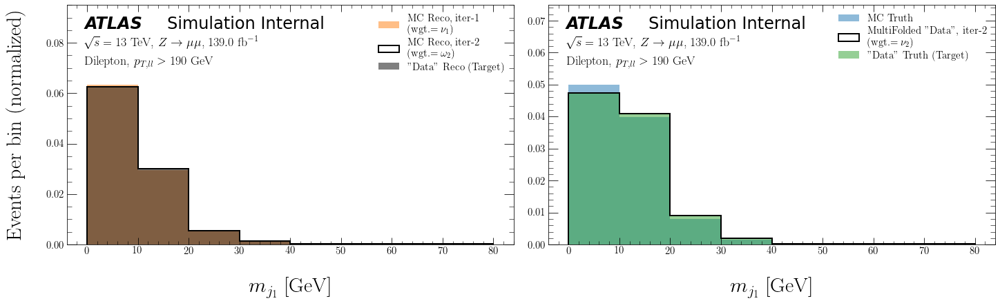

ITERATION 3:


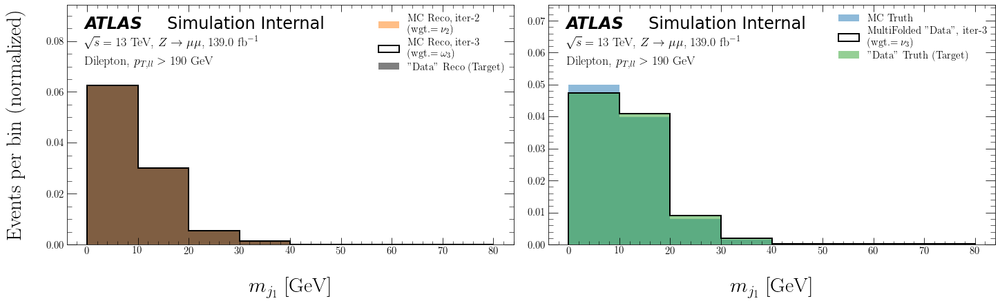

ITERATION 4:


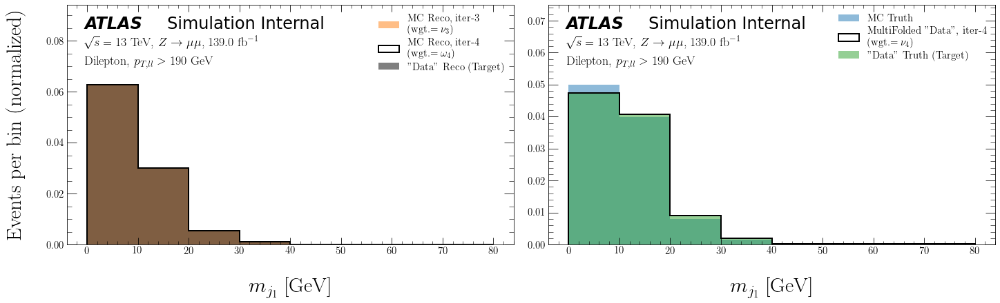

ITERATION 5:


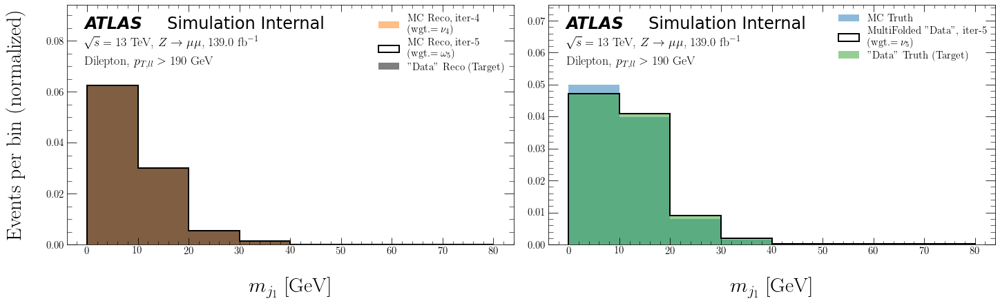

ITERATION 6:


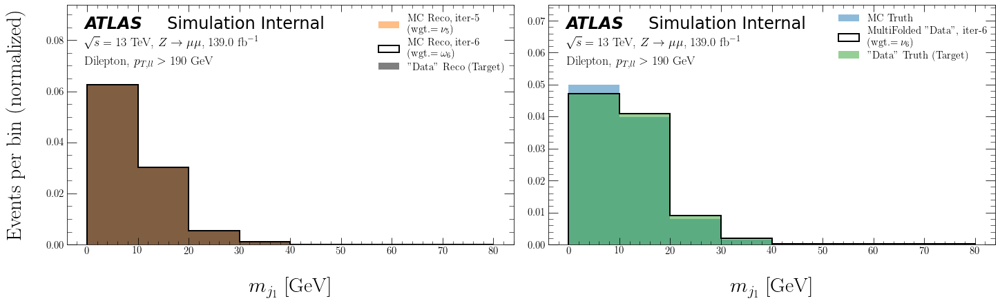

ITERATION 7:


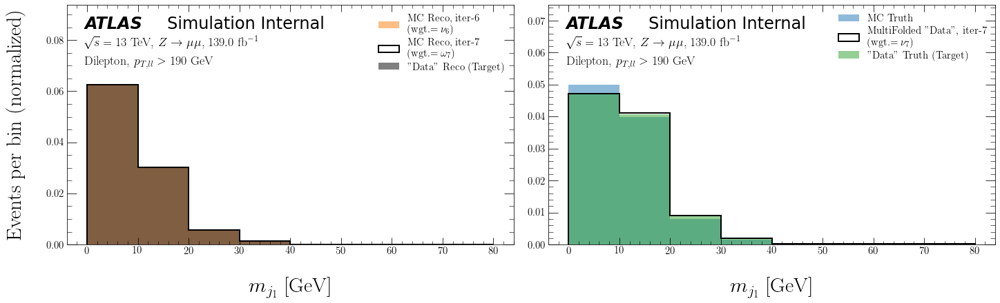

ITERATION 8:


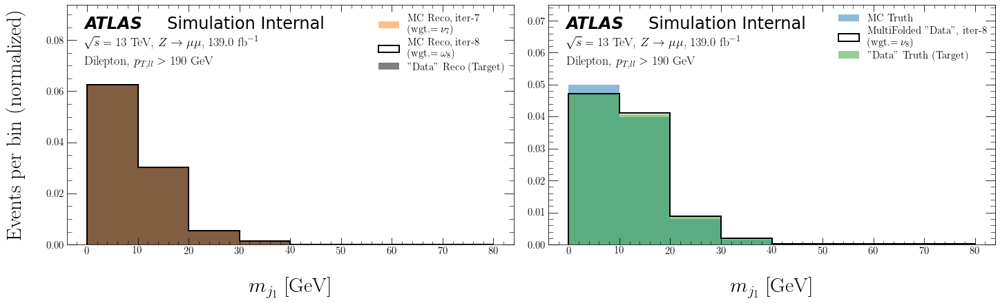

ITERATION 9:


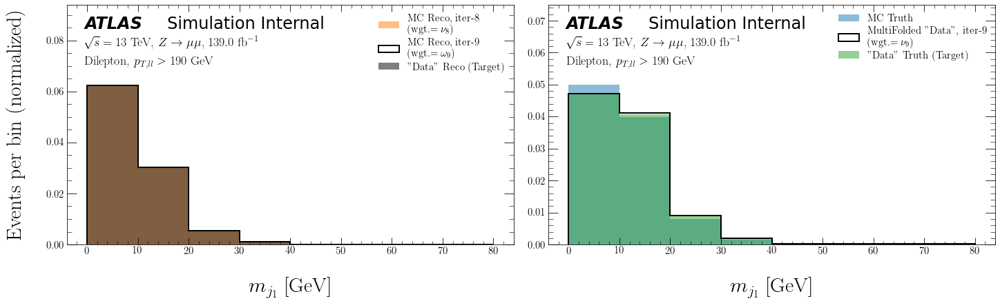

ITERATION 10:


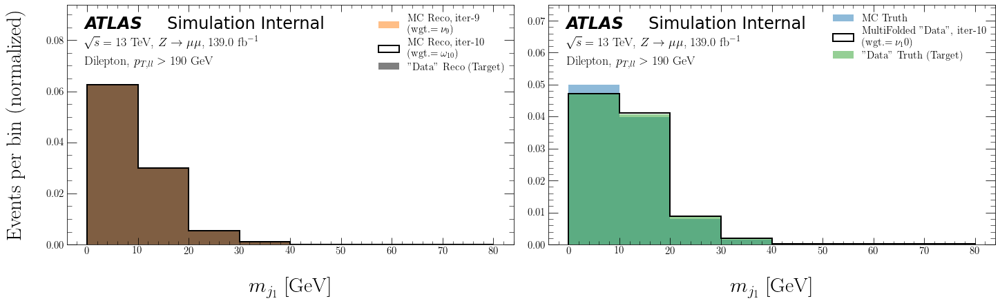

m_trackj2 Results

ITERATION 1:


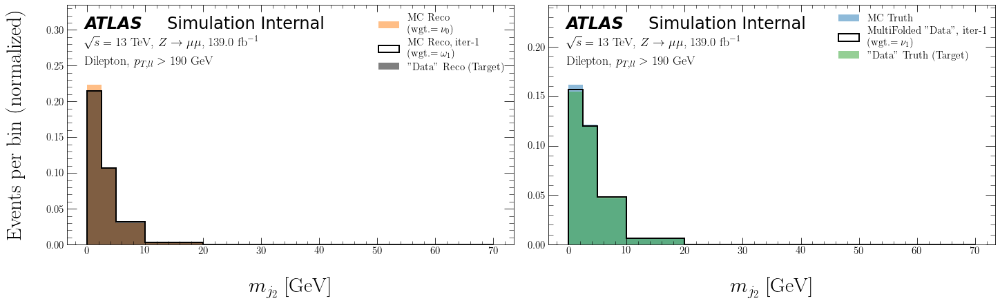

ITERATION 2:


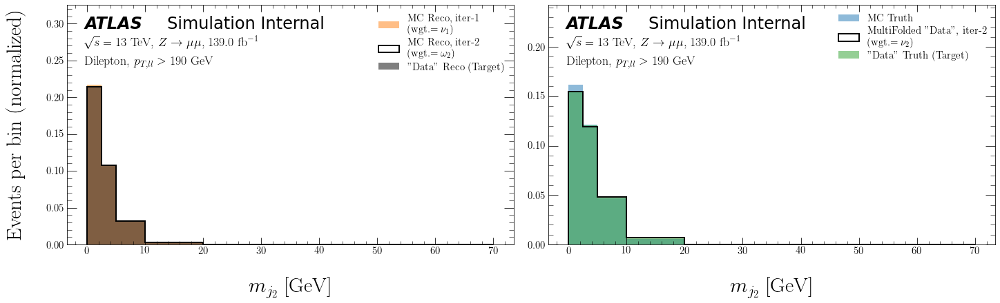

ITERATION 3:


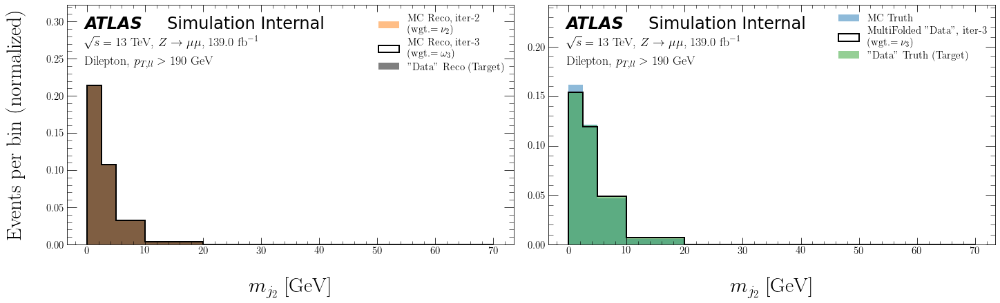

ITERATION 4:


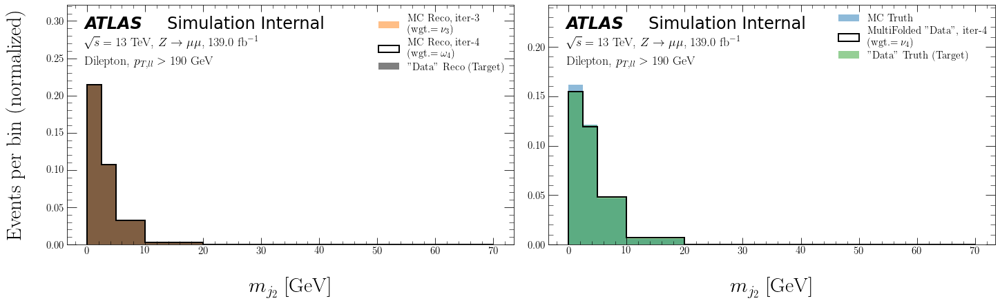

ITERATION 5:


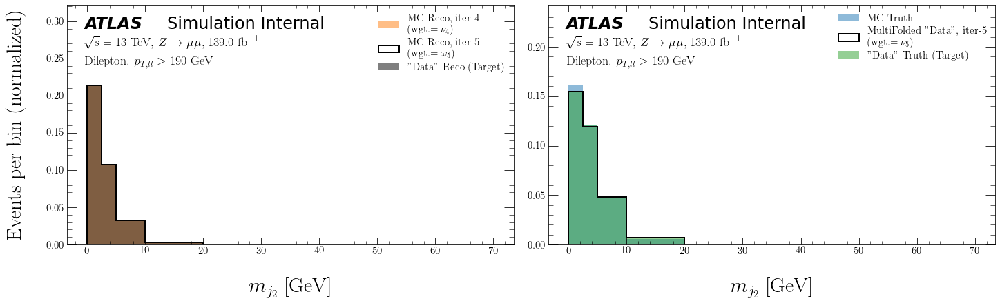

ITERATION 6:


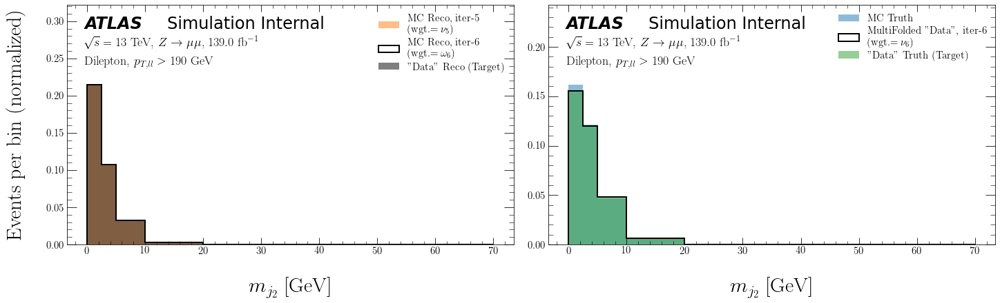

ITERATION 7:


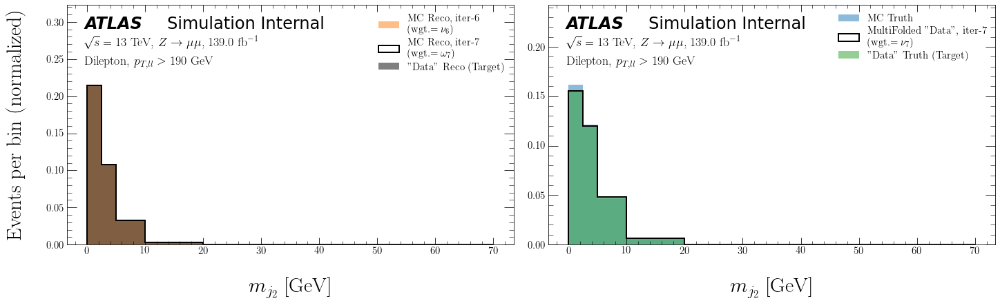

ITERATION 8:


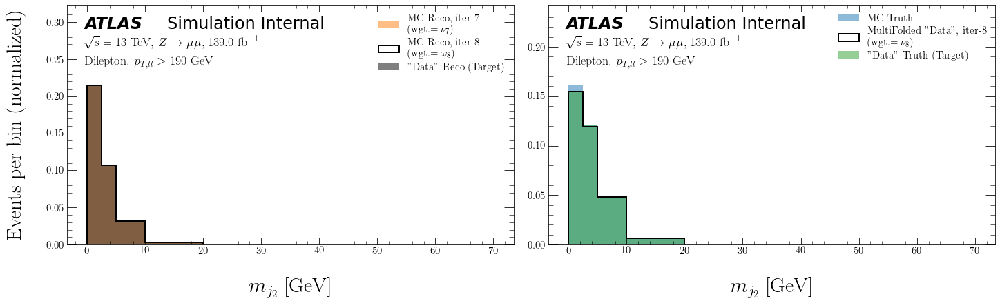

ITERATION 9:


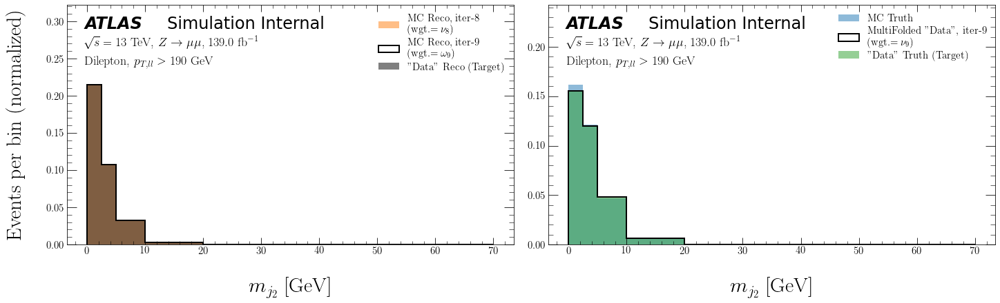

ITERATION 10:


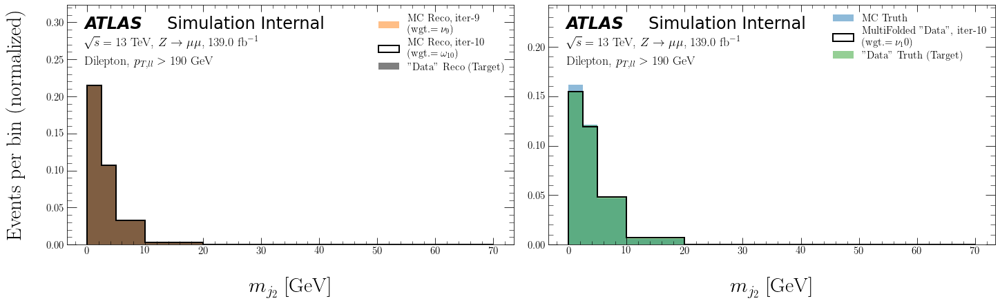

pT_trackj1 Results

ITERATION 1:


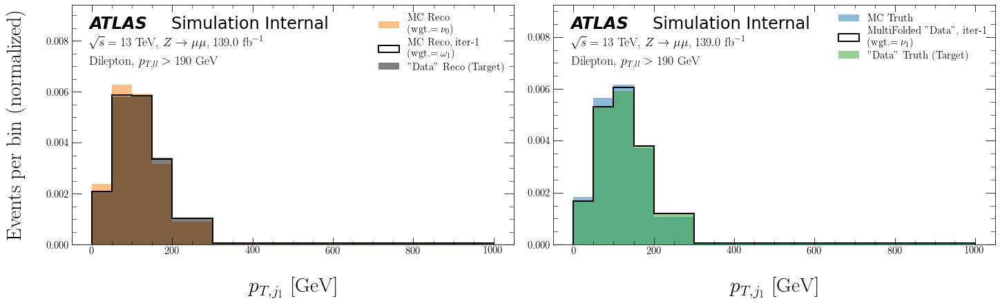

ITERATION 2:


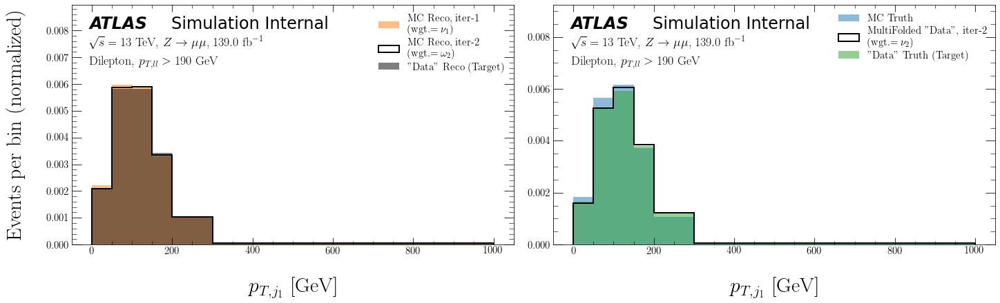

ITERATION 3:


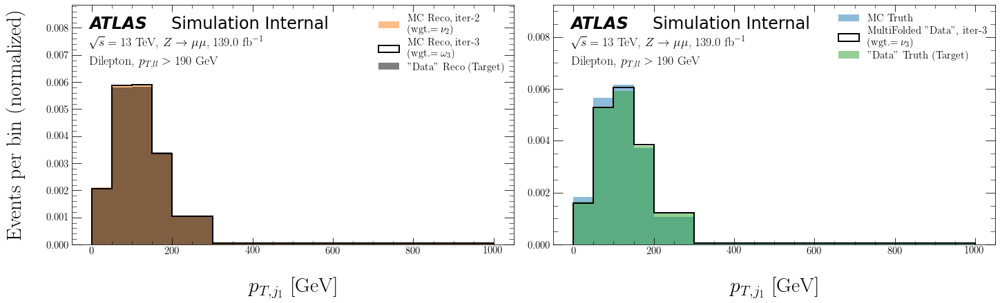

ITERATION 4:


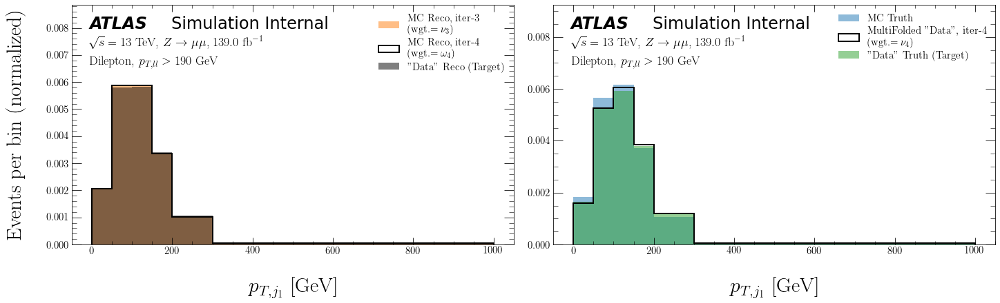

ITERATION 5:


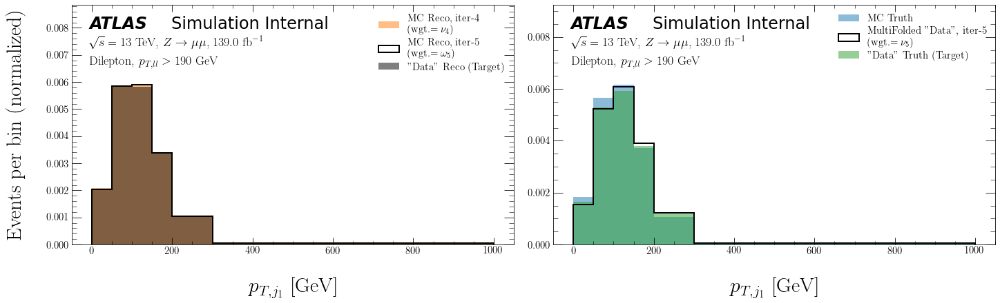

ITERATION 6:


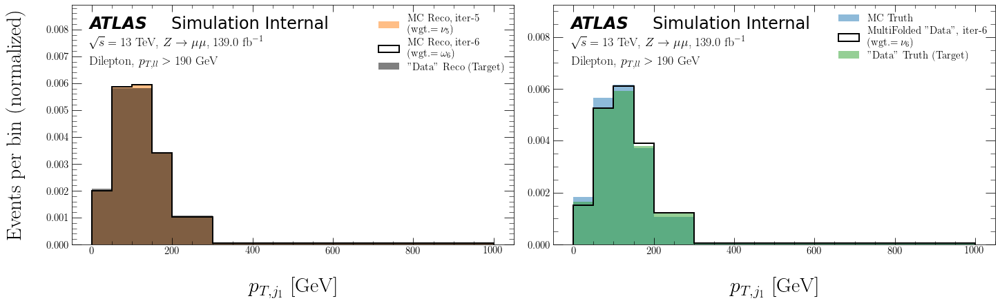

ITERATION 7:


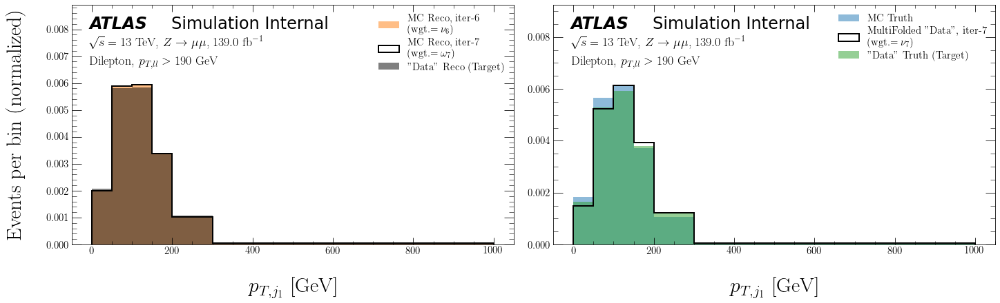

ITERATION 8:


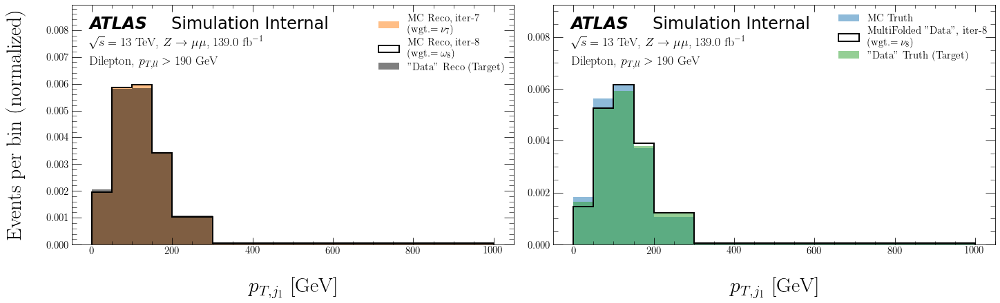

ITERATION 9:


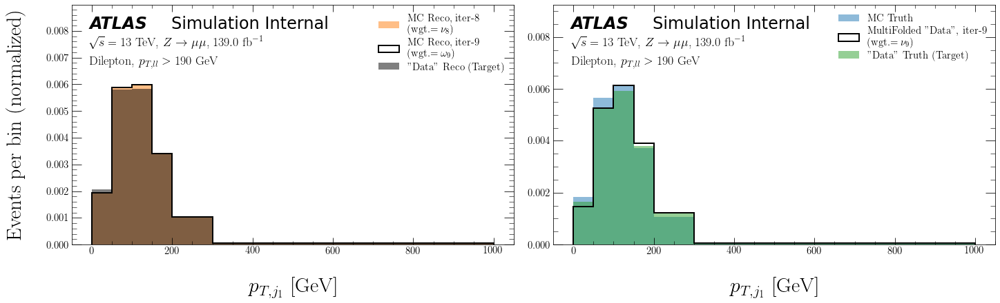

ITERATION 10:


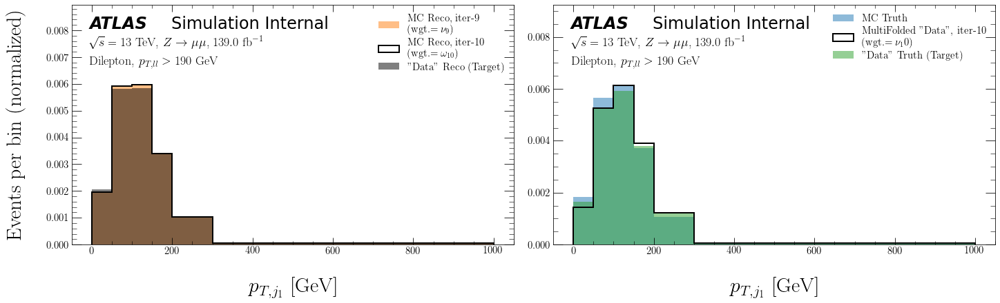

pT_trackj2 Results

ITERATION 1:


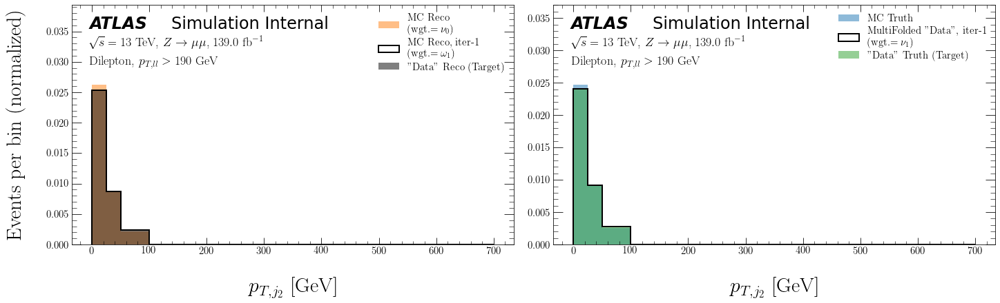

ITERATION 2:


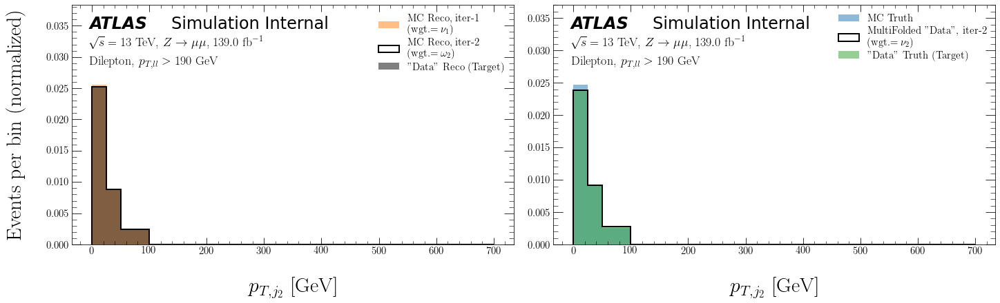

ITERATION 3:


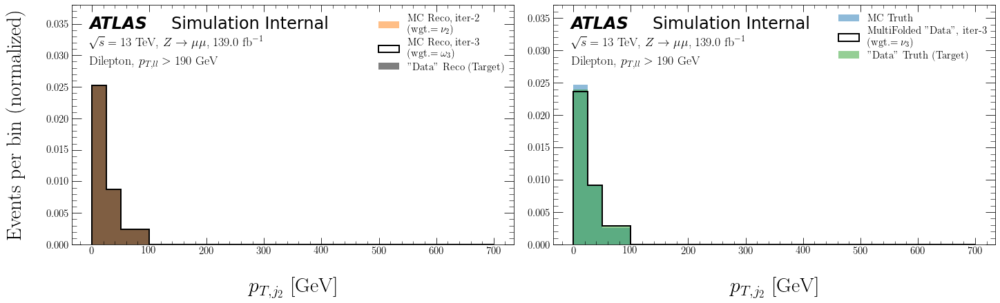

ITERATION 4:


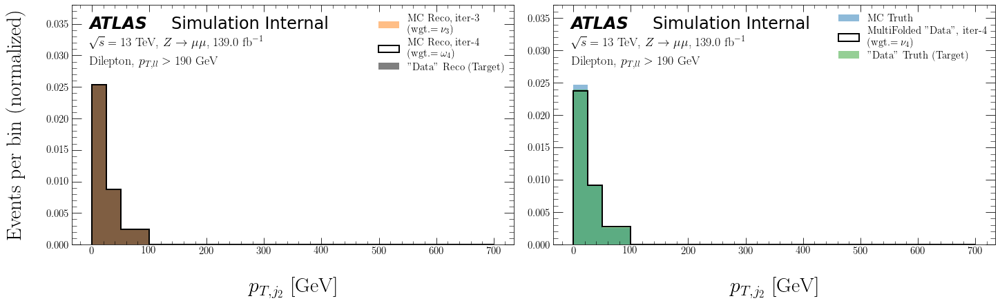

ITERATION 5:


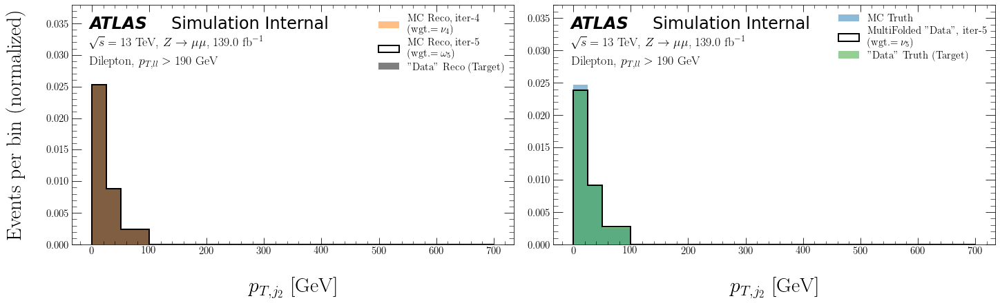

ITERATION 6:


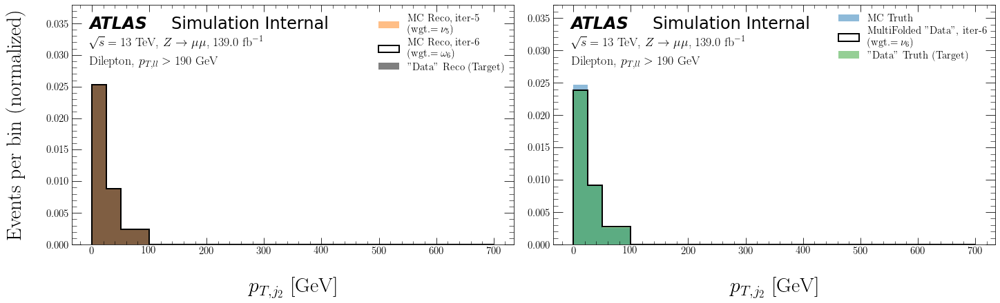

ITERATION 7:


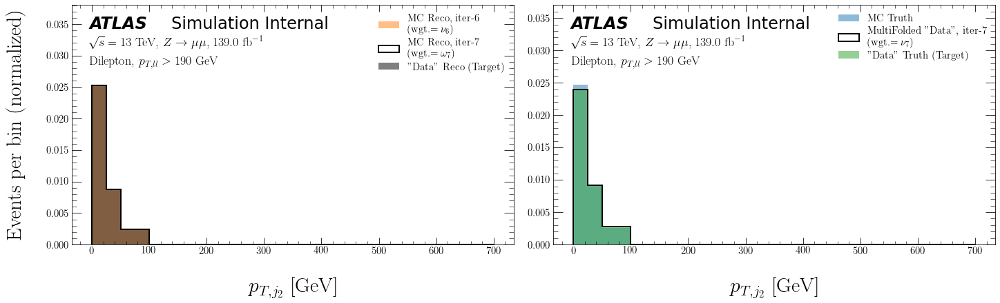

ITERATION 8:


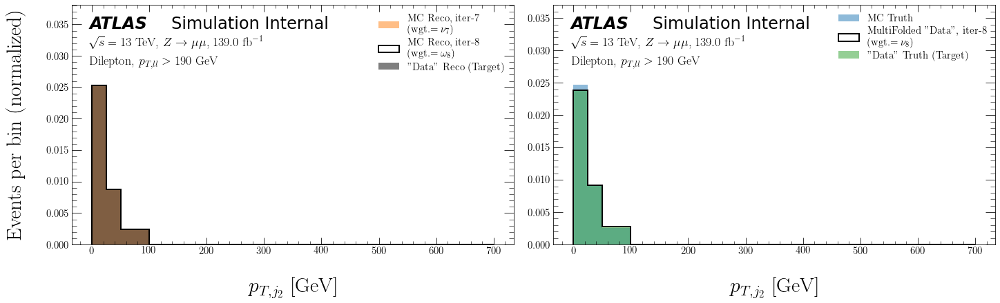

ITERATION 9:


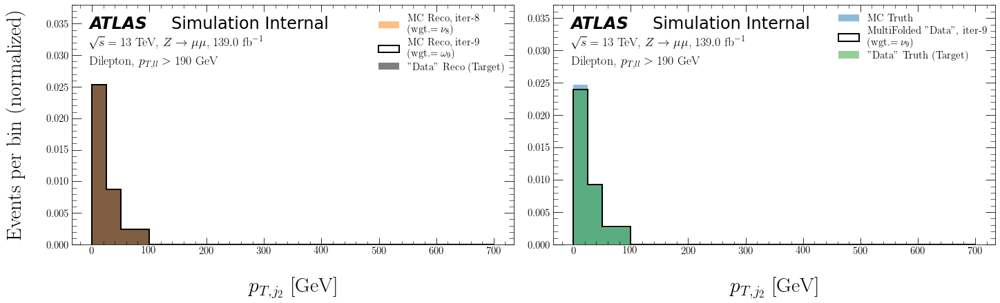

ITERATION 10:


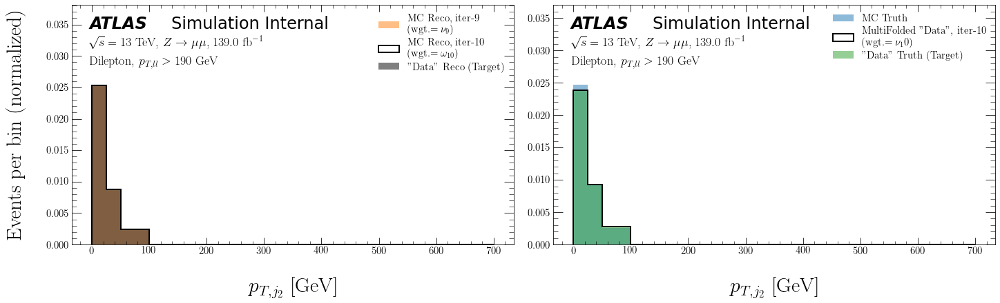

y_trackj1 Results

ITERATION 1:


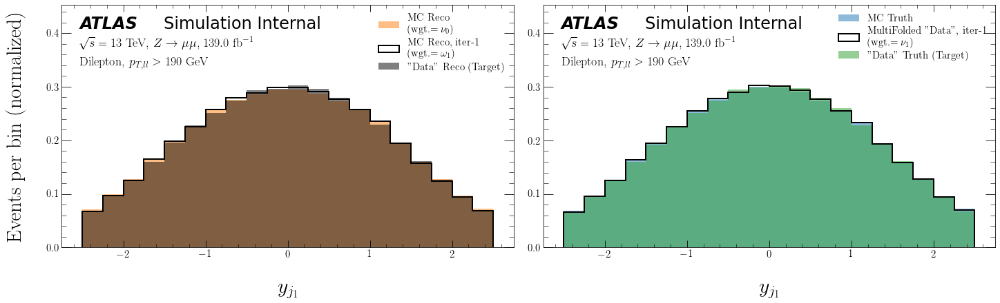

ITERATION 2:


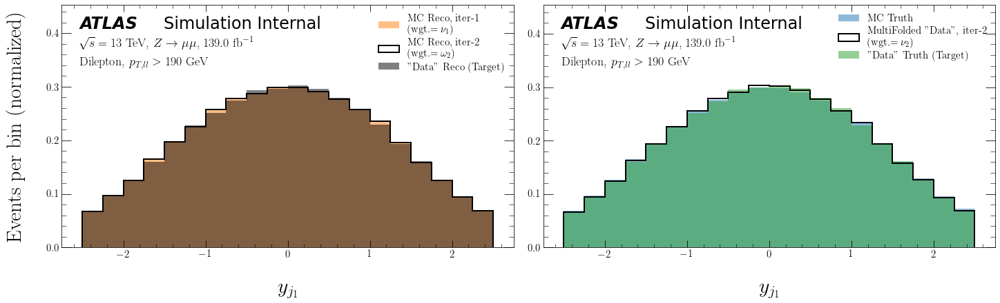

ITERATION 3:


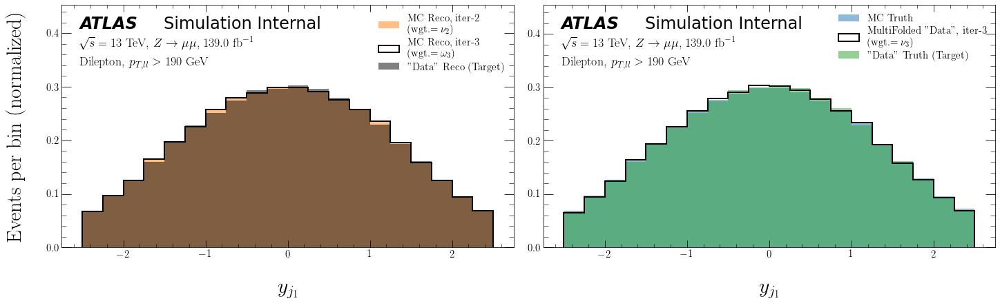

ITERATION 4:


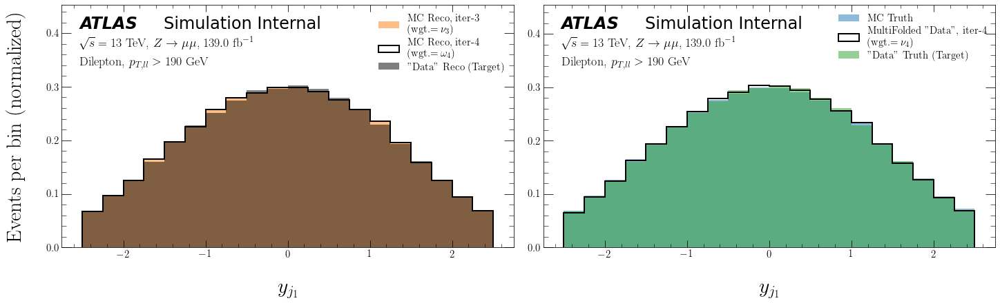

ITERATION 5:


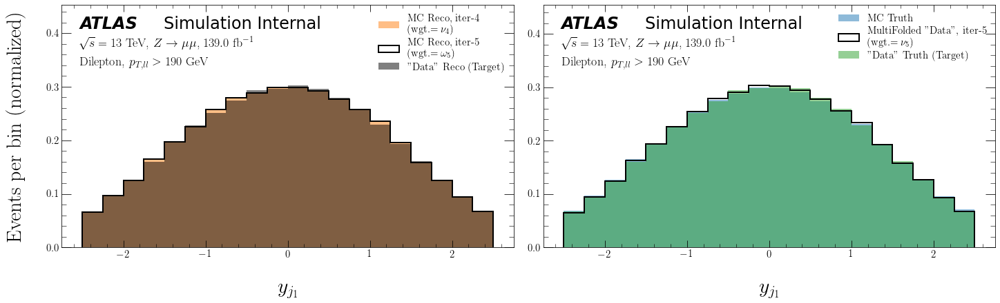

ITERATION 6:


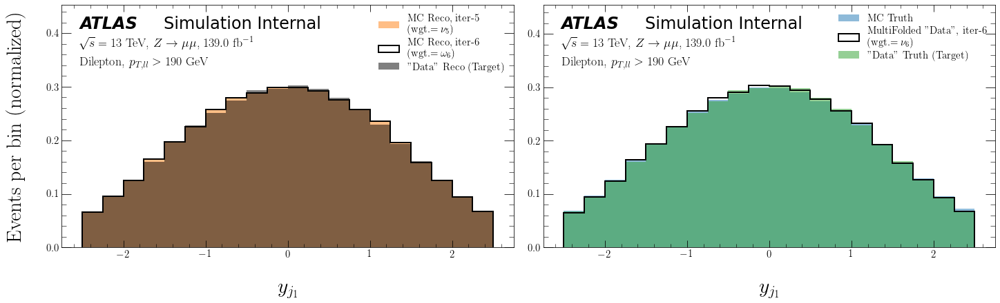

ITERATION 7:


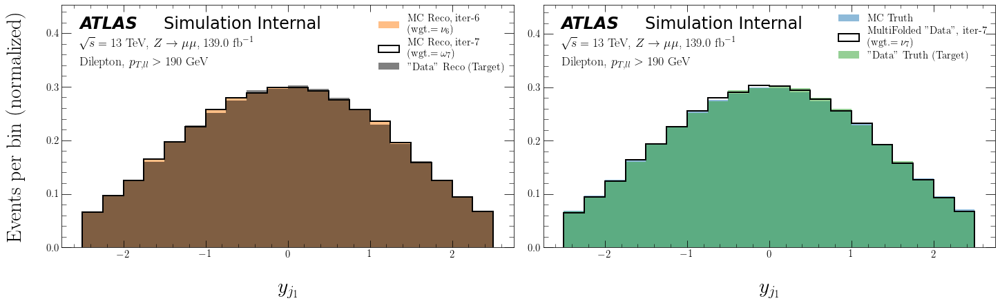

ITERATION 8:


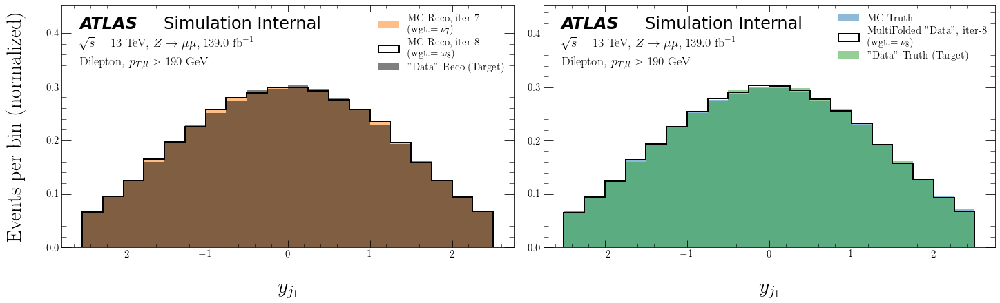

ITERATION 9:


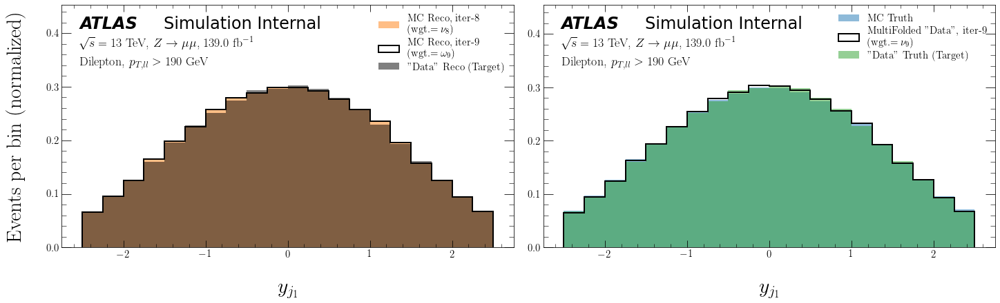

ITERATION 10:


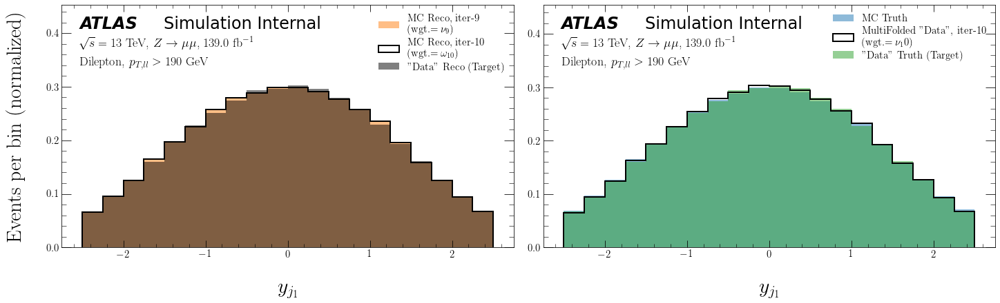

y_trackj2 Results

ITERATION 1:


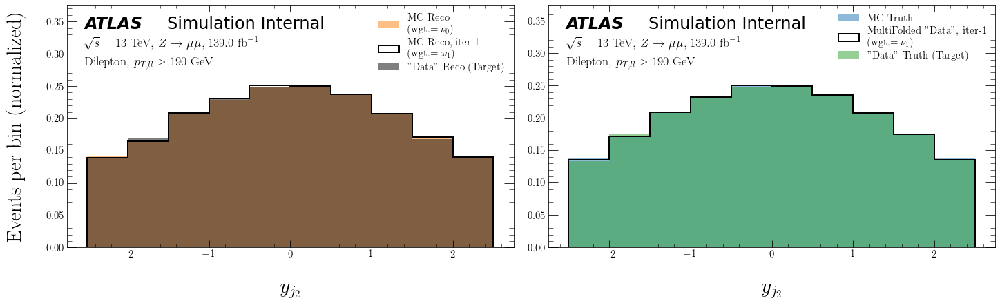

ITERATION 2:


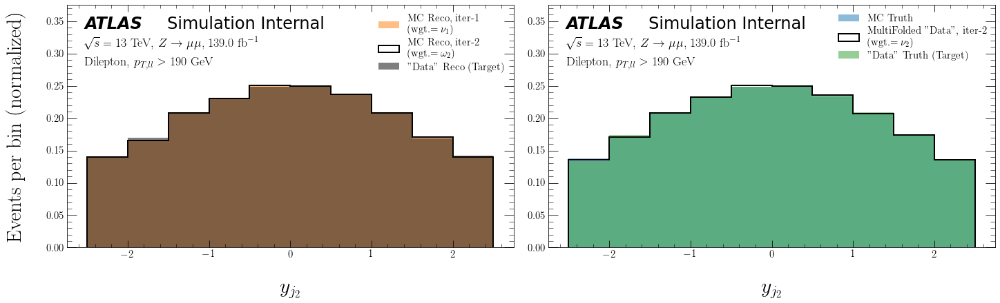

ITERATION 3:


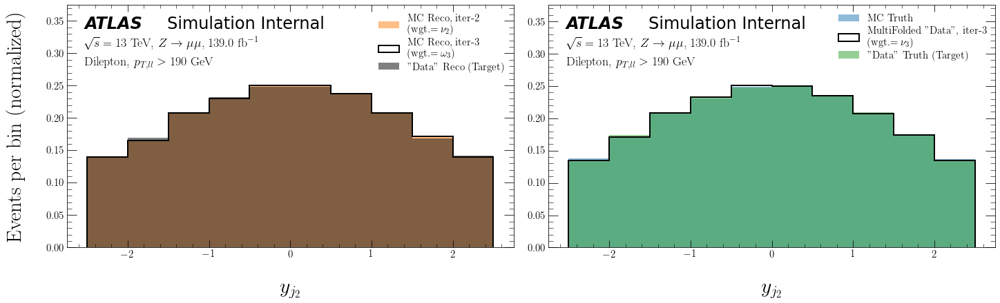

ITERATION 4:


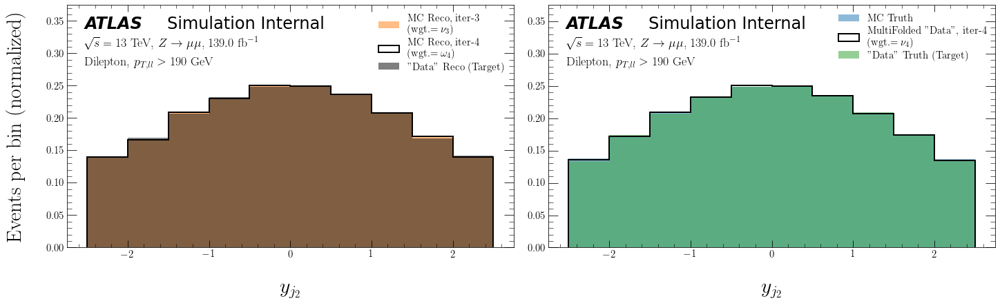

ITERATION 5:


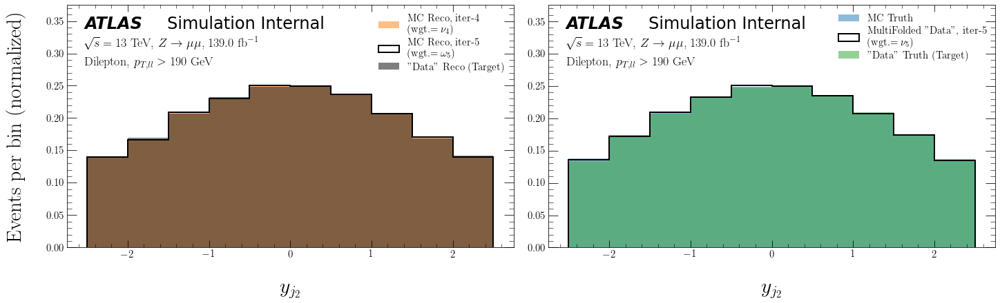

ITERATION 6:


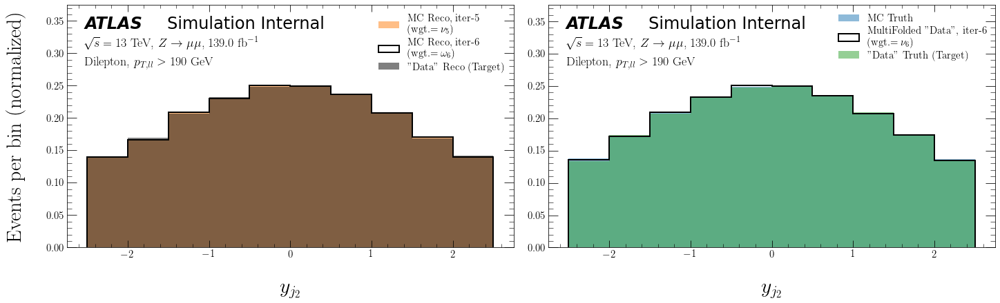

ITERATION 7:


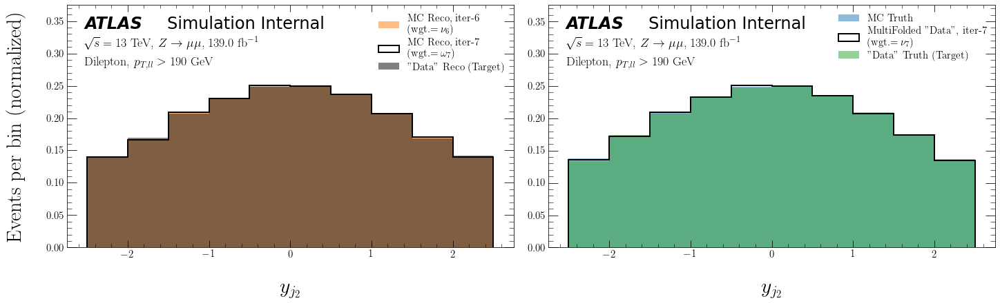

ITERATION 8:


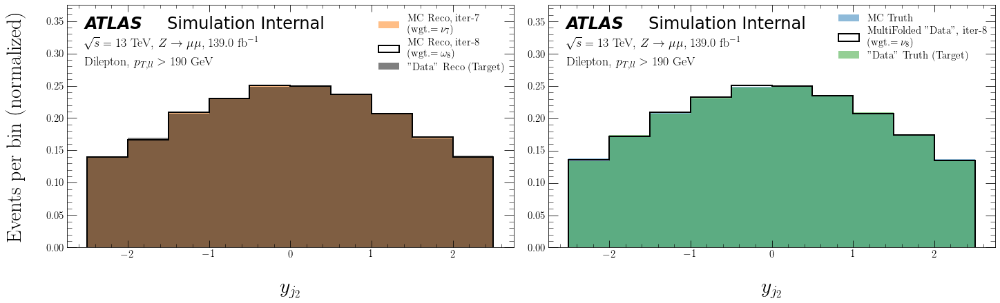

ITERATION 9:


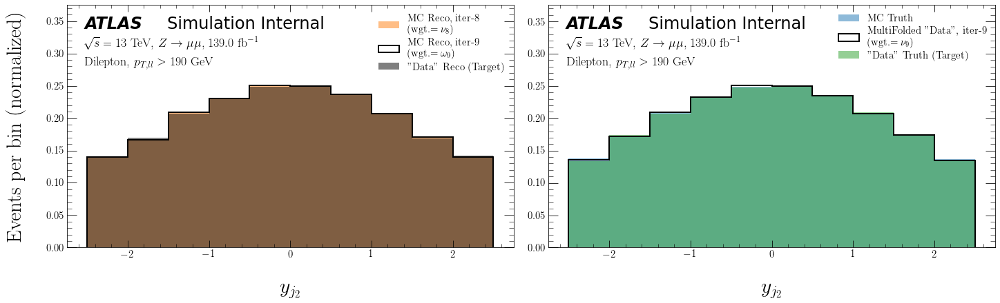

ITERATION 10:


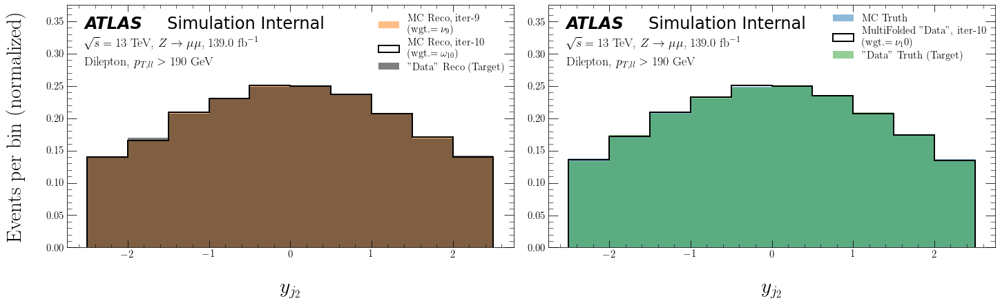

phi_trackj1 Results

ITERATION 1:


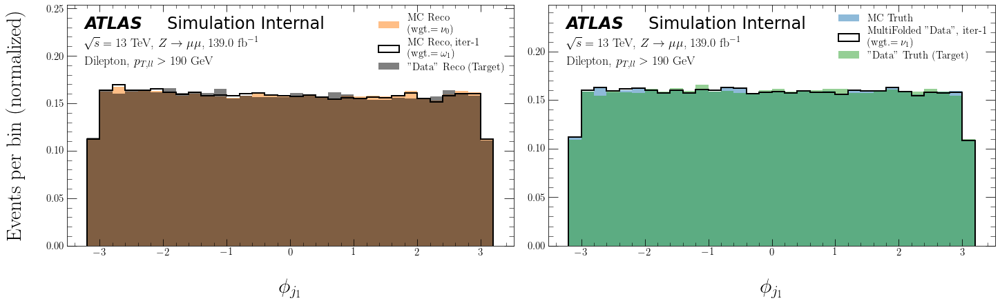

ITERATION 2:


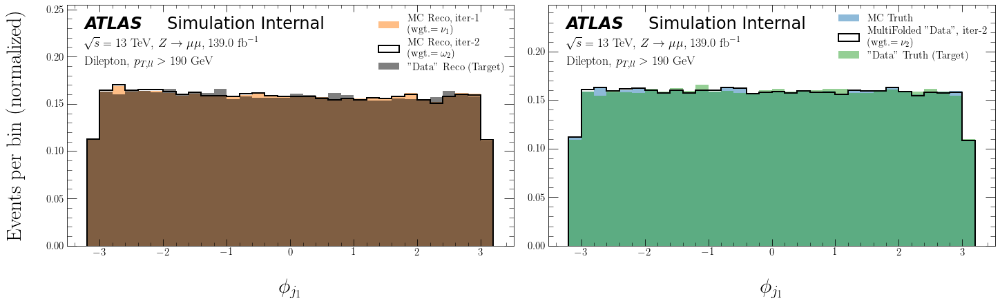

ITERATION 3:


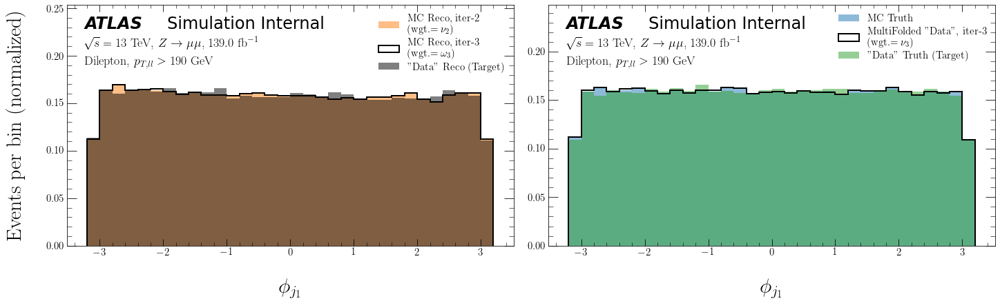

ITERATION 4:


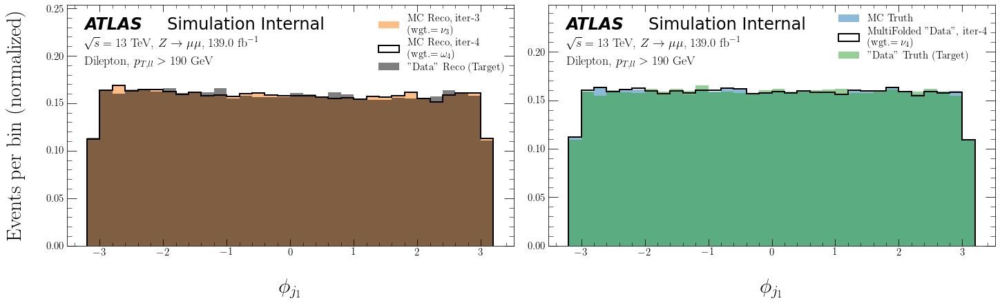

ITERATION 5:


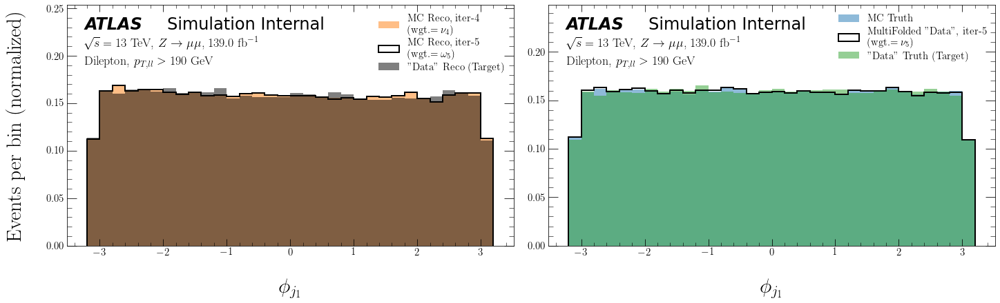

ITERATION 6:


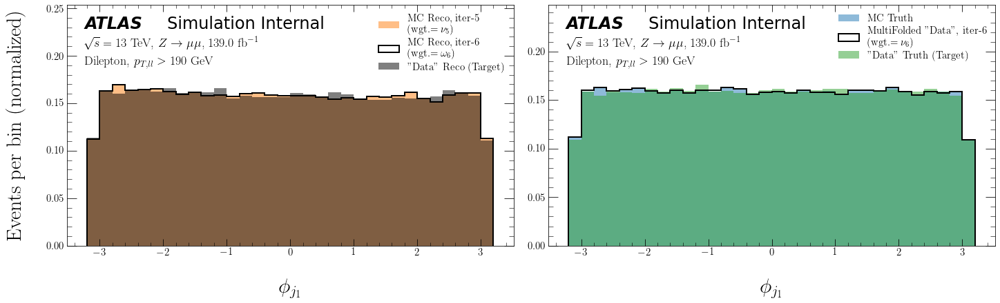

ITERATION 7:


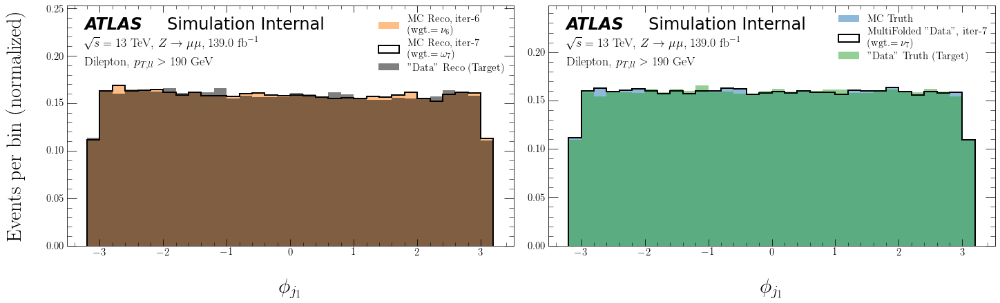

ITERATION 8:


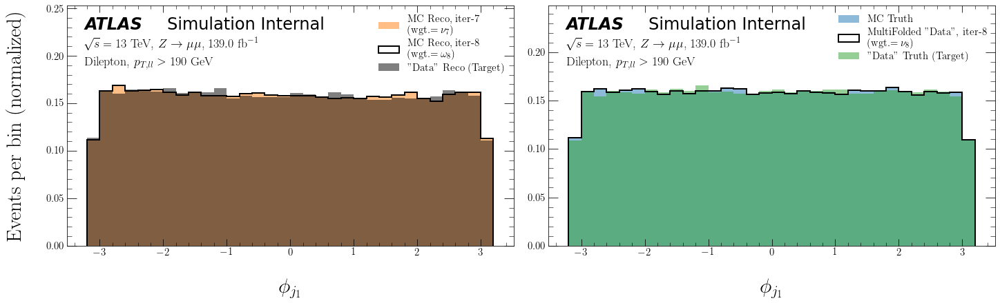

ITERATION 9:


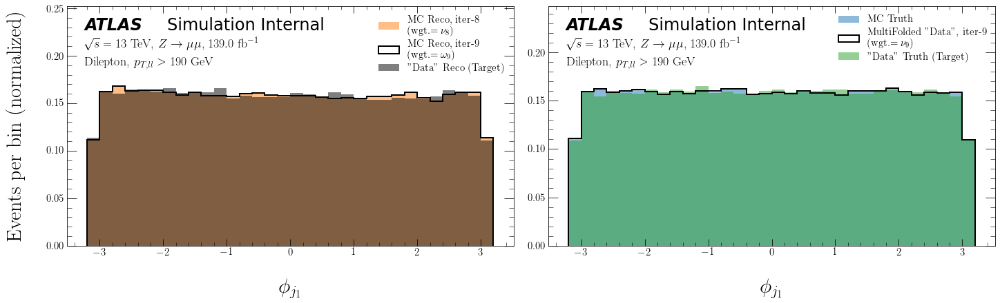

ITERATION 10:


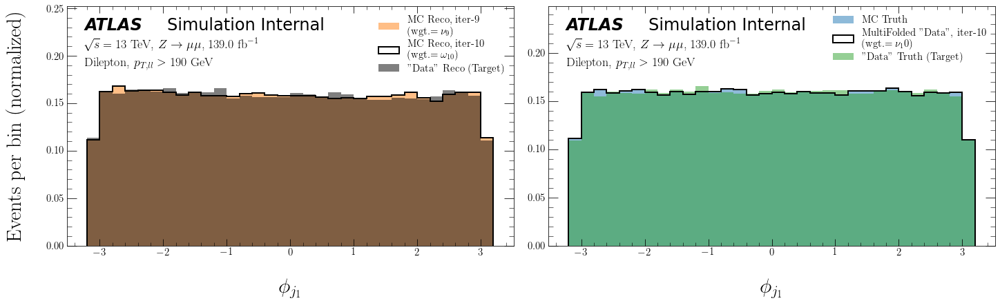

phi_trackj2 Results

ITERATION 1:


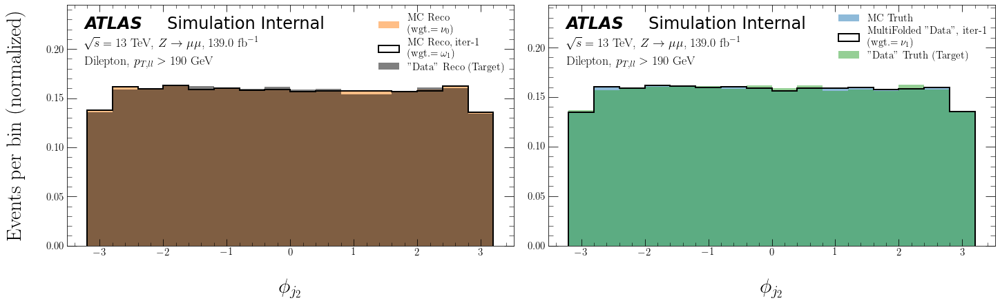

ITERATION 2:


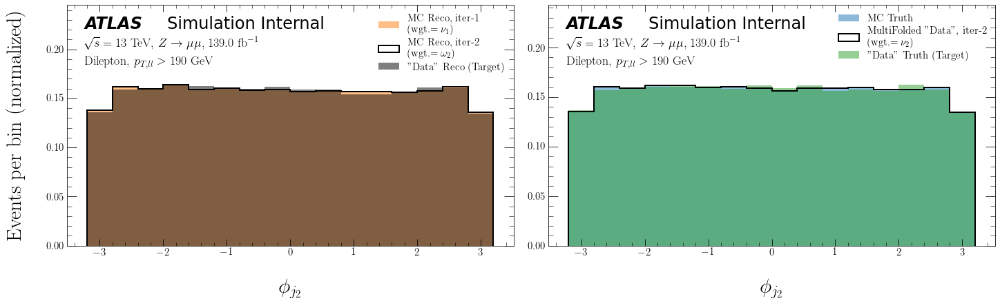

ITERATION 3:


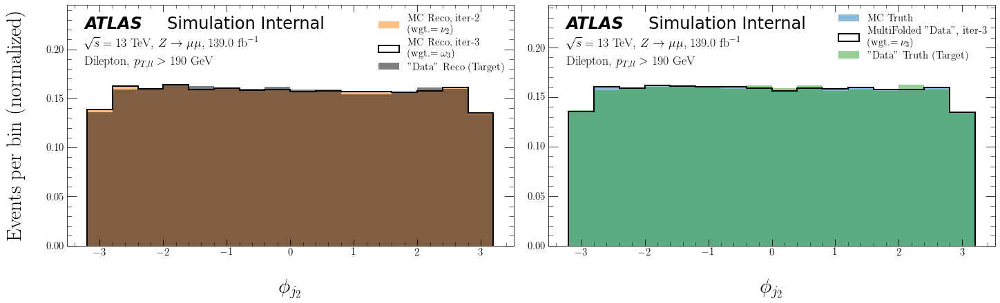

ITERATION 4:


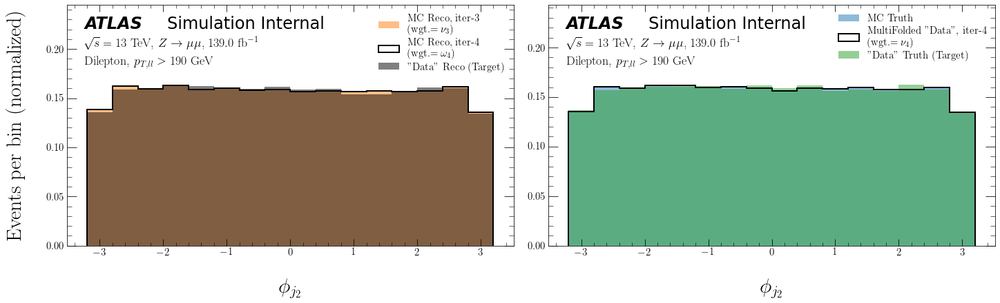

ITERATION 5:


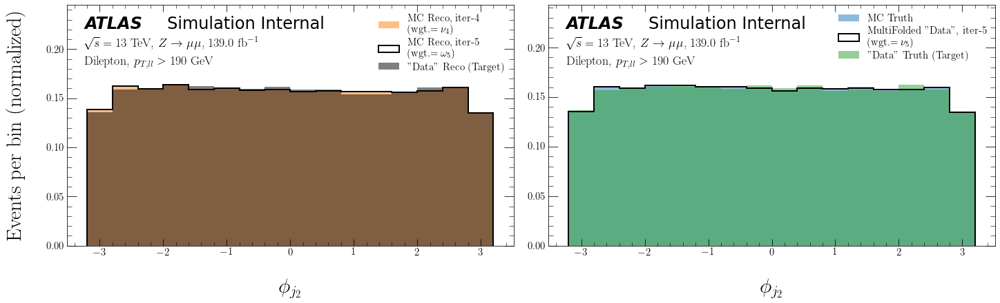

ITERATION 6:


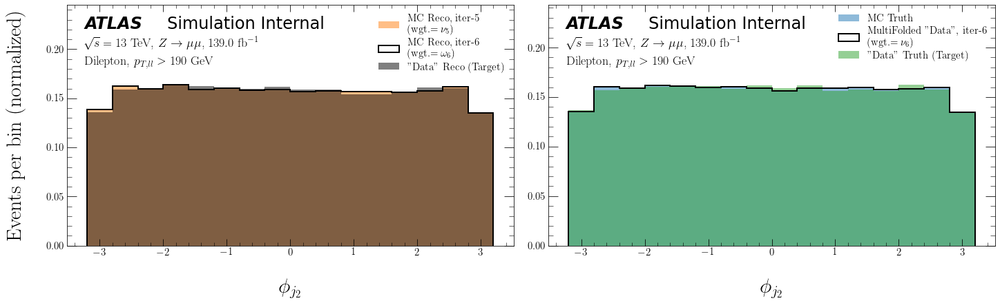

ITERATION 7:


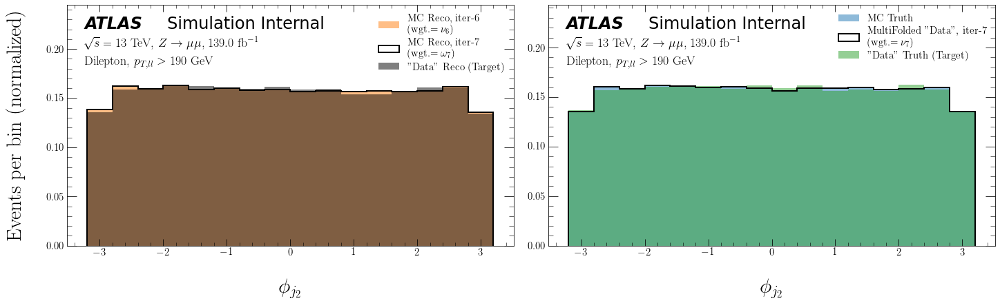

ITERATION 8:


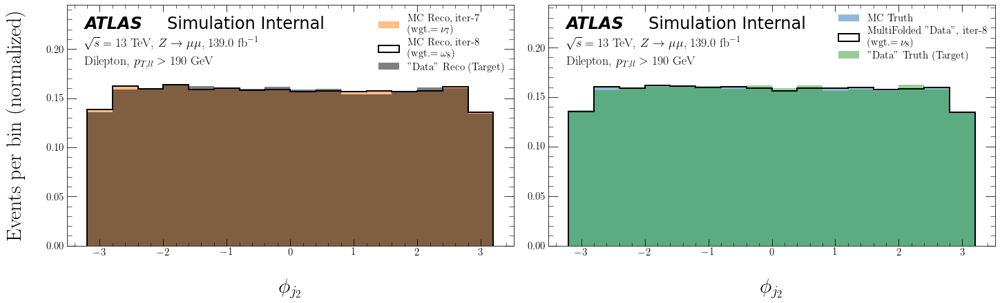

ITERATION 9:


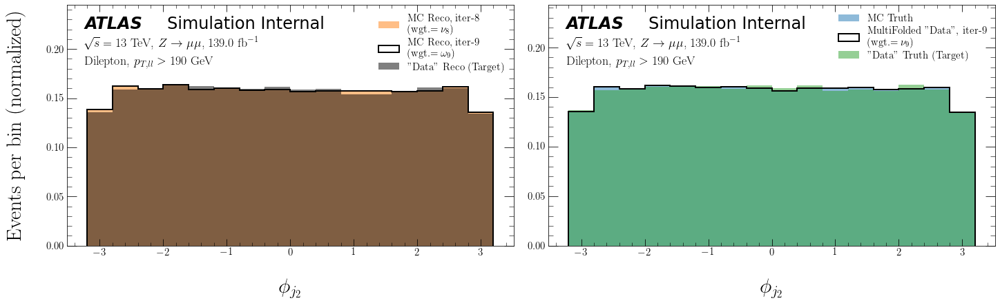

ITERATION 10:


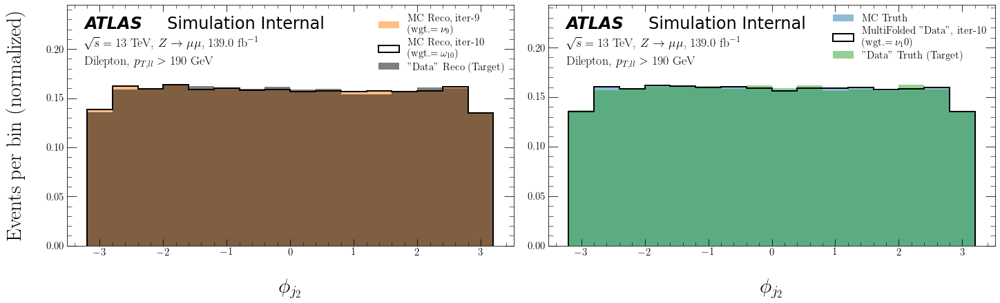

tau1_trackj1 Results

ITERATION 1:


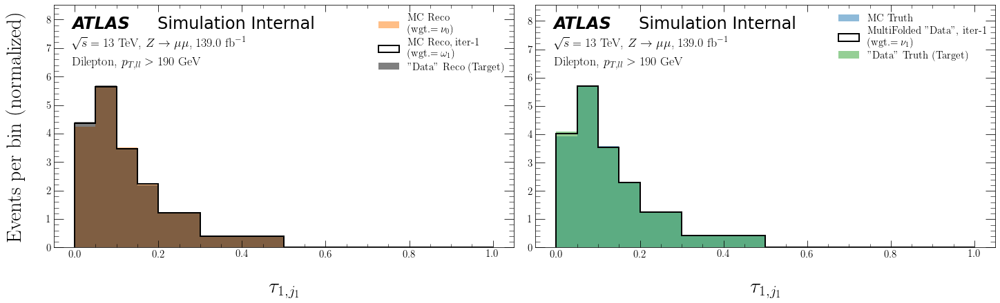

ITERATION 2:


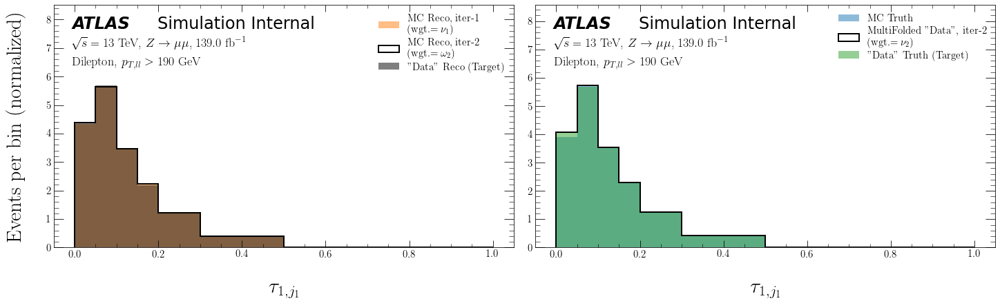

ITERATION 3:


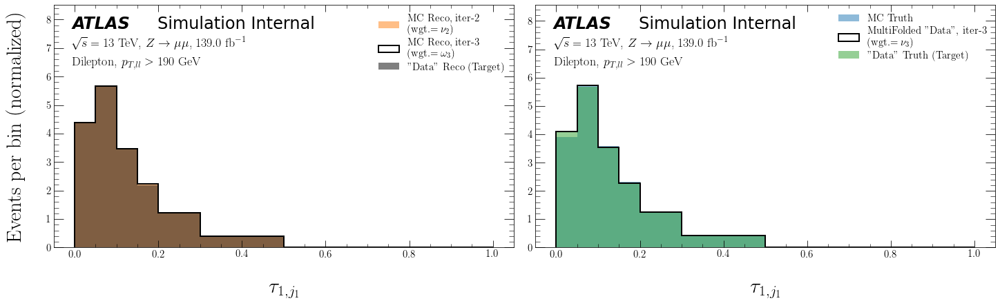

ITERATION 4:


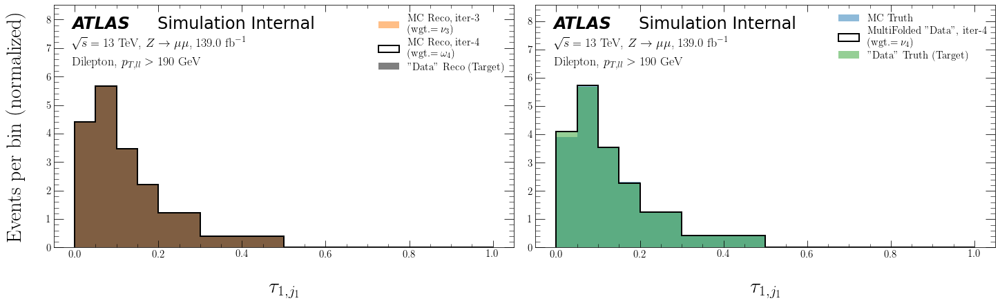

ITERATION 5:


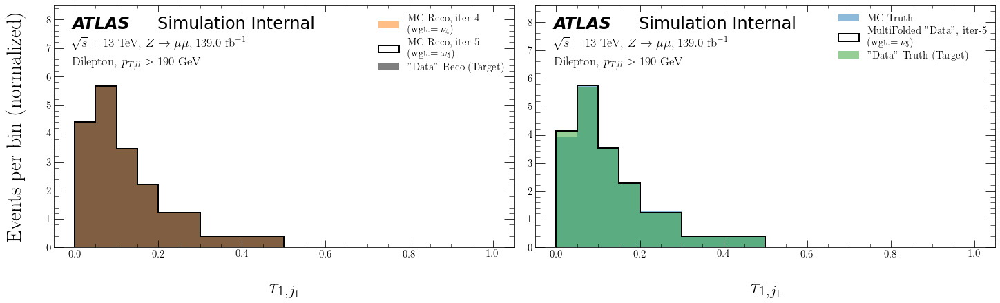

ITERATION 6:


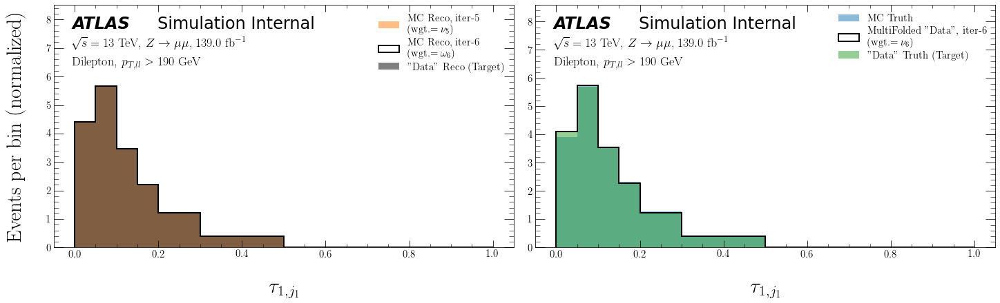

ITERATION 7:


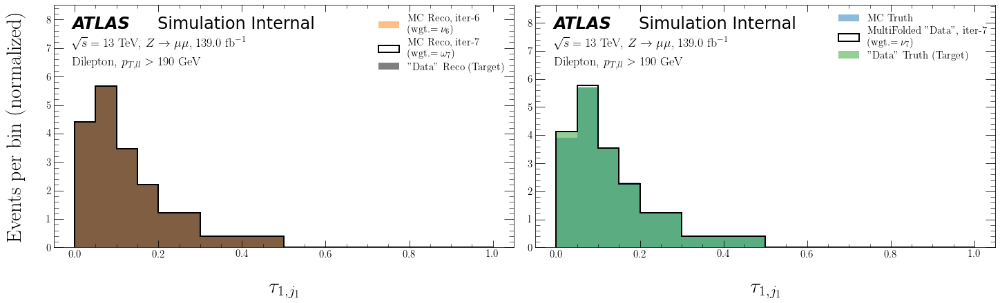

ITERATION 8:


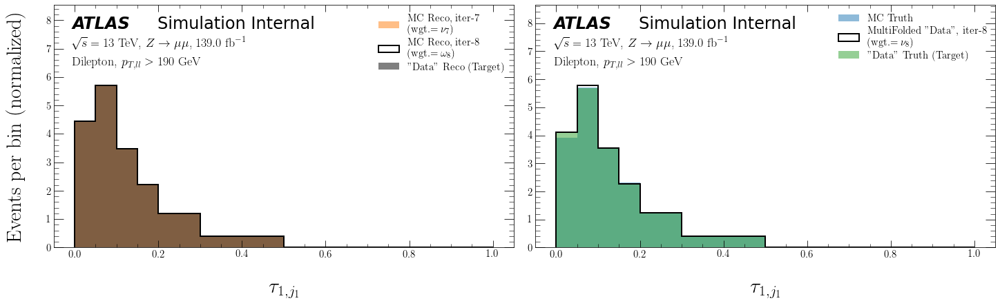

ITERATION 9:


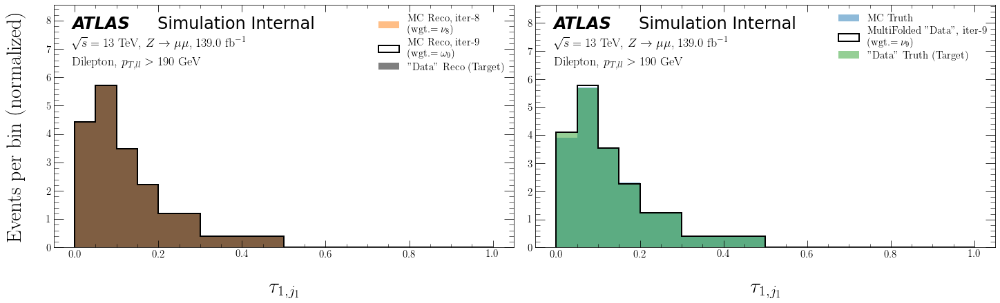

ITERATION 10:


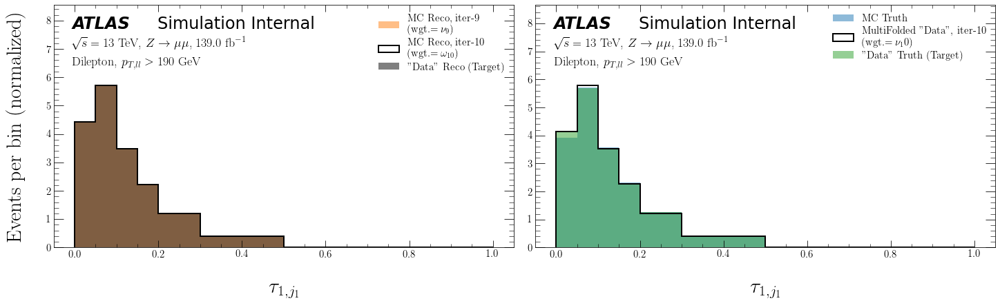

tau1_trackj2 Results

ITERATION 1:


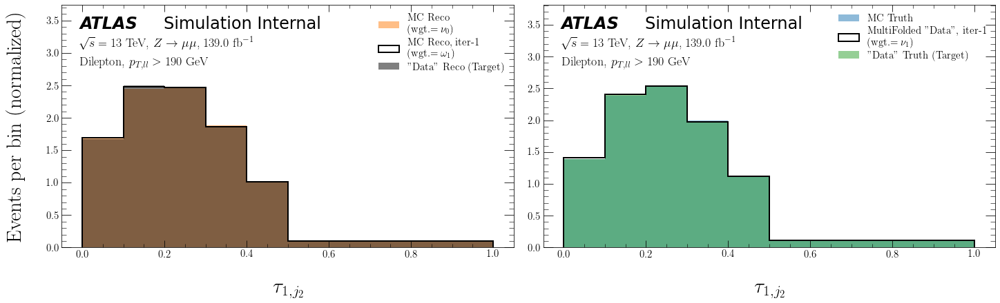

ITERATION 2:


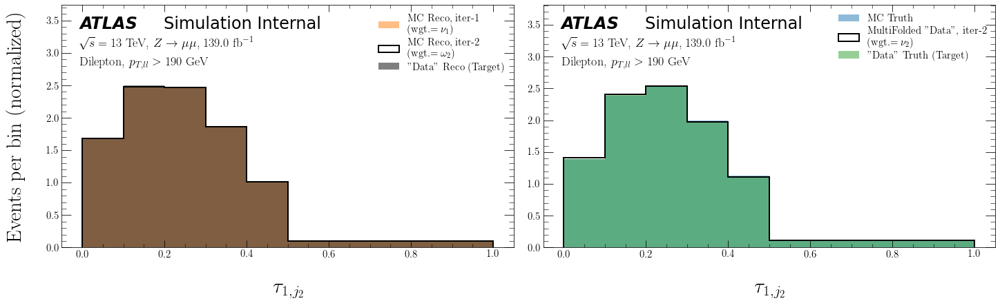

ITERATION 3:


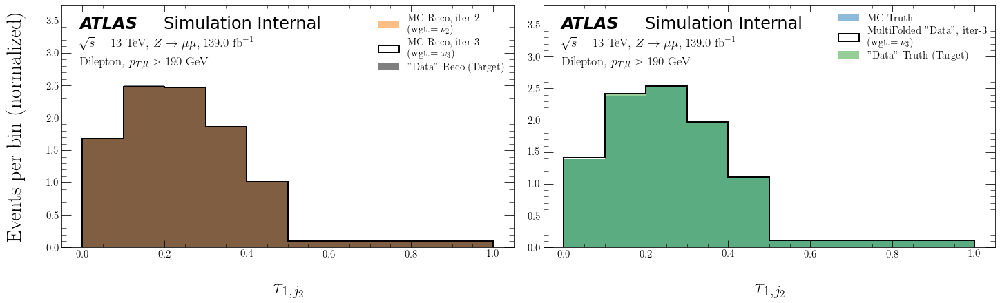

ITERATION 4:


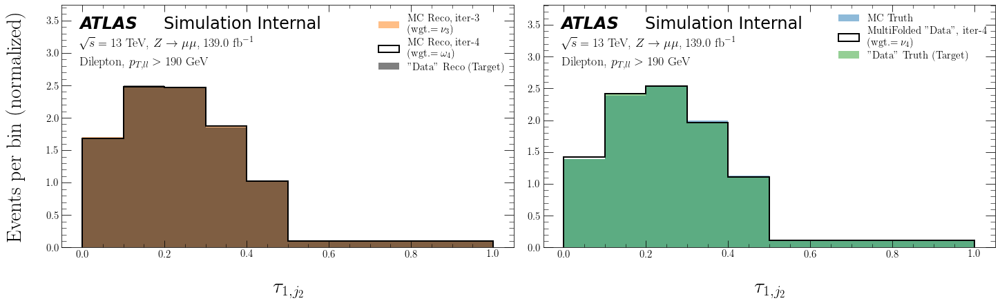

ITERATION 5:


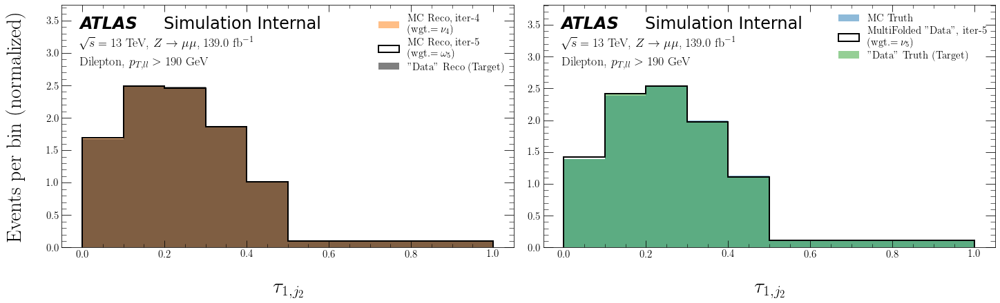

ITERATION 6:


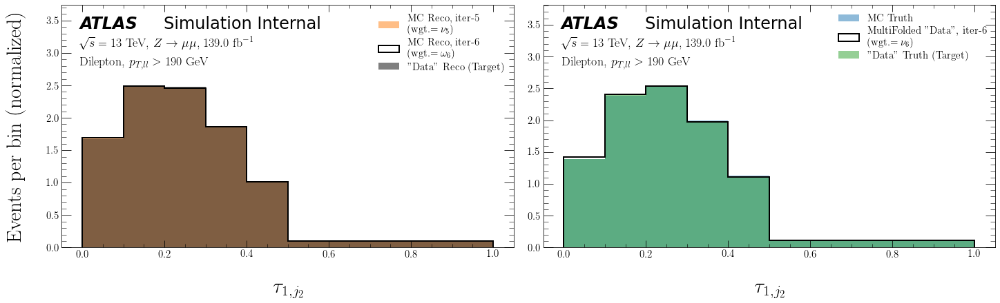

ITERATION 7:


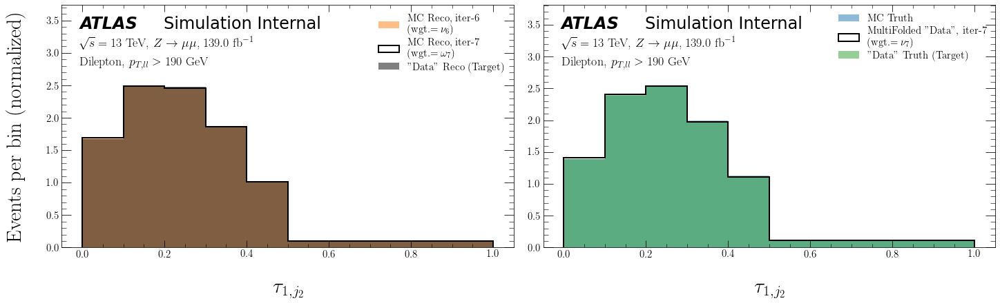

ITERATION 8:


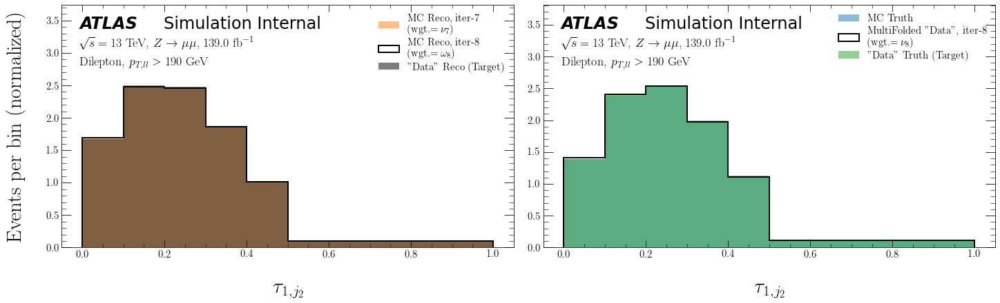

ITERATION 9:


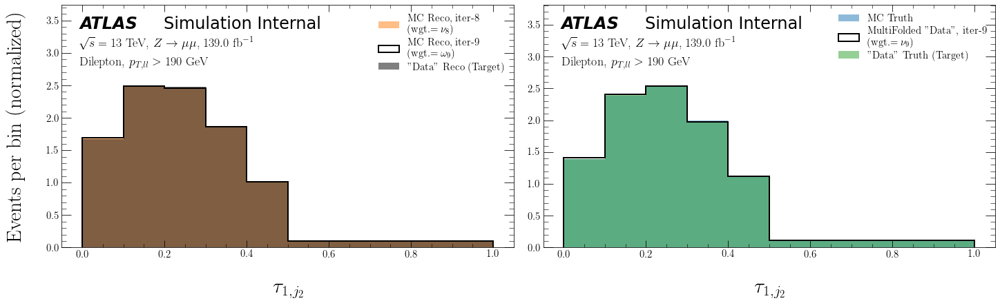

ITERATION 10:


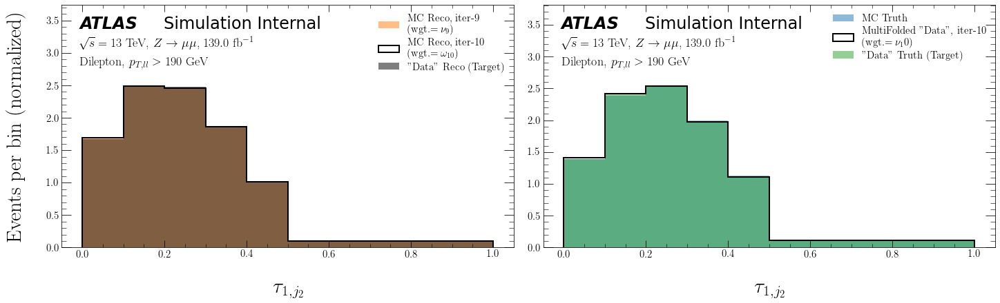

tau2_trackj1 Results

ITERATION 1:


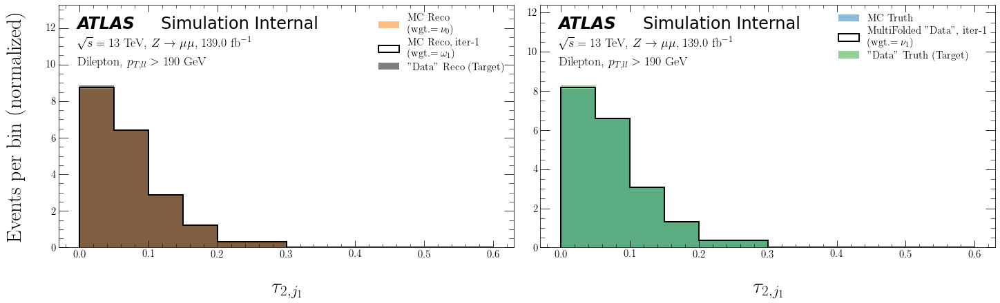

ITERATION 2:


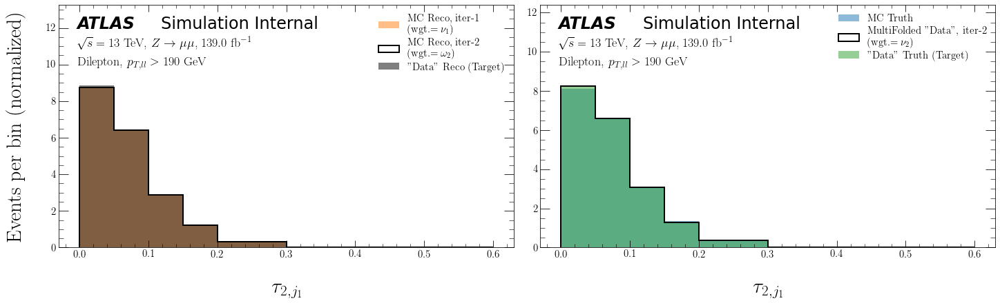

ITERATION 3:


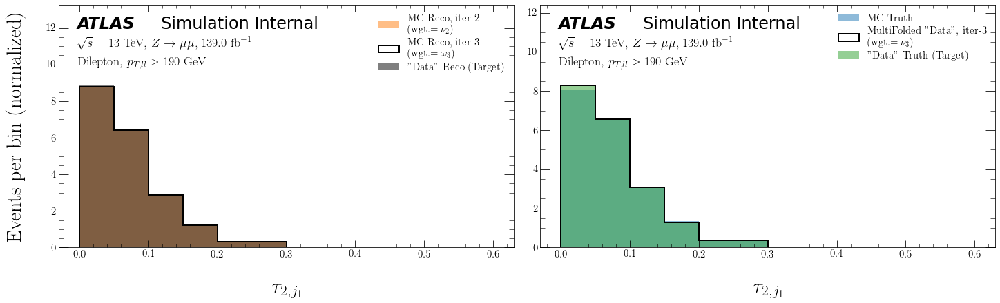

ITERATION 4:


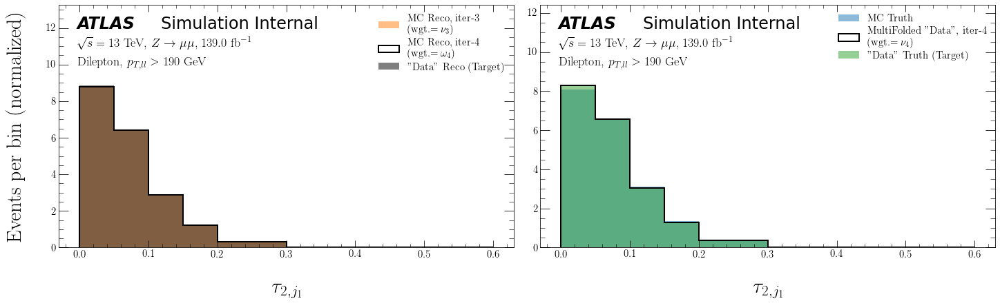

ITERATION 5:


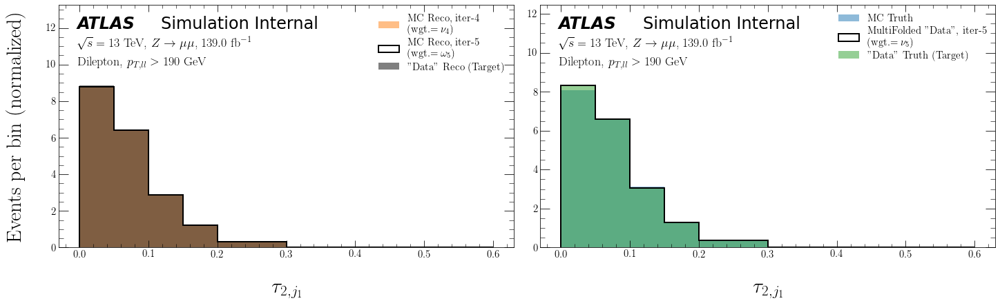

ITERATION 6:


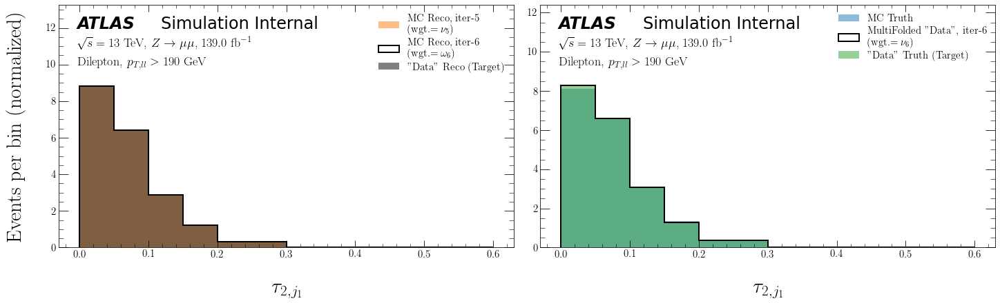

ITERATION 7:


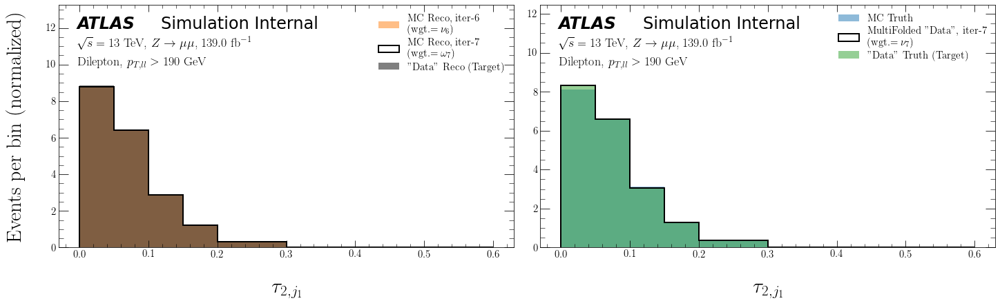

ITERATION 8:


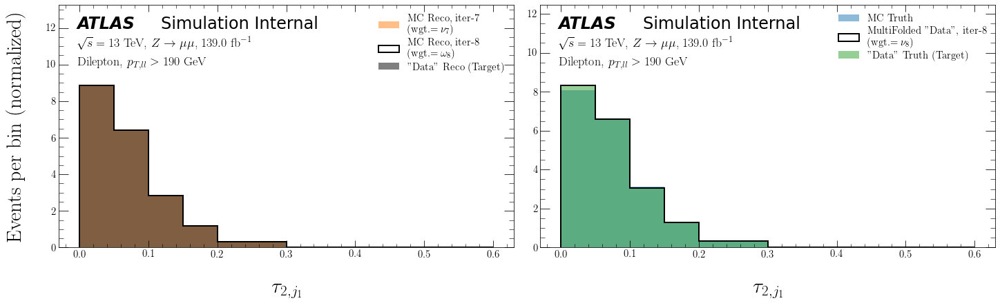

ITERATION 9:


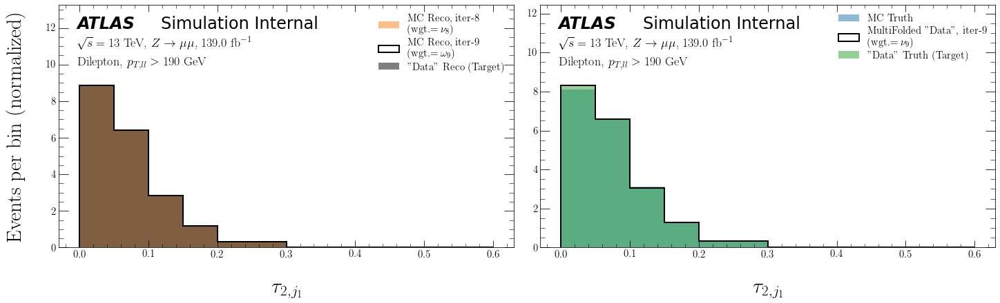

ITERATION 10:


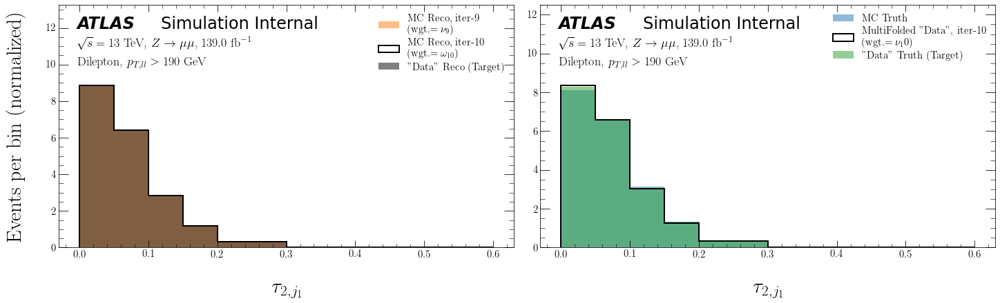

tau2_trackj2 Results

ITERATION 1:


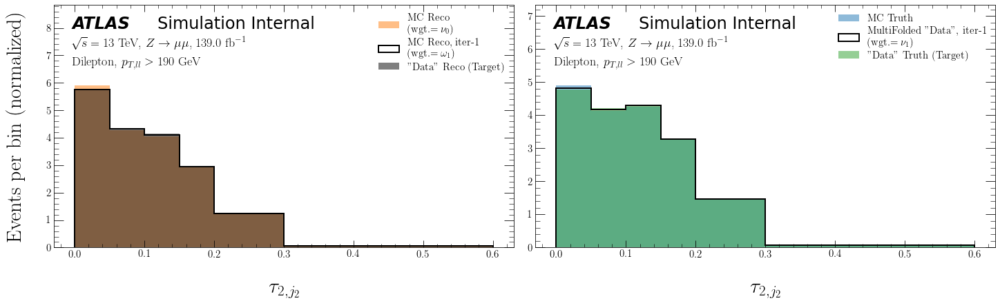

ITERATION 2:


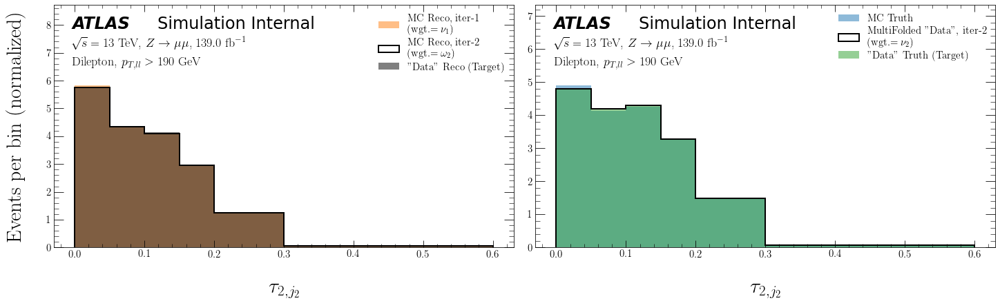

ITERATION 3:


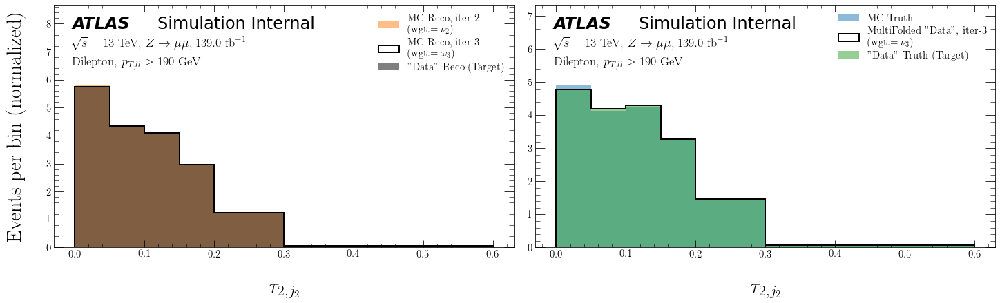

ITERATION 4:


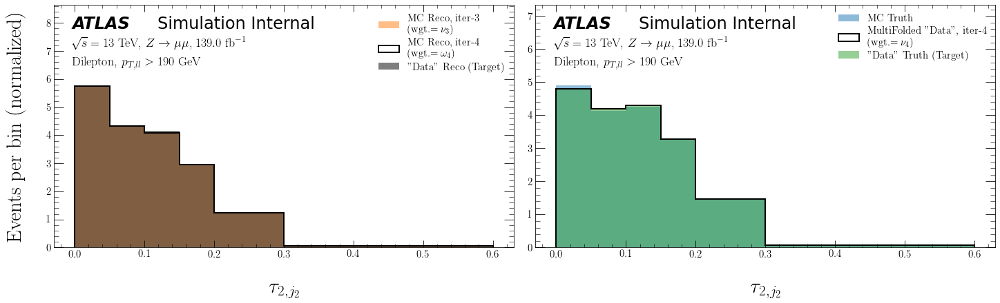

ITERATION 5:


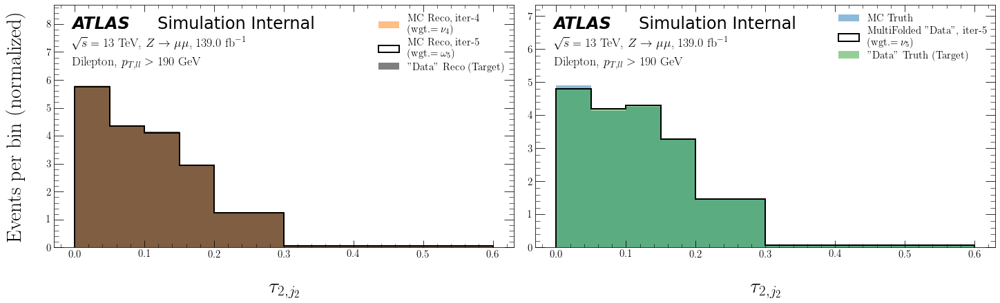

ITERATION 6:


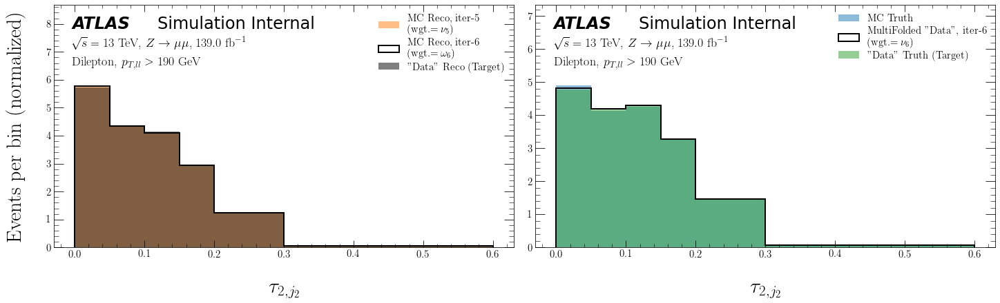

ITERATION 7:


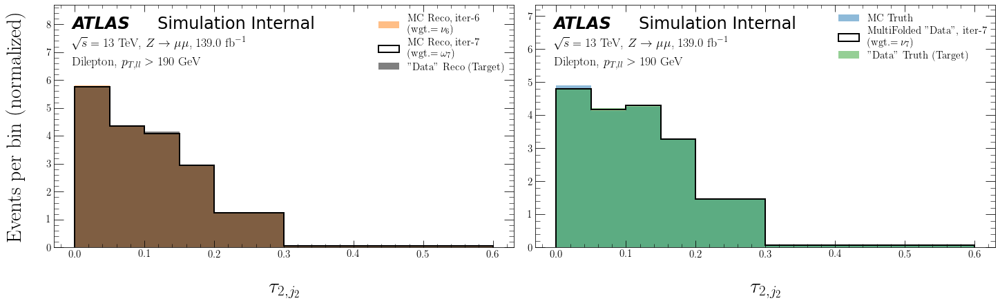

ITERATION 8:


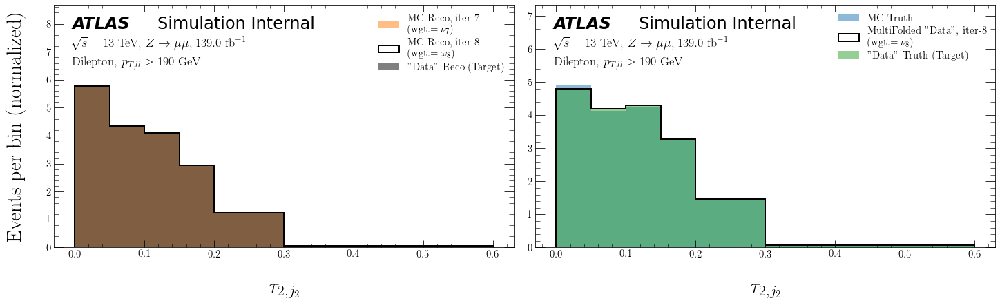

ITERATION 9:


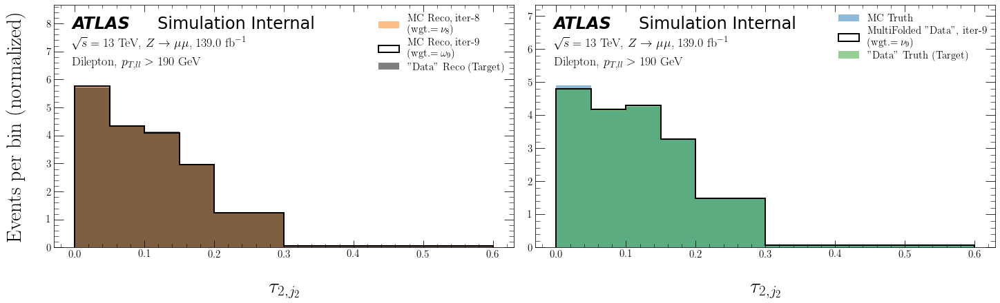

ITERATION 10:


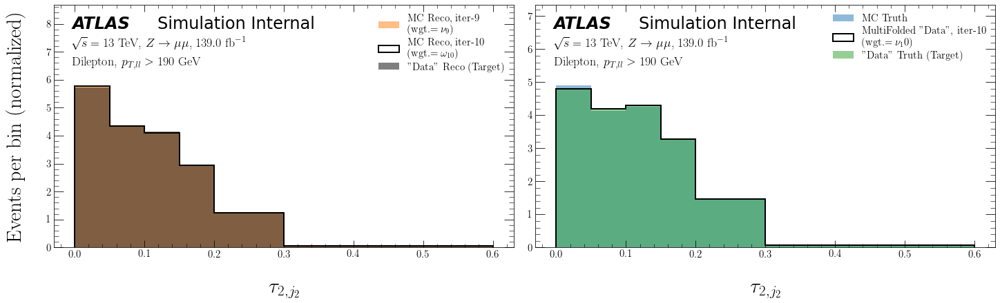

tau3_trackj1 Results

ITERATION 1:


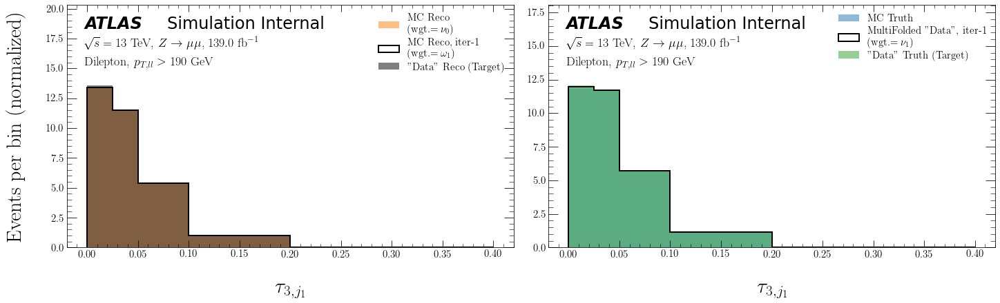

ITERATION 2:


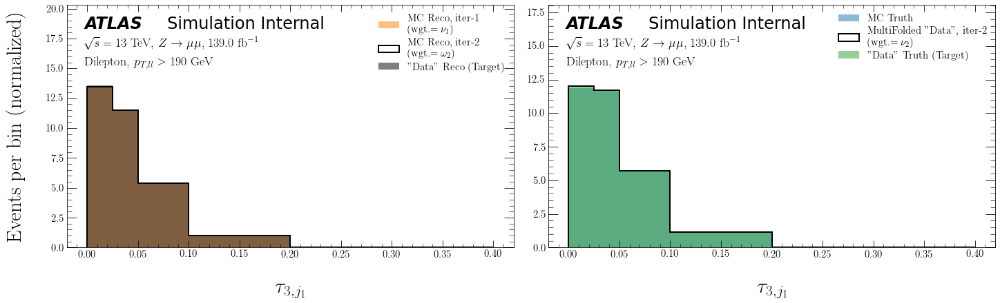

ITERATION 3:


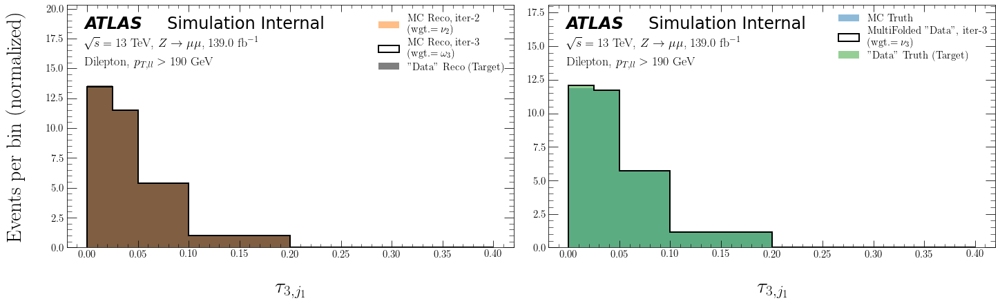

ITERATION 4:


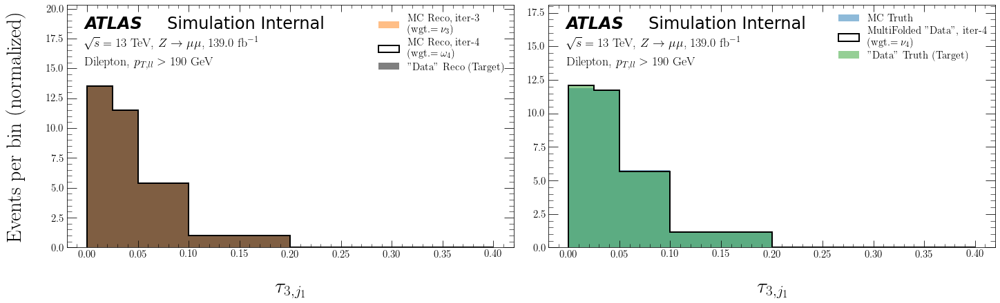

ITERATION 5:


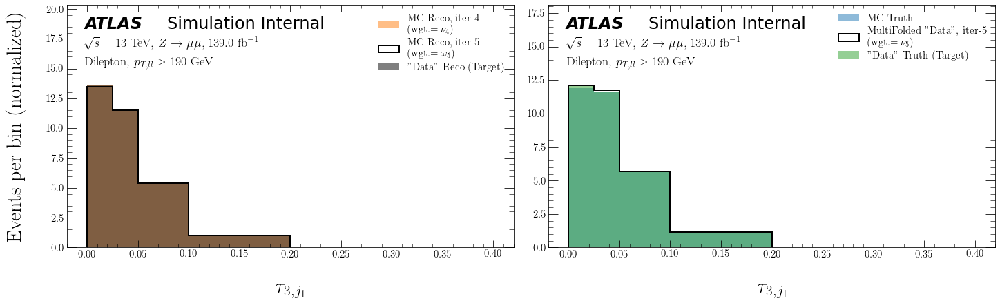

ITERATION 6:


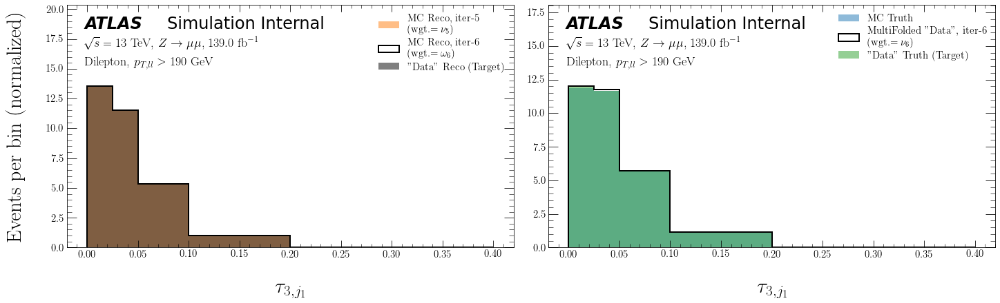

ITERATION 7:


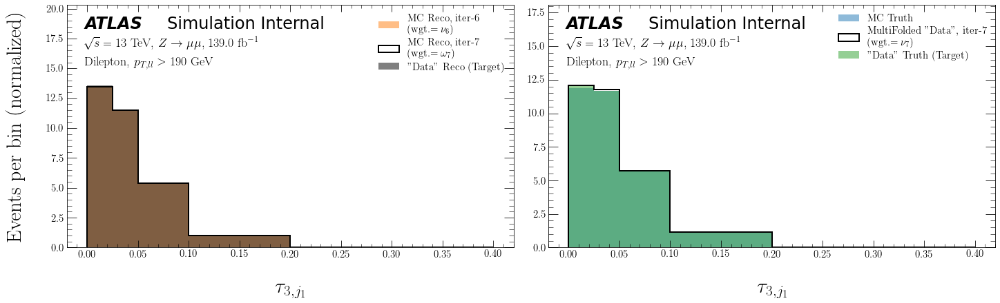

ITERATION 8:


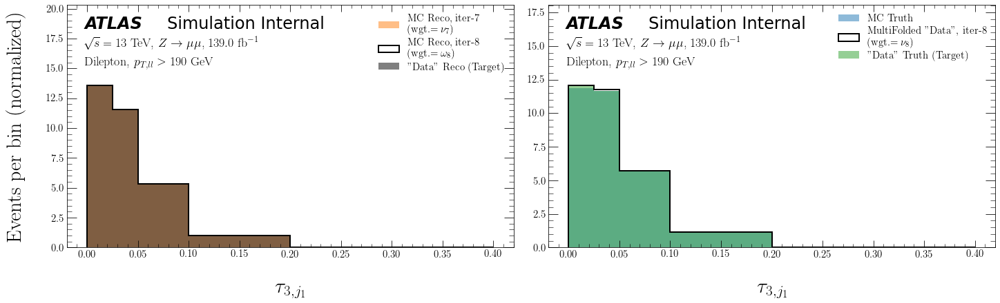

ITERATION 9:


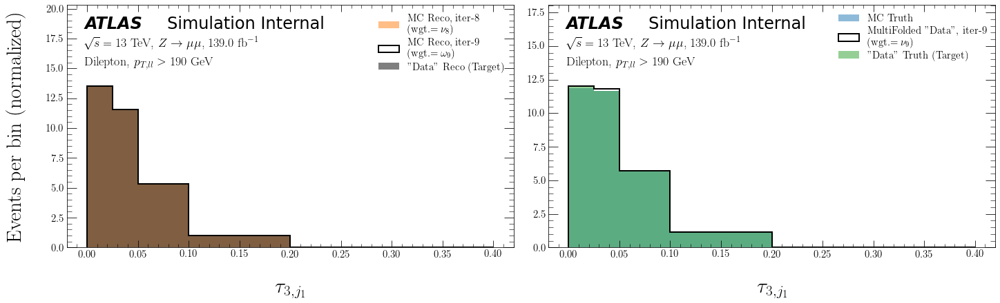

ITERATION 10:


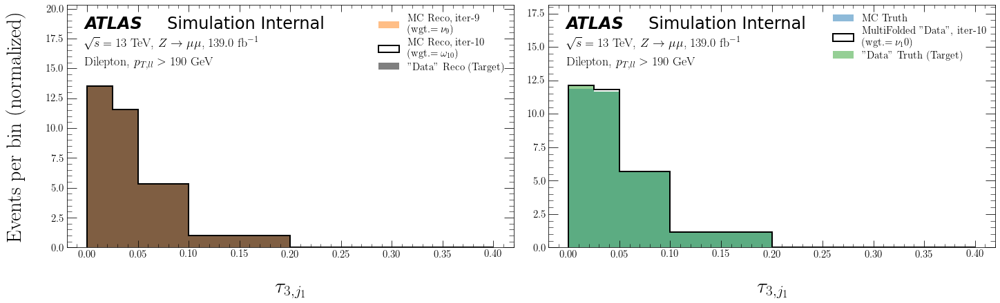

tau3_trackj2 Results

ITERATION 1:


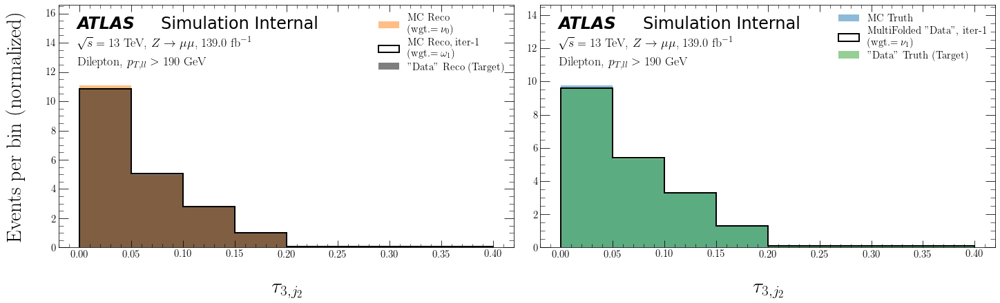

ITERATION 2:


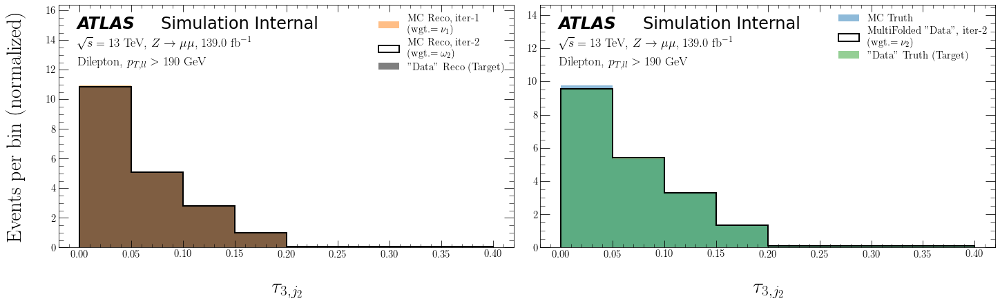

ITERATION 3:


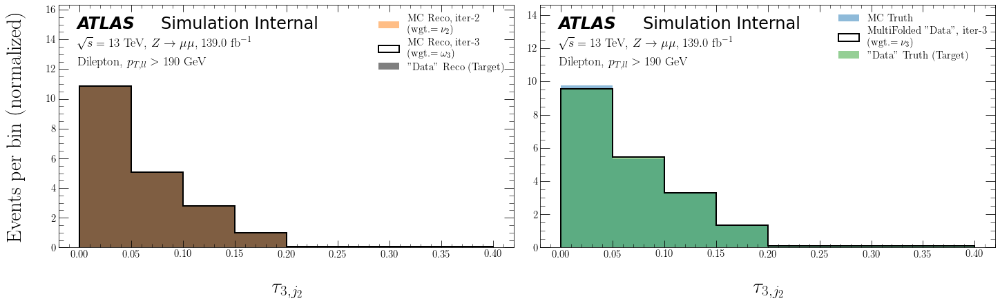

ITERATION 4:


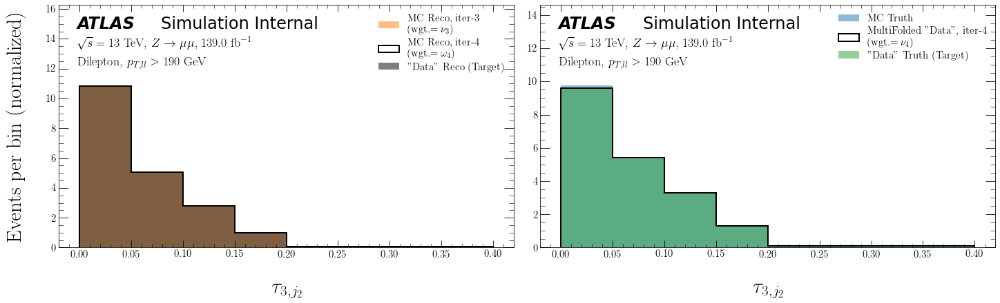

ITERATION 5:


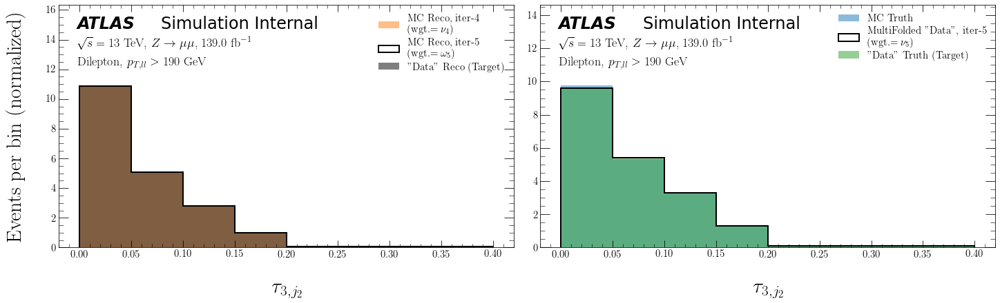

ITERATION 6:


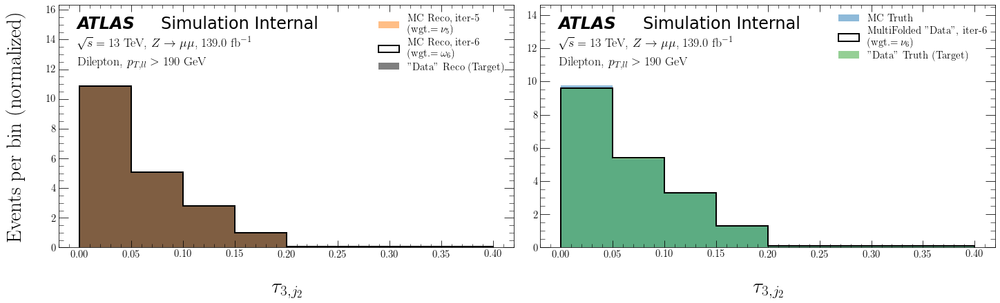

ITERATION 7:


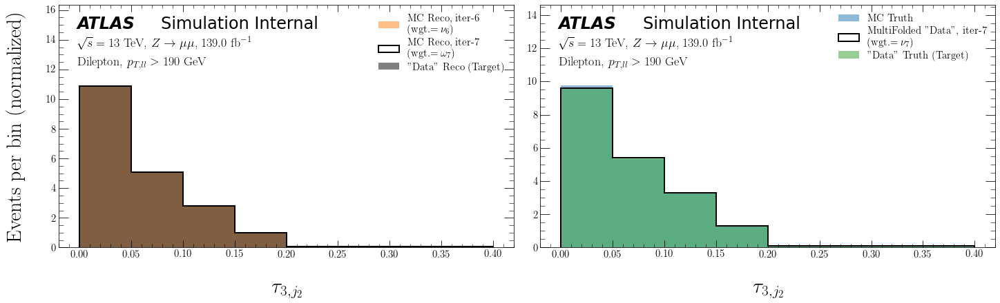

ITERATION 8:


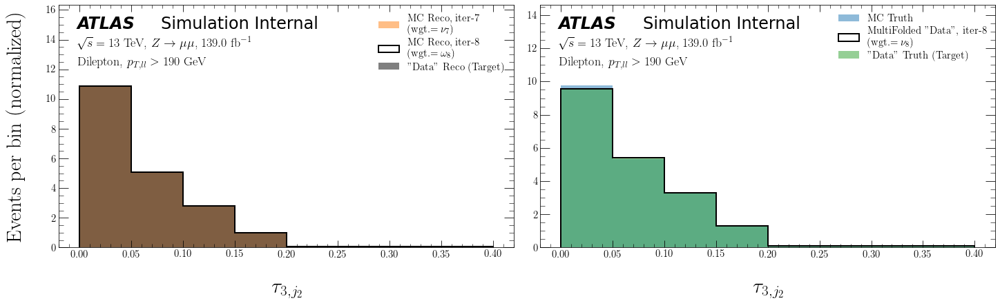

ITERATION 9:


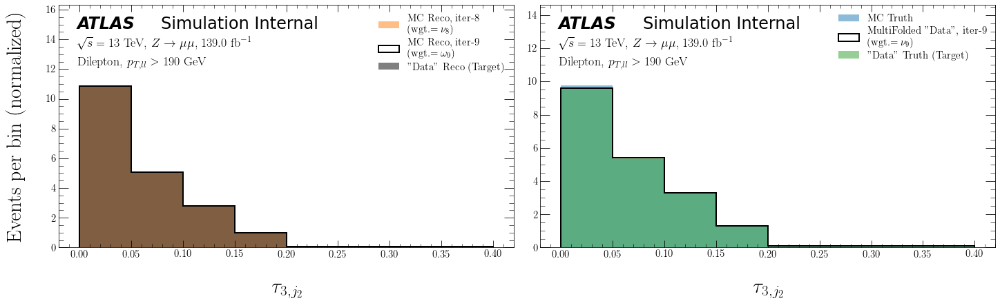

ITERATION 10:


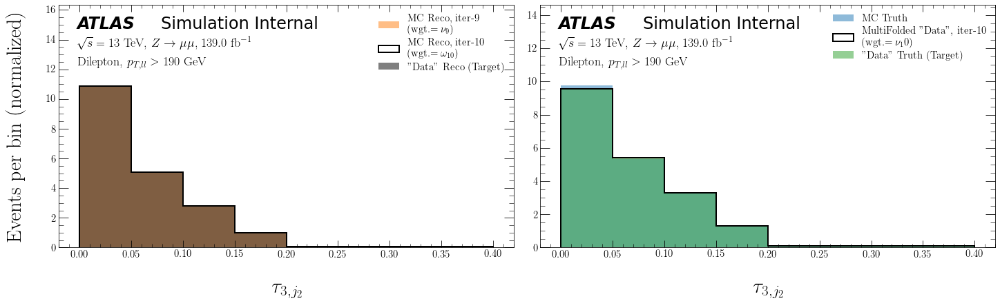

pT_ll Results

ITERATION 1:


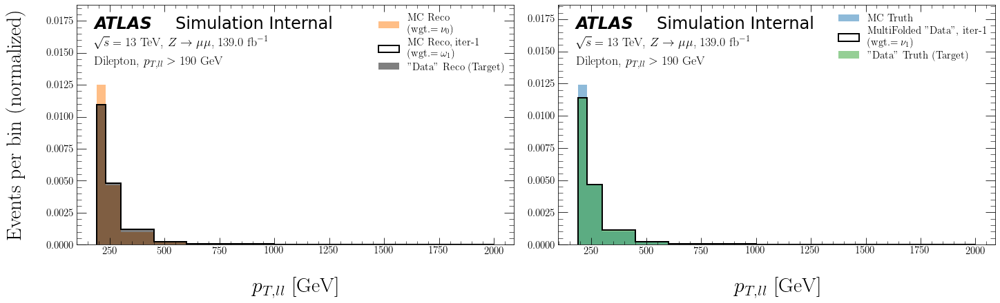

ITERATION 2:


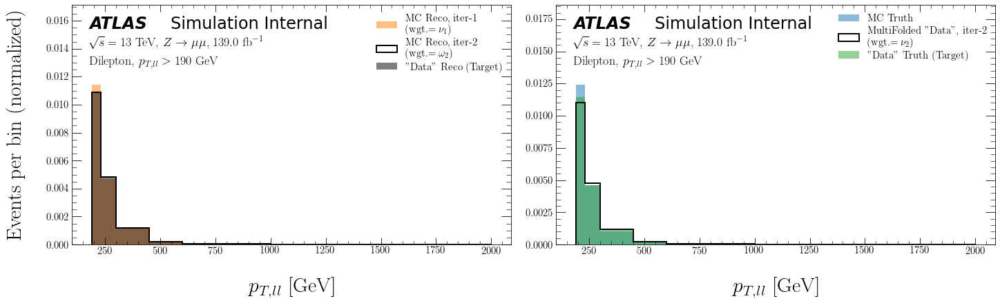

ITERATION 3:


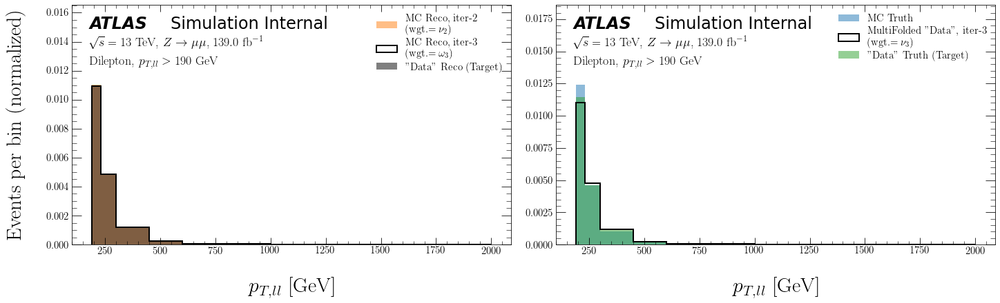

ITERATION 4:


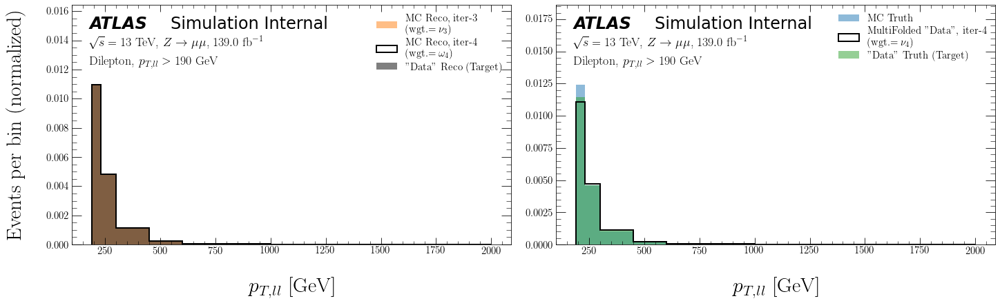

ITERATION 5:


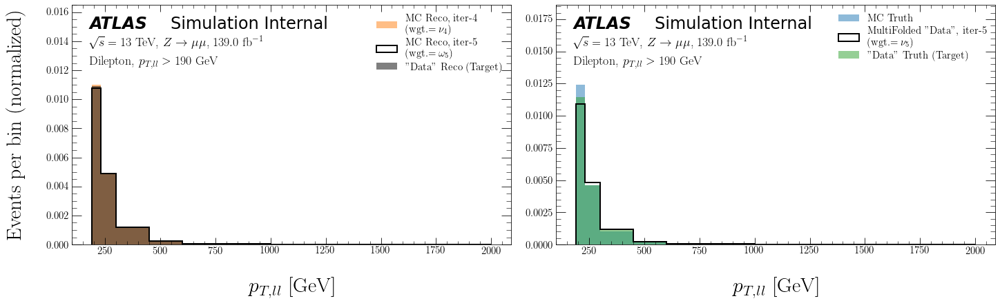

ITERATION 6:


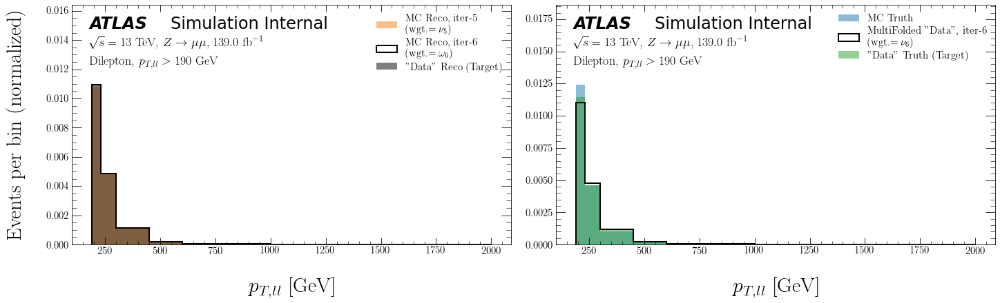

ITERATION 7:


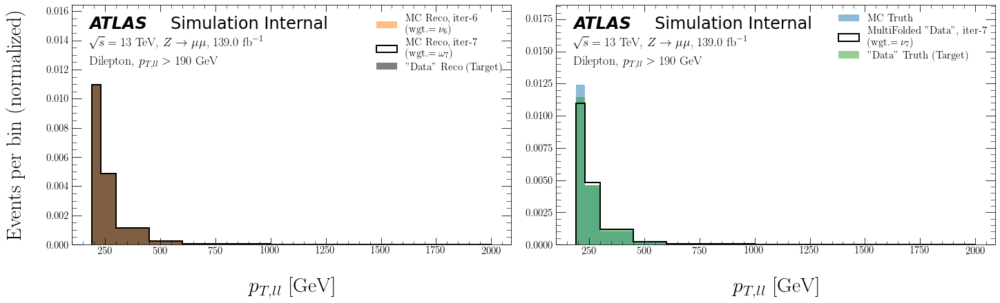

ITERATION 8:


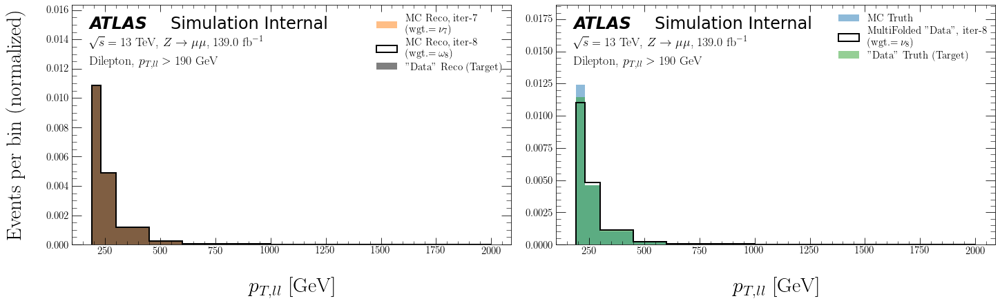

ITERATION 9:


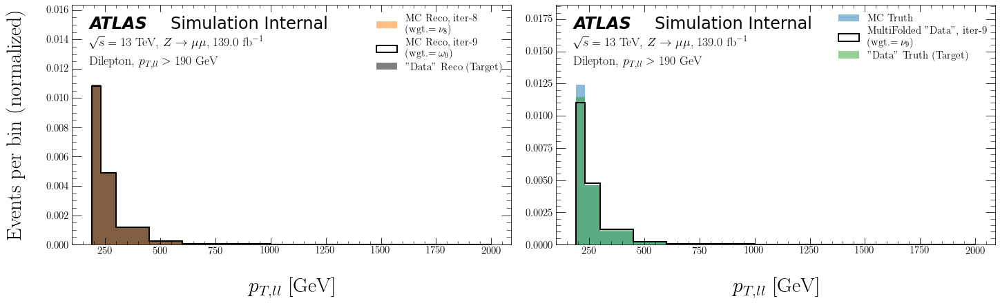

ITERATION 10:


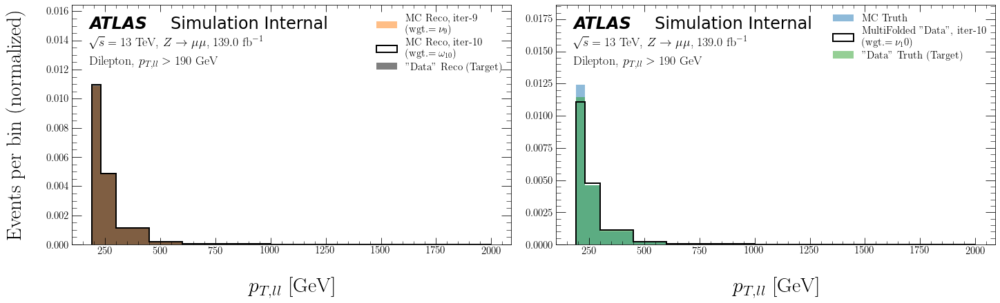

y_ll Results

ITERATION 1:


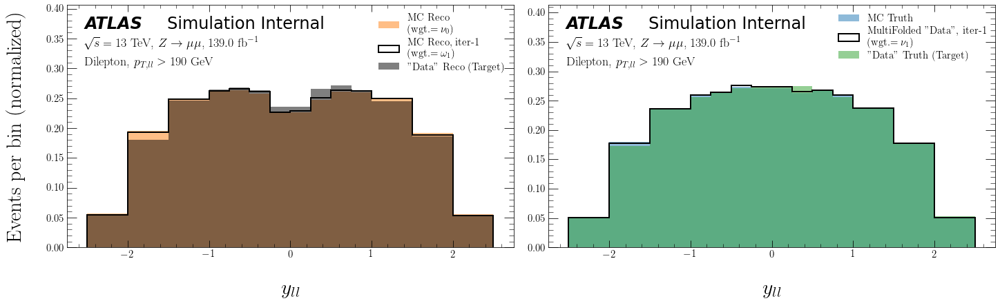

ITERATION 2:


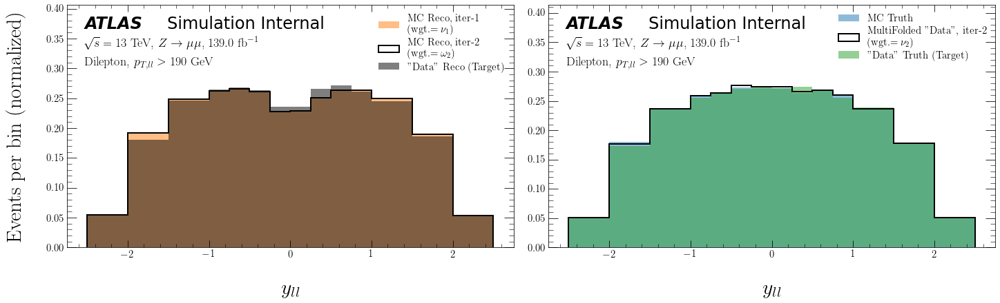

ITERATION 3:


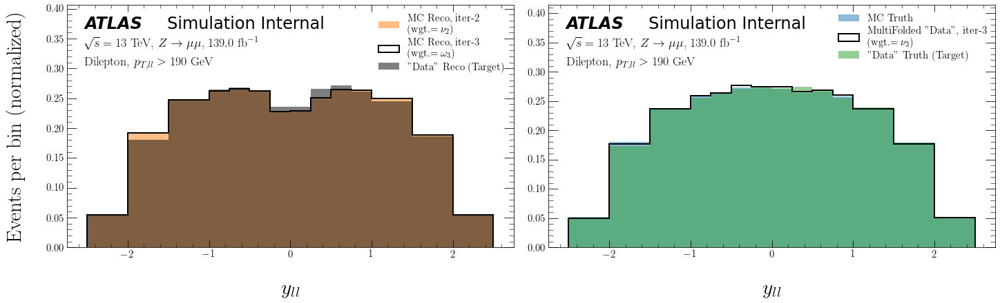

ITERATION 4:


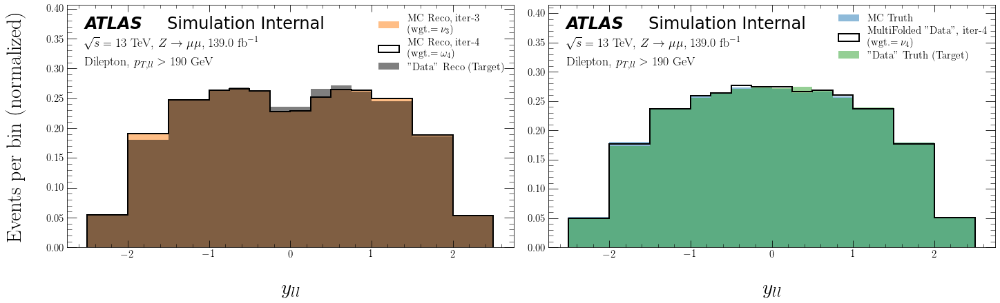

ITERATION 5:


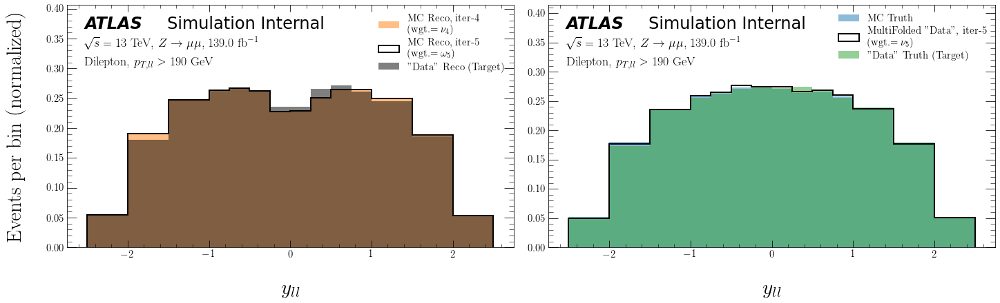

ITERATION 6:


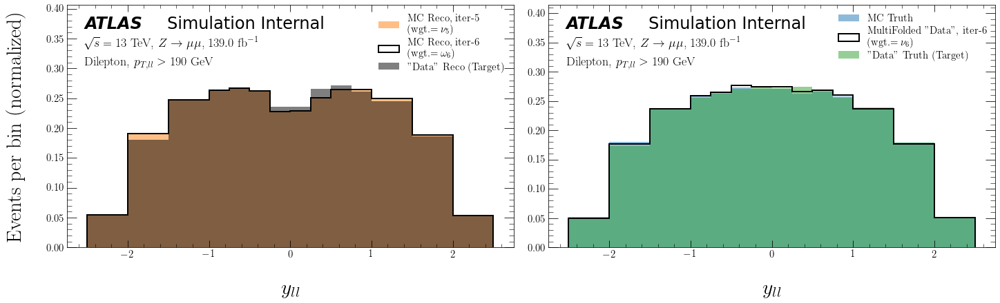

ITERATION 7:


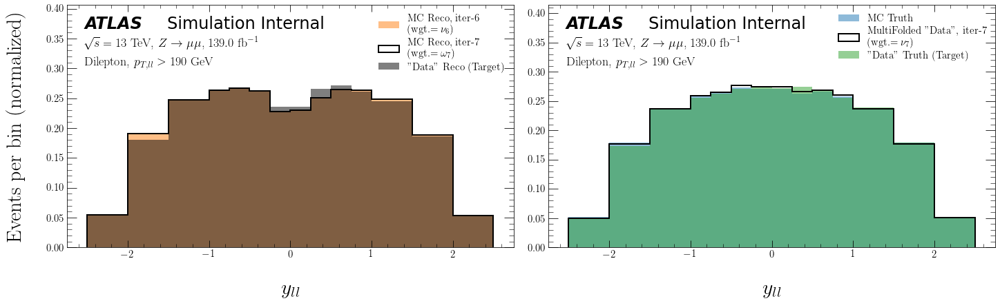

ITERATION 8:


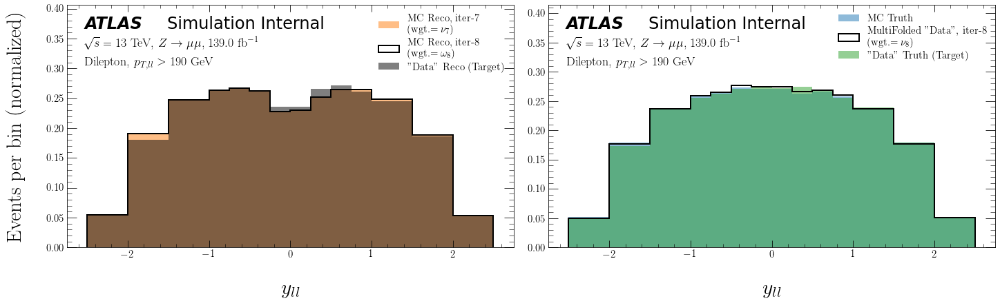

ITERATION 9:


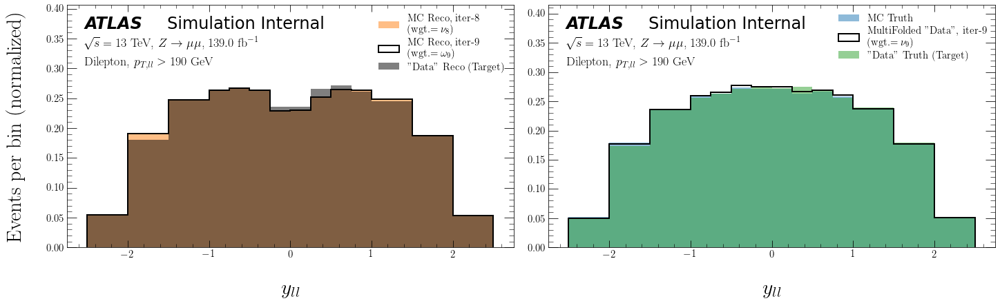

ITERATION 10:


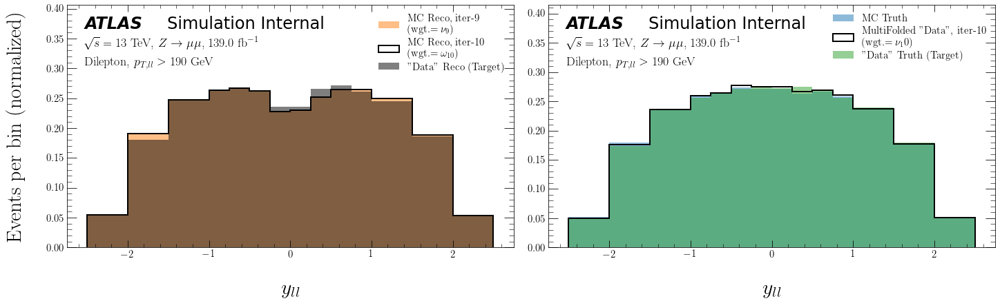

pT_l1 Results

ITERATION 1:


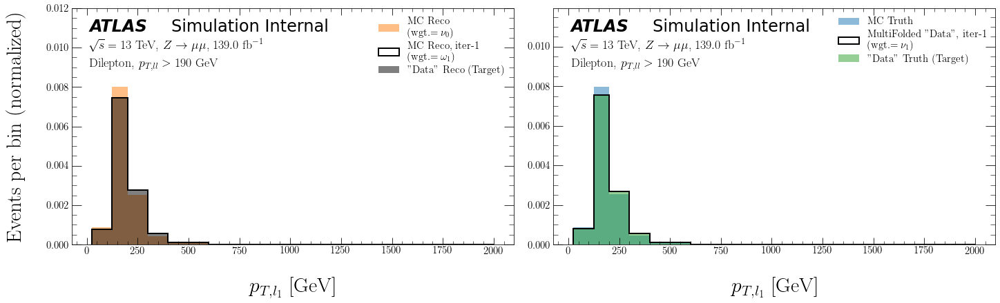

ITERATION 2:


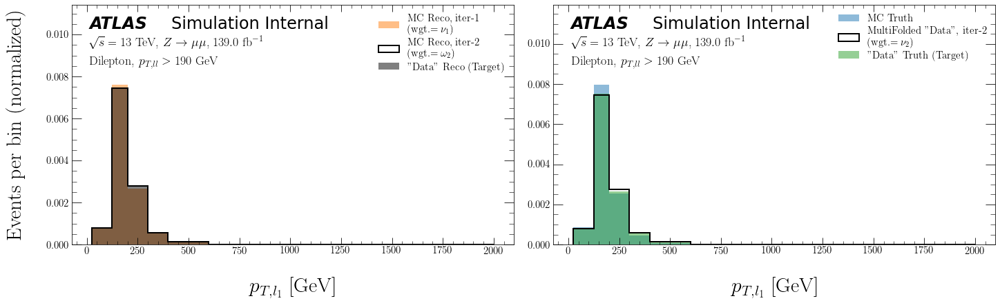

ITERATION 3:


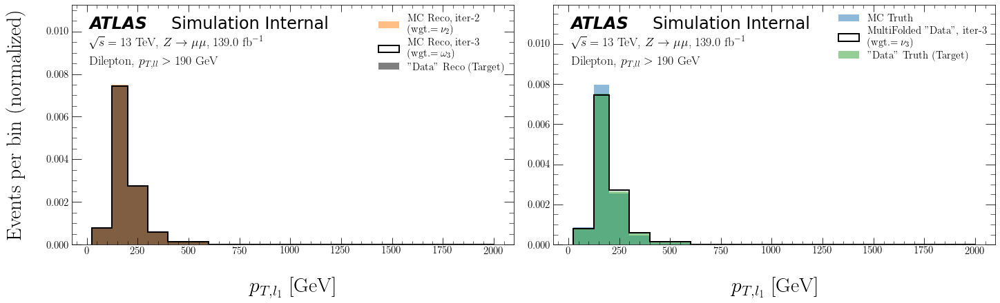

ITERATION 4:


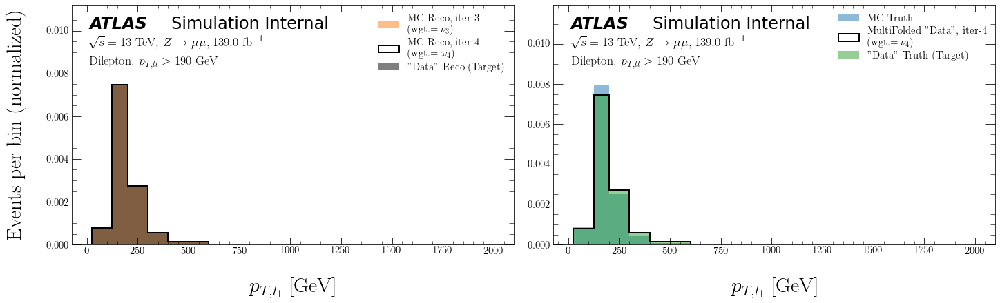

ITERATION 5:


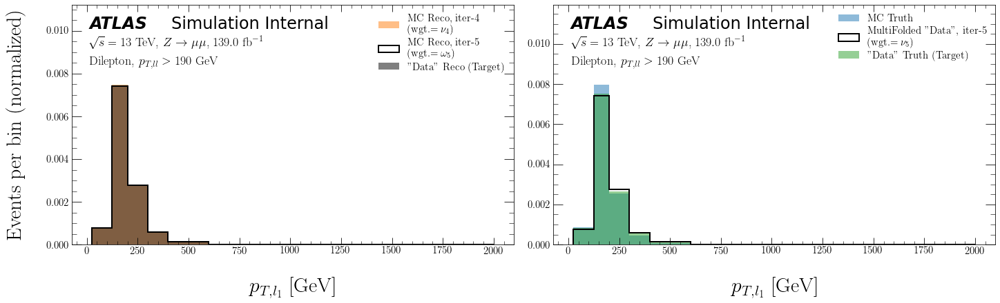

ITERATION 6:


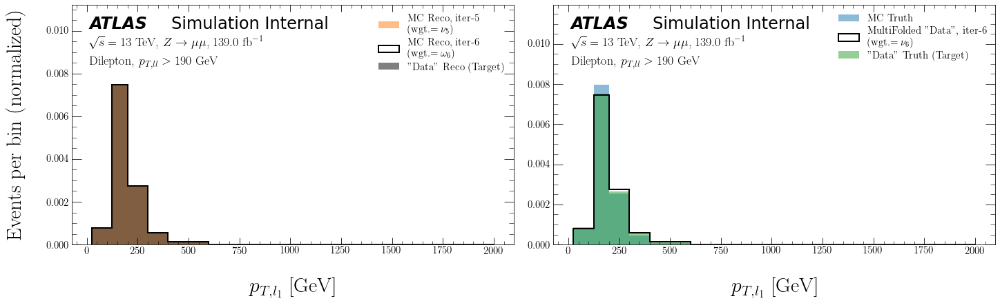

ITERATION 7:


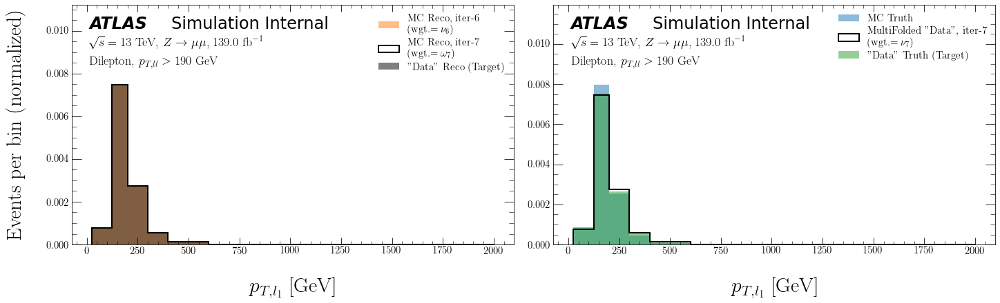

ITERATION 8:


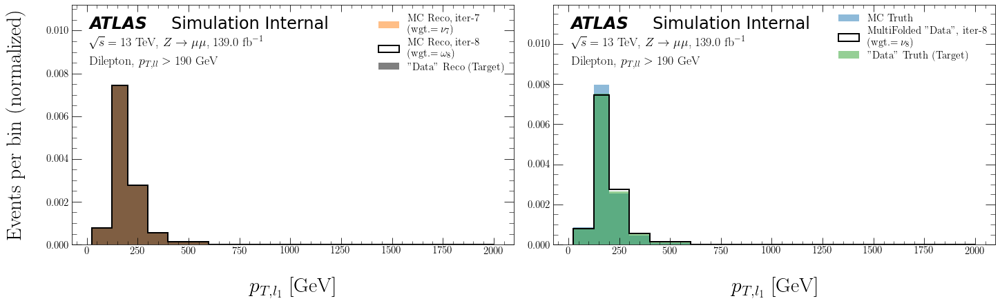

ITERATION 9:


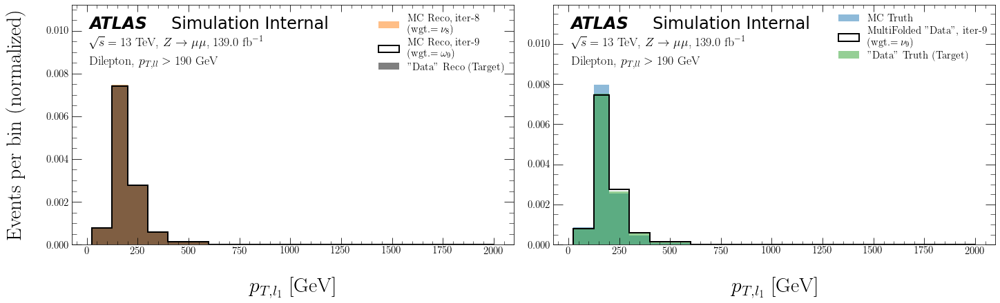

ITERATION 10:


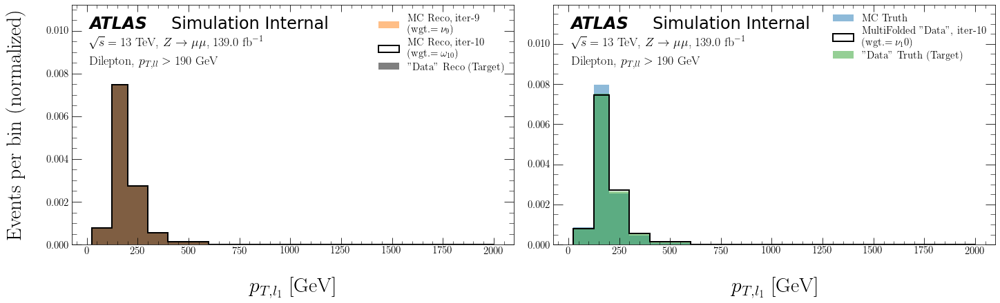

pT_l2 Results

ITERATION 1:


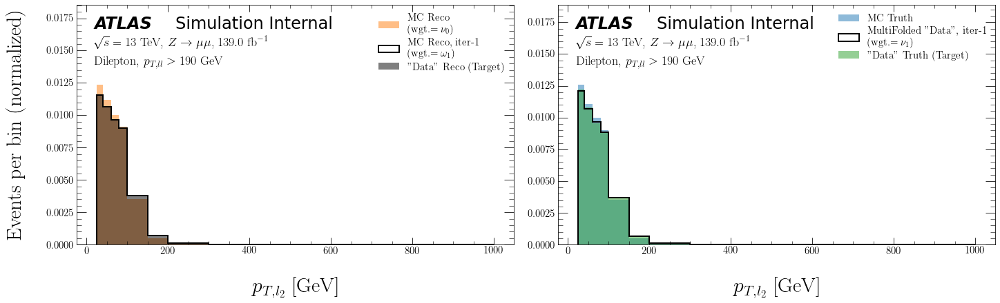

ITERATION 2:


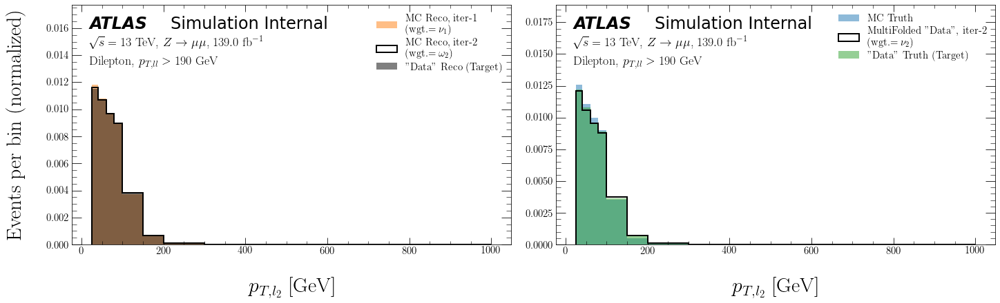

ITERATION 3:


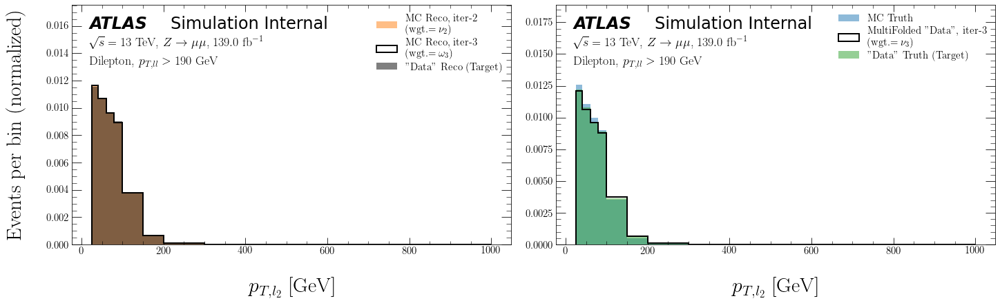

ITERATION 4:


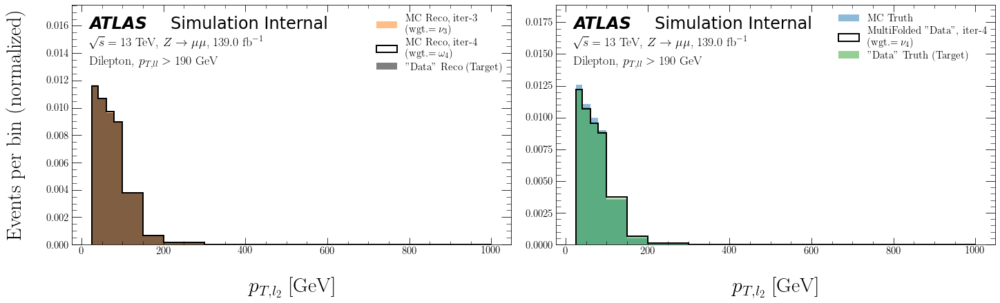

ITERATION 5:


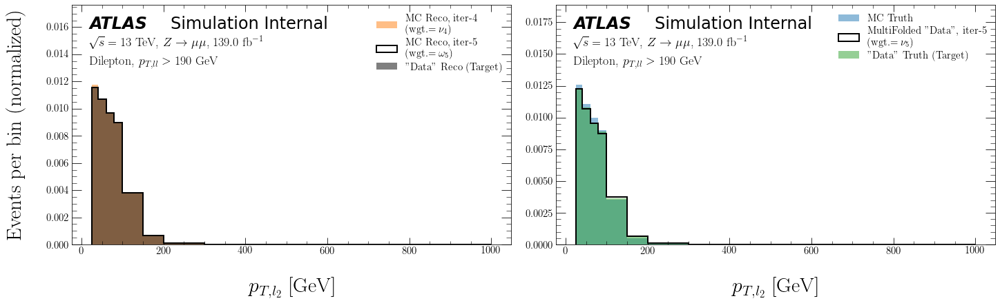

ITERATION 6:


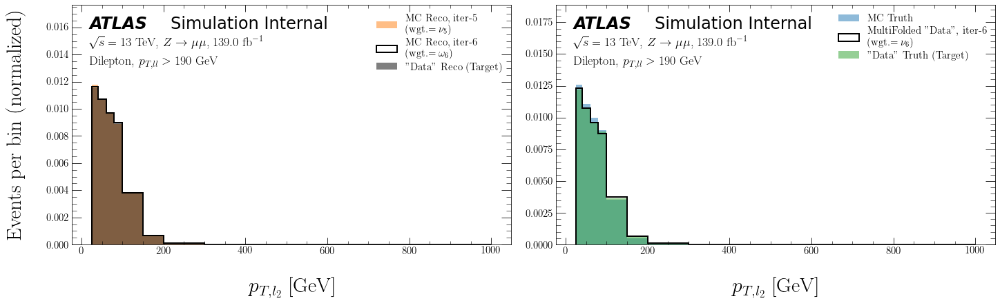

ITERATION 7:


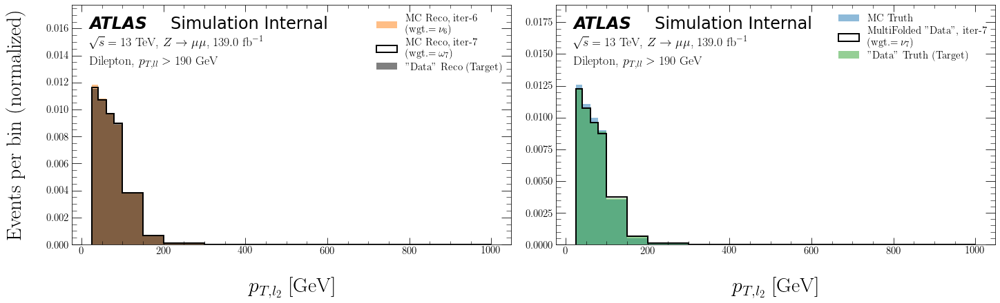

ITERATION 8:


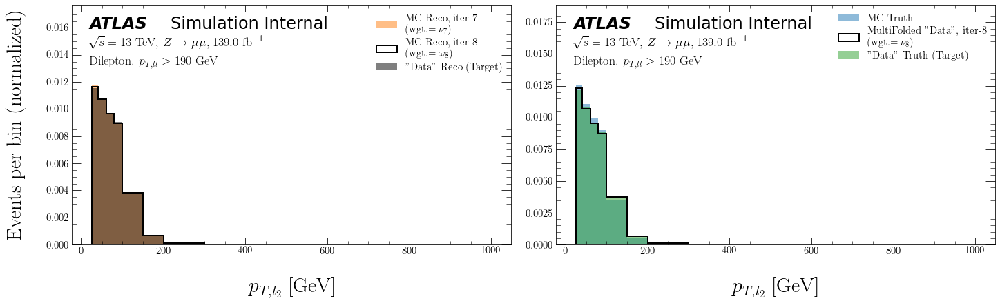

ITERATION 9:


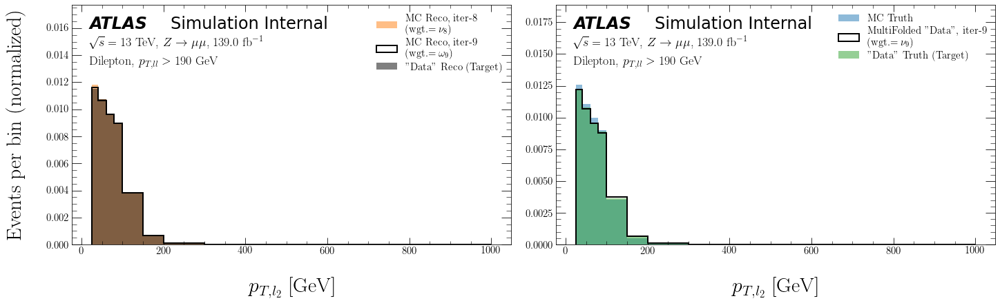

ITERATION 10:


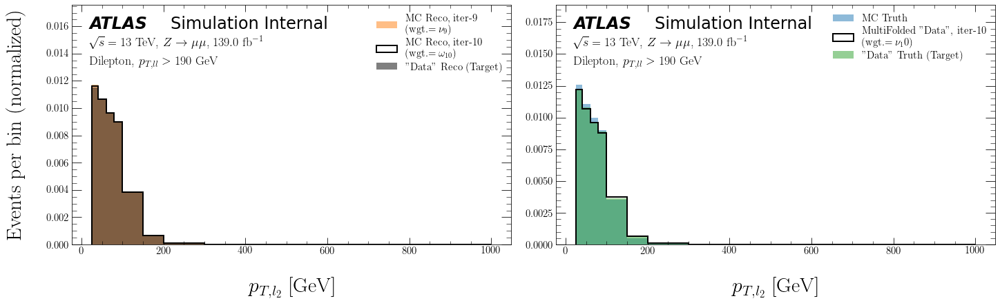

eta_l1 Results

ITERATION 1:


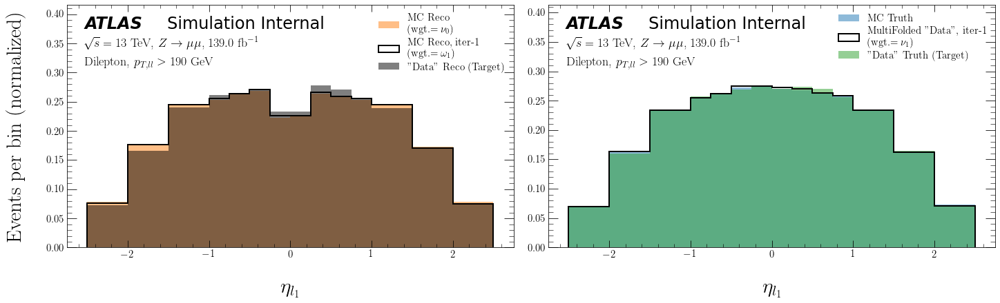

ITERATION 2:


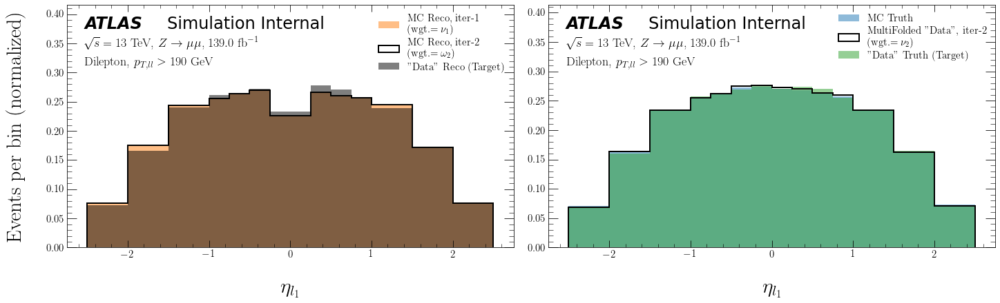

ITERATION 3:


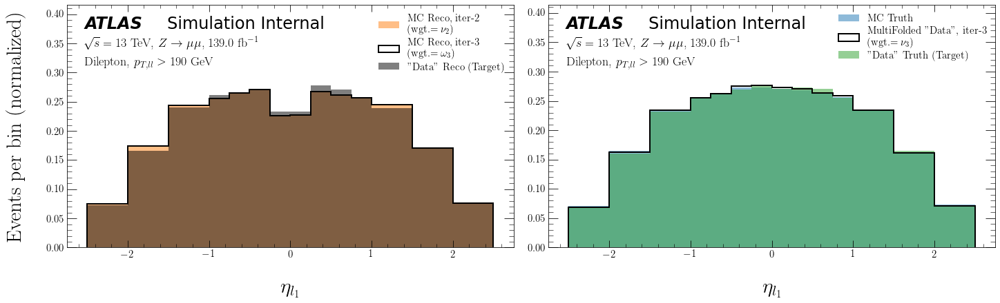

ITERATION 4:


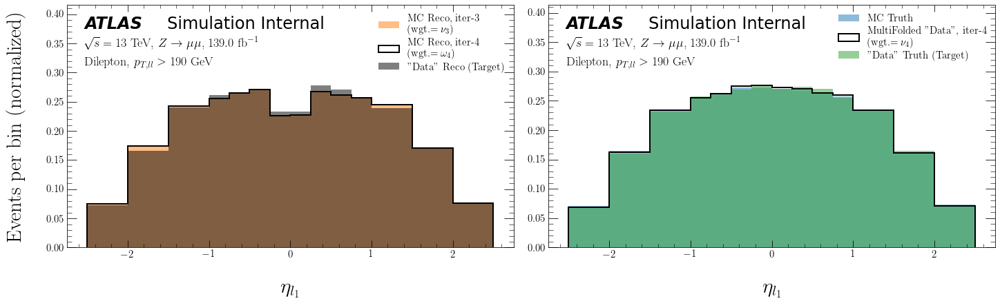

ITERATION 5:


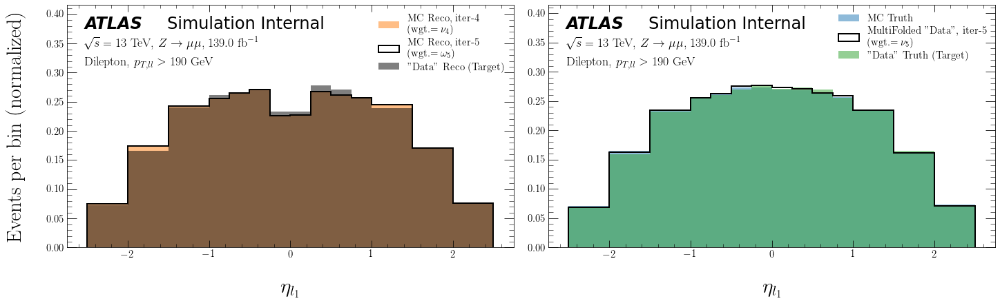

ITERATION 6:


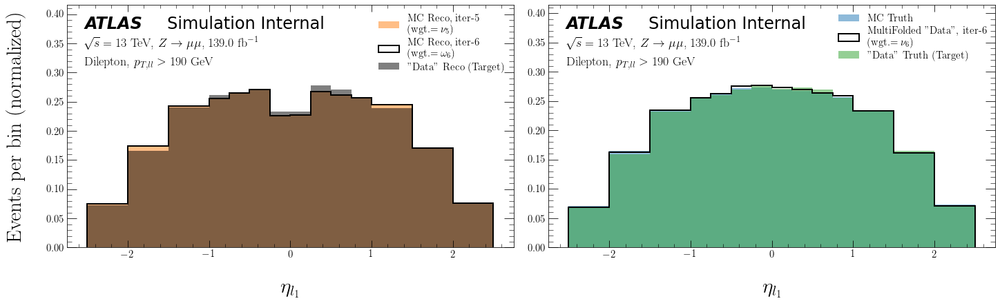

ITERATION 7:


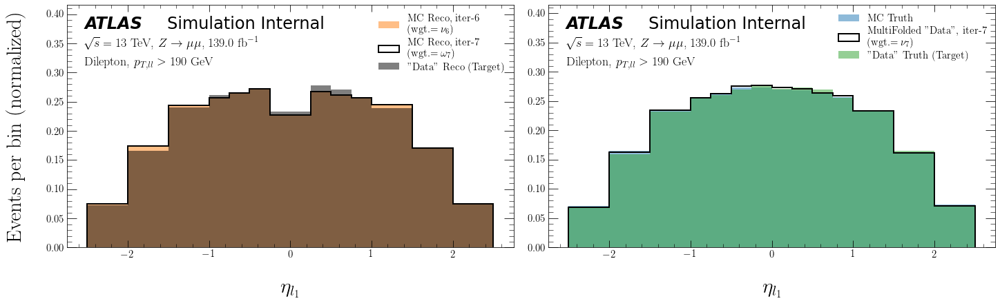

ITERATION 8:


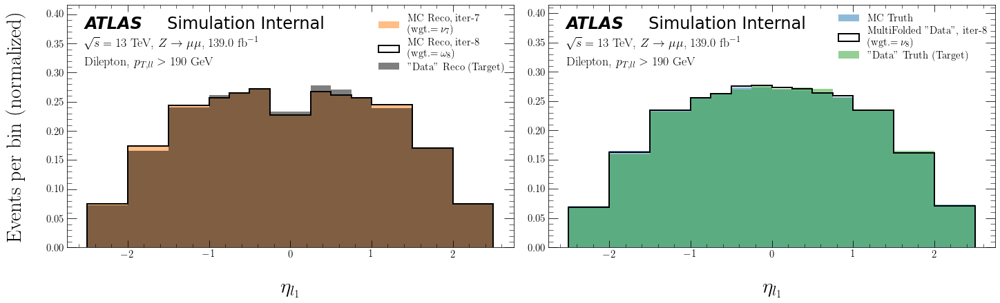

ITERATION 9:


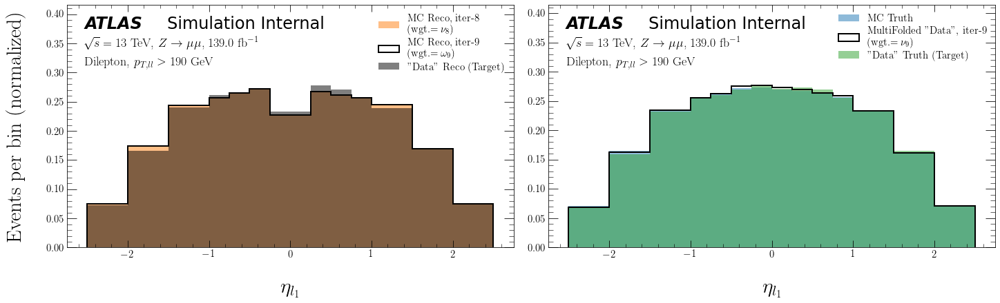

ITERATION 10:


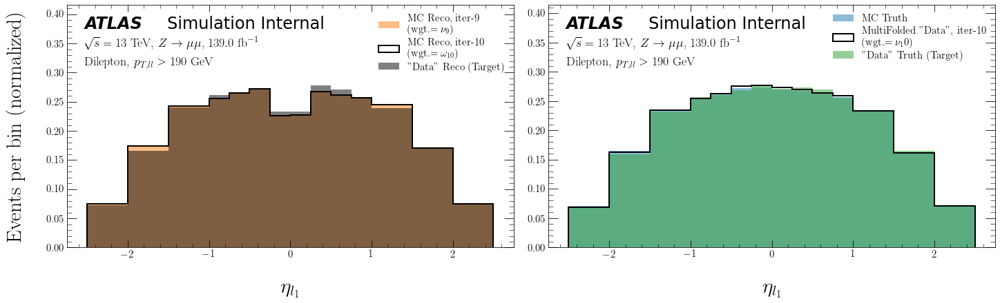

eta_l2 Results

ITERATION 1:


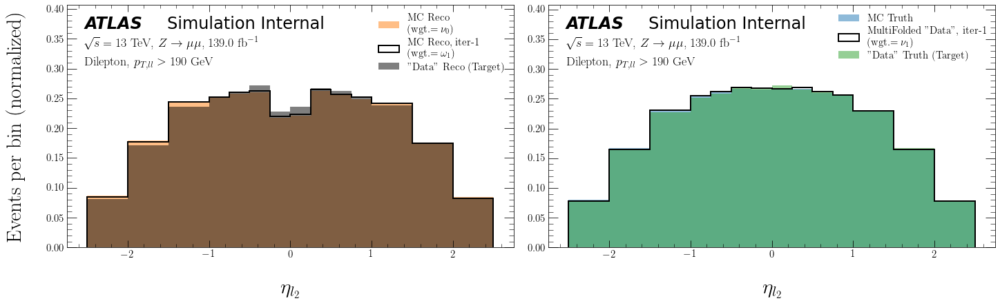

ITERATION 2:


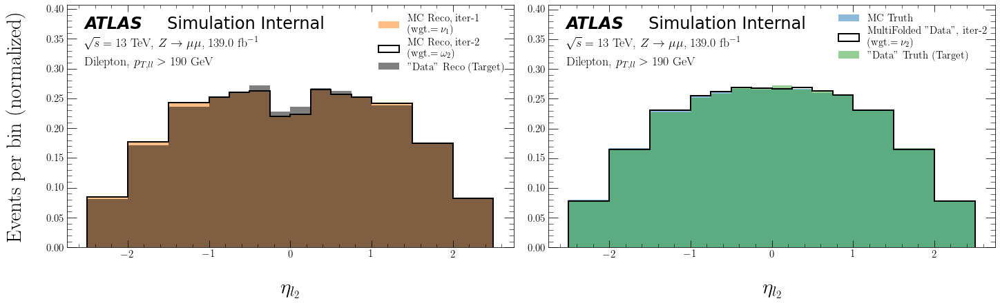

ITERATION 3:


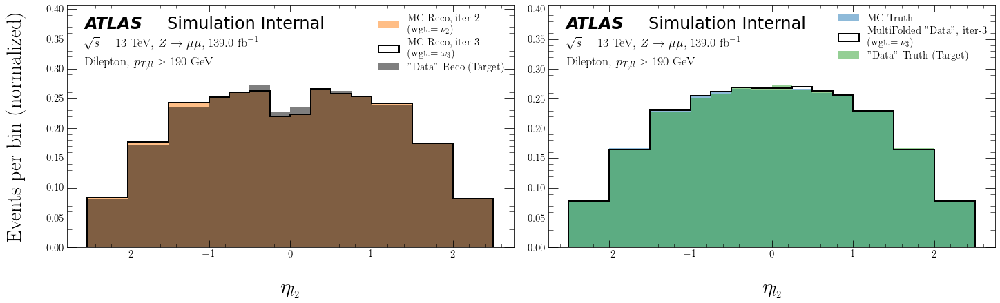

ITERATION 4:


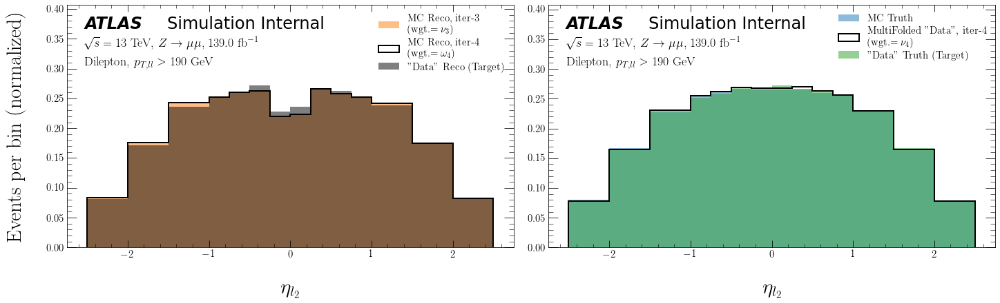

ITERATION 5:


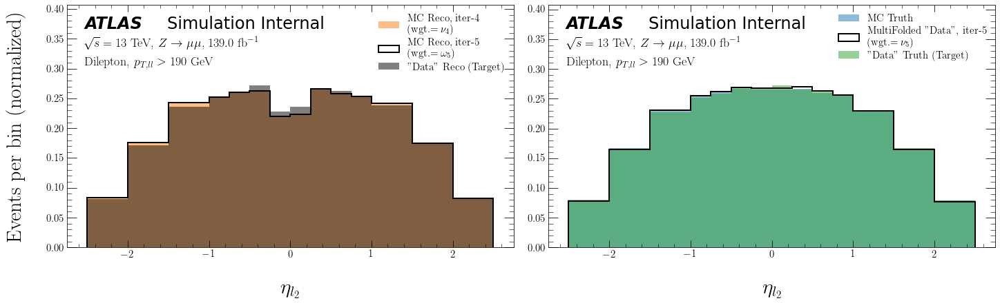

ITERATION 6:


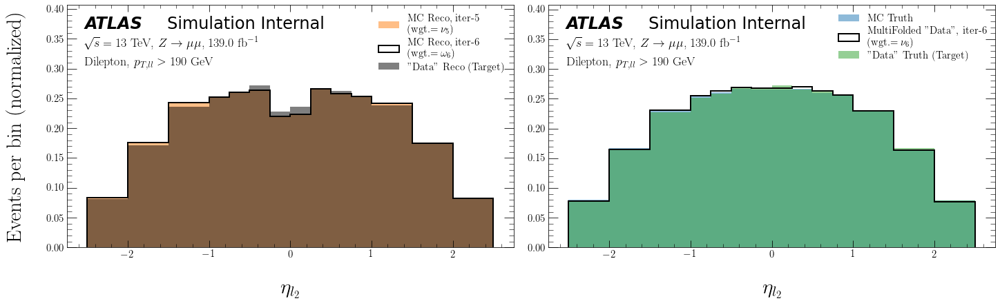

ITERATION 7:


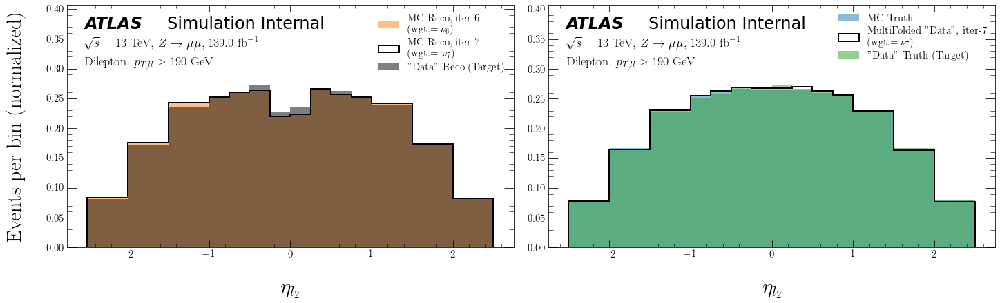

ITERATION 8:


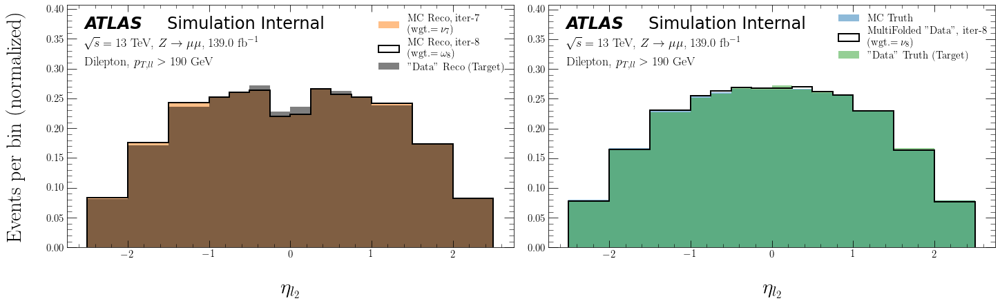

ITERATION 9:


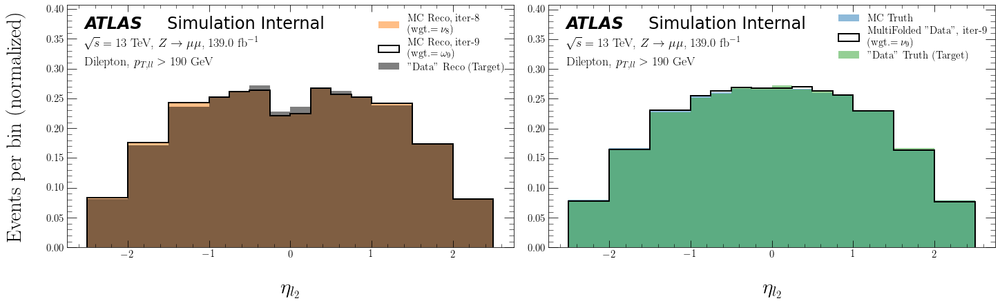

ITERATION 10:


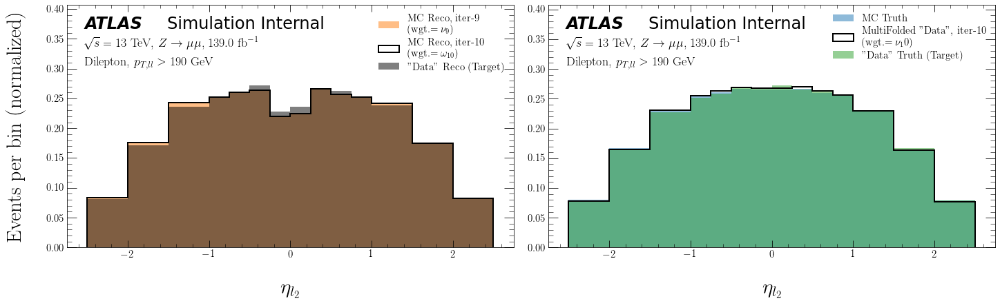

phi_l1 Results

ITERATION 1:


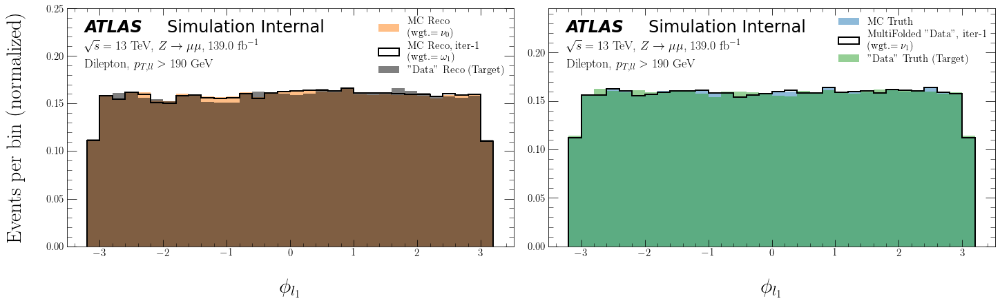

ITERATION 2:


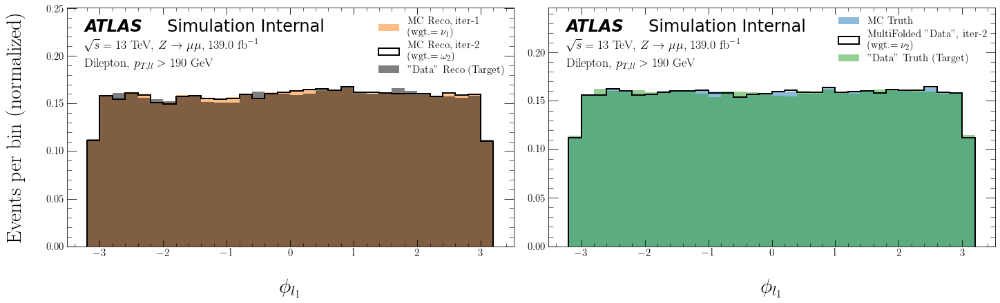

ITERATION 3:


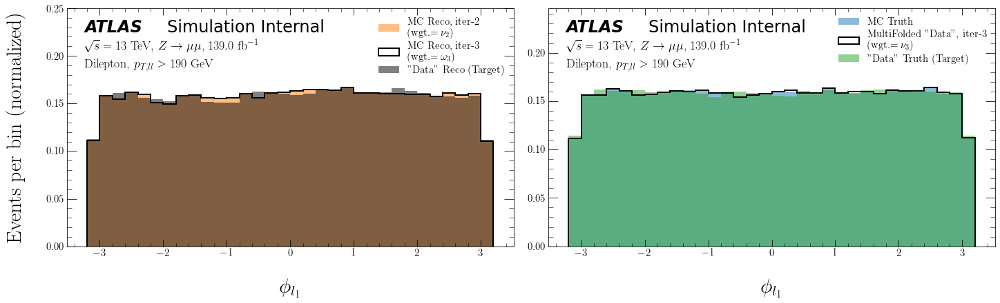

ITERATION 4:


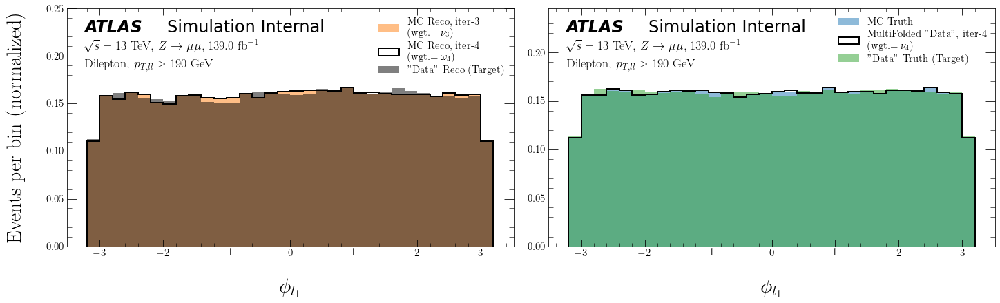

ITERATION 5:


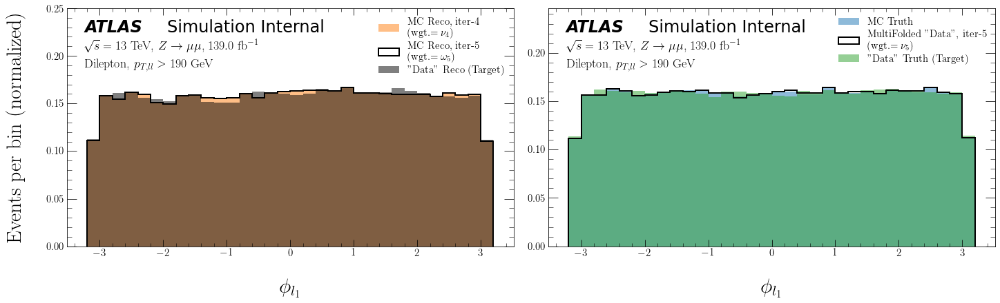

ITERATION 6:


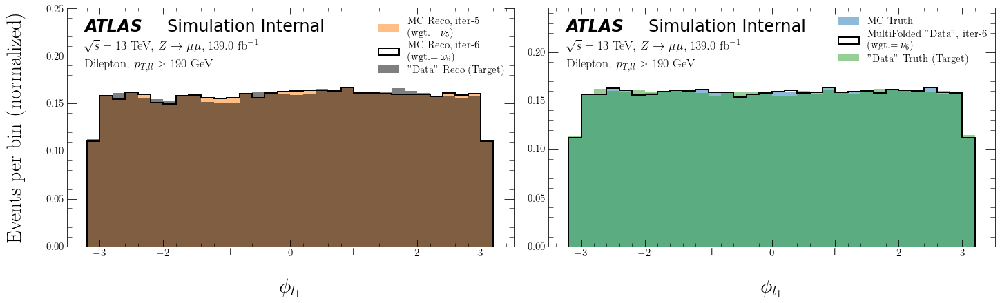

ITERATION 7:


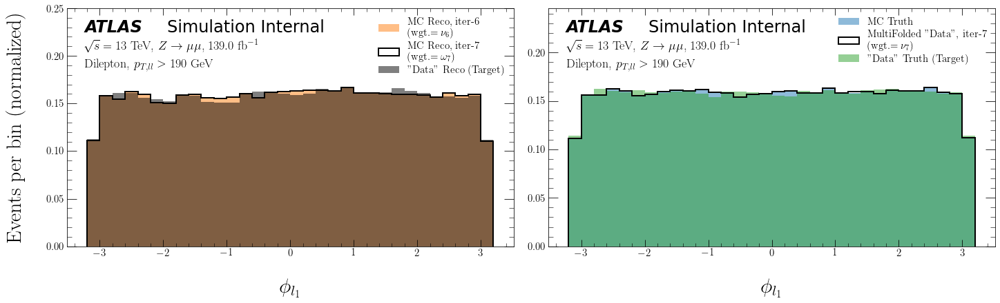

ITERATION 8:


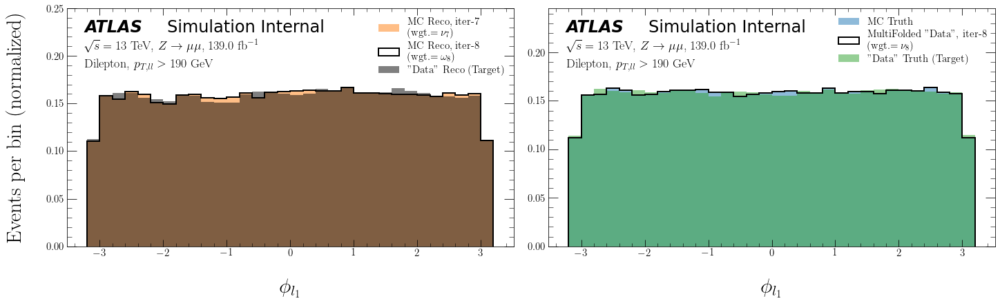

ITERATION 9:


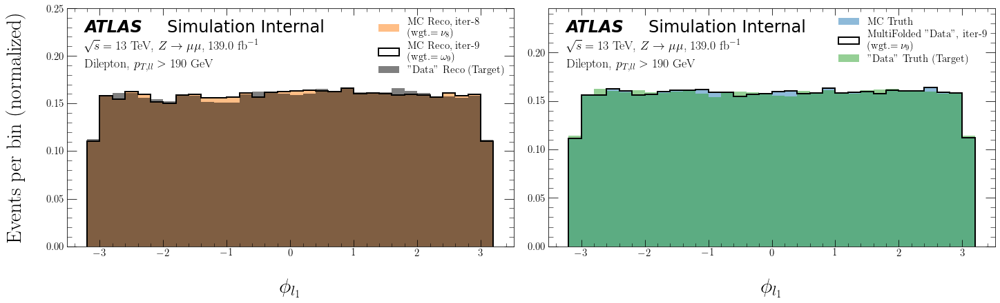

ITERATION 10:


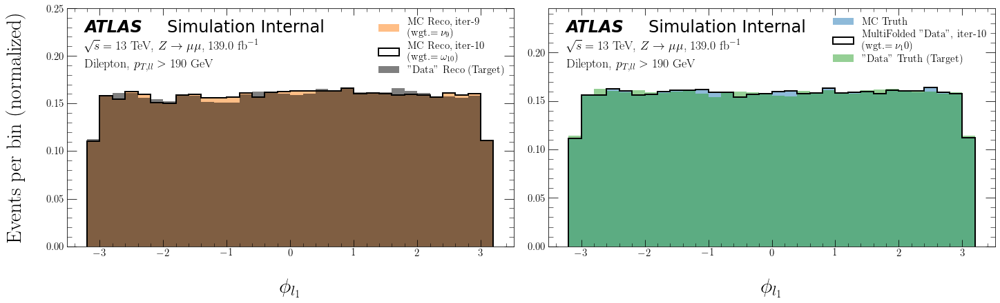

phi_l2 Results

ITERATION 1:


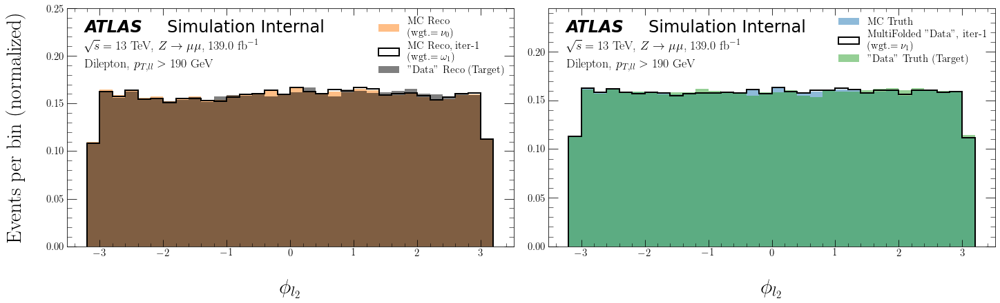

ITERATION 2:


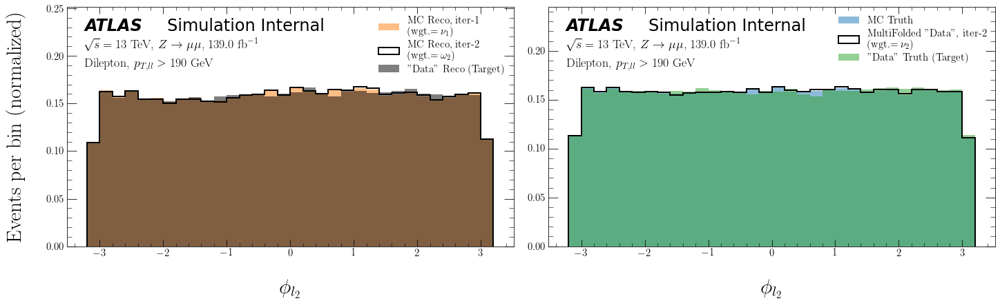

ITERATION 3:


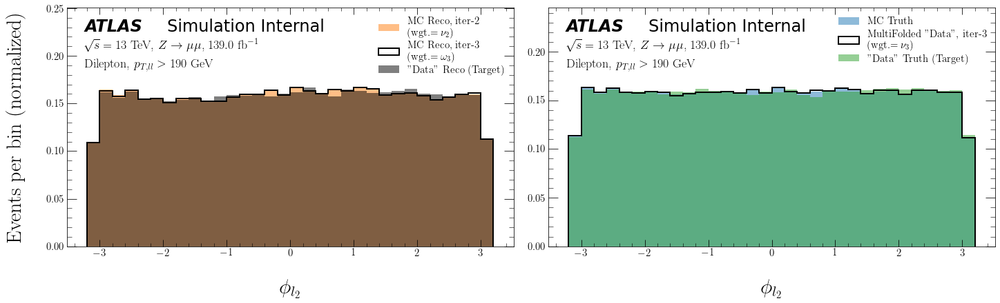

ITERATION 4:


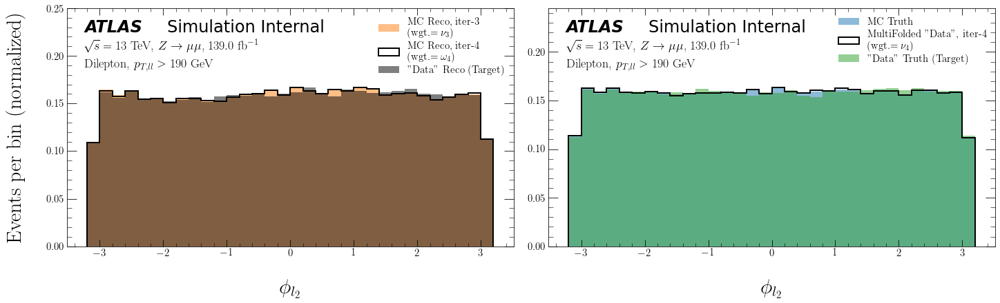

ITERATION 5:


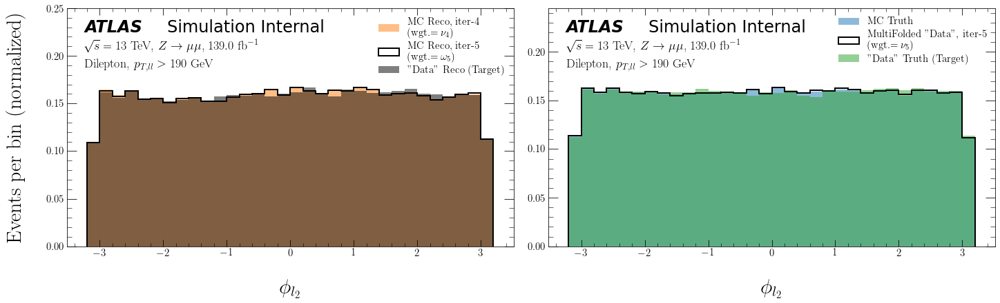

ITERATION 6:


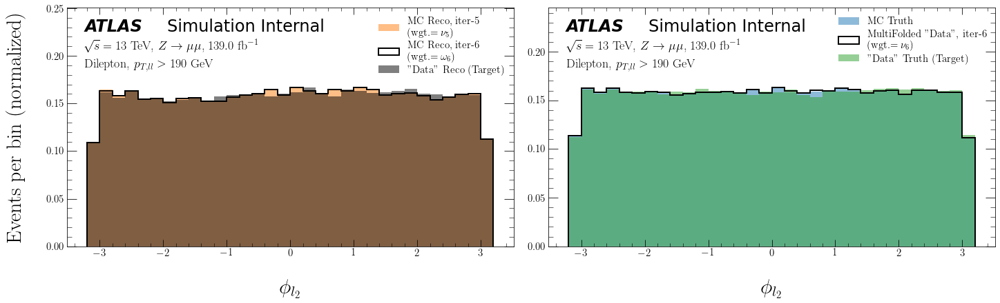

ITERATION 7:


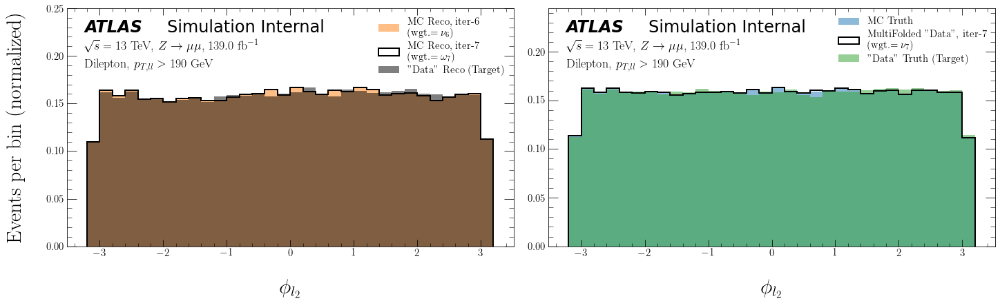

ITERATION 8:


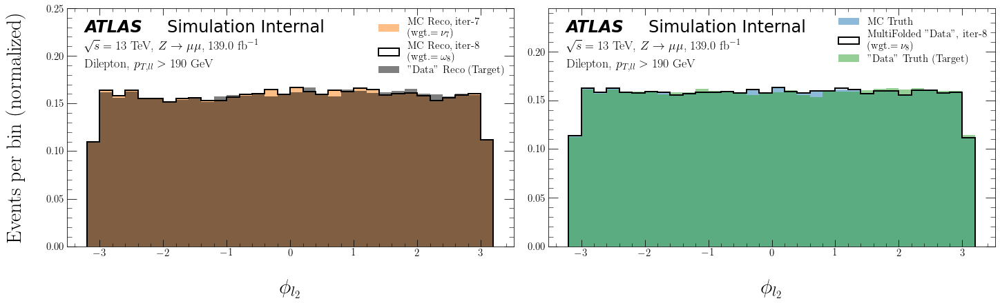

ITERATION 9:


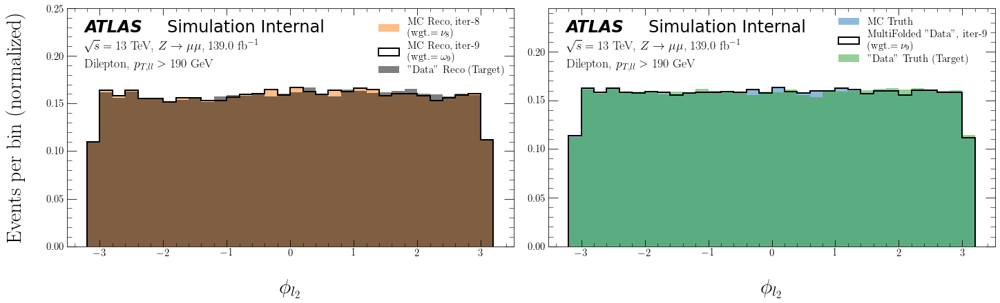

ITERATION 10:


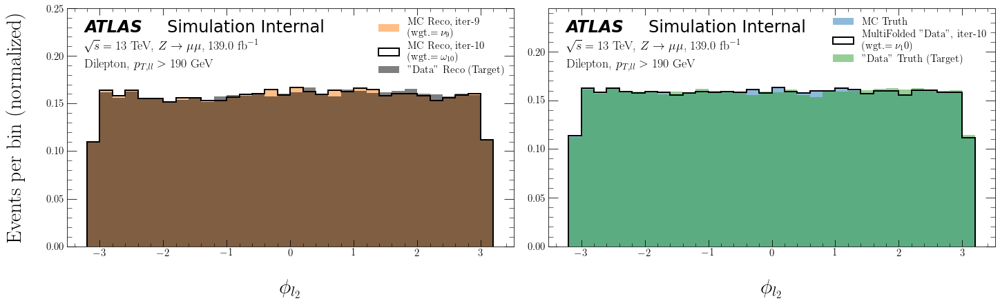

In [90]:
for i in range(len(obs)):
    print(obs[i]['file_label'] + " Results\n")
    bins = obs[i]['bins']
    x_label = obs[i]['plot_label']
    file_label = obs[i]['file_label']
    save_label = plot_dir + '/MultiFold/' + file_label + '/' + save_label0 + '-MultiFold-' + file_label

    plot_results(sim_truth=sim_truth[i],
                 sim_reco=sim_reco[i],
                 sim_truth_weights_MC=sim_truth_weights_MC,
                 sim_reco_weights_MC=sim_reco_weights_MC,
                 data_truth=data_truth[i],
                 data_reco=data_reco[i],
                 data_truth_weights_MC=weights_stress,
                 data_reco_weights_MC=weights_stress,
                 weights=weights,
                 bins=bins,
                 x_label=x_label,
                 flavor_label='MultiFold',
                 save_label=save_label)